In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [402]:
import dowhy
from dowhy import CausalModel

In [24]:
data=pd.read_stata('Form12B.dta')

In [25]:
data2=pd.read_stata('Form12A.dta')

In [248]:
#prescreening
dat=pd.read_stata('Form01.dta')
#Obstric
data3=pd.read_stata('Form02n.dta')
#Not admitted to NICU
data4=pd.read_stata('Form03A.dta')
#admitted to NICU
data5=pd.read_stata('Form03B.dta')

In [27]:
#medicalrecordnumber
#medicalrecord
data3[data3['medicalrecordnumber']==648645.0]

,obstetricid,uniquekey,hospitalname,medicalrecordnumber,maternalage,maritalstatus,formaleducationofmother,occupationofmother,specify,isthismothersfirstpregnancy,...,ifmultiplerecordapgarofbabyb1min,babyb5min,babyc1min,babyc5min,babyd1min,babyd5min,dontknow5,dontknow6,dontknow7,x
2969,SP0930,1080.0,SPH,648645.0,26.0,1.0,4.0,2.0,,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,No,Yes,Yes,


In [28]:
data4[['uniquekey']].head(10)

,uniquekey
0,125
1,61
2,62
3,103
4,104
5,108
6,106
7,105
8,112
9,113


In [238]:
data.tail()

,uniquekey,hospitalid,studyid,medicalrecord,gestationalageweeks,days,days1,postnatalageweeks,ifinfantdiedatorpriortoday28date,causeaccordingtopanelconsensus,...,specify1,data,formcompletedby,dateofcompletion,obstructedlabor,ivh,sepsis,pneumonia,hypoglycaemia,dic
1104,NaN,GUH,GU0014,528369.000,NaN,NaN,NaN,NaN,,2,...,,NaN,,,No,No,No,No,No,No
1105,NaN,JUH,JU0567,695368.000,27.0,NaN,NaN,NaN,,8,...,,NaN,,,No,No,No,No,No,No
1106,NaN,JUH,JU0673,701937.000,31.0,NaN,31.0,NaN,,2,...,,NaN,,,No,No,No,No,No,No
1107,NaN,GUH,GU0463-1,645318.125,NaN,NaN,NaN,NaN,,2,...,,NaN,,,No,No,No,No,No,No
1108,NaN,SPH,SP0486-2,608044.000,NaN,NaN,NaN,NaN,,8,...,,NaN,,,No,No,No,No,No,No


In [225]:
dat[['eligibilityid','medicalrecordnumber']].head(10)

,eligibilityid,medicalrecordnumber
0,GM0001-1,110037.0
1,GM0001-2,110038.0
2,GM0004-1,110377.0
3,GM0004-2,110376.0
4,GM0005-1,110080.0
5,GM0005-2,110081.0
6,GM0007,110068.0
7,GM0008,110138.0
8,GM0009,NaN
9,GM0010,110174.0


In [8]:
dat.columns

Index(['eligibilityid', 'uniquekey', 'hospitalname', 'medicalrecordnumber',
       'dateofscreening', 'didmotherdeliveratoneofthepartic',
       'wasbabytransferredfromotherfacil', 'didbabyhaveapgar1orcriedbreathed',
       'gestationalageinweeksbyballard', 'ballardneuromuscularmaturityscor',
       'ballardphysicalmaturityscore', 'total', 'bestga',
       'doesinfantmeetalleligibilitycrit', 'wasconsentobtained',
       'nameofpersonwhocompletedform', 'nameofpersonwhoreviewform', 'days',
       'isthedateoflmpreliable', 'ifyesfirstdayoflastmenstrualperi',
       'ifyesgestationalagegaatdeliveryi', 'days1', 'wasultrasoundperformed',
       'dateoffirstonlyusexam', 'dontknow', 'trimesterofearliestultrasound',
       'gestationalageatthefirstonlyusex', 'days2',
       'gestationalageatdeliverybasedonf', 'days3', 'dateballardexamdone',
       'ultrasoundwasdoneat28weeks', 'ifultrasoundat28weeksandeitherva',
       'ifnousvalidlmpandballardexamdone', 'v35',
       'ifnousandvalidlmpballardw

In [9]:
data.columns

Index(['uniquekey', 'hospitalid', 'studyid', 'medicalrecord',
       'gestationalageweeks', 'days', 'days1', 'postnatalageweeks',
       'ifinfantdiedatorpriortoday28date', 'causeaccordingtopanelconsensus',
       'specify', 'degreeofcertaintyforprimarycause', 'congenitalmalformation',
       'hyaliniemembranedisease', 'asphyxia', 'pphn', 'pph', 'ttn', 'nec',
       'meningitis', 'hypothermia', 'apnea', 'jaundice', 'anemia',
       'renalfailure', 'tetanus', 'other', 'cordprolapsecomplication',
       'signsoffetaldistress', 'antenatalhemorrhage', 'preeclampsiaeclampsia',
       'maternalsignsofinfection', 'chorioamnionitis', 'other1', 'specify2',
       'specify1', 'data', 'formcompletedby', 'dateofcompletion',
       'obstructedlabor', 'ivh', 'sepsis', 'pneumonia', 'hypoglycaemia',
       'dic'],
      dtype='object')

In [10]:
data3.columns

Index(['obstetricid', 'uniquekey', 'hospitalname', 'medicalrecordnumber',
       'maternalage', 'maritalstatus', 'formaleducationofmother',
       'occupationofmother', 'specify', 'isthismothersfirstpregnancy',
       ...
       'ifmultiplerecordapgarofbabyb1min', 'babyb5min', 'babyc1min',
       'babyc5min', 'babyd1min', 'babyd5min', 'dontknow5', 'dontknow6',
       'dontknow7', 'x'],
      dtype='object', length=126)

In [11]:
data3[['obstetricid','medicalrecordnumber']].head(10)

,obstetricid,medicalrecordnumber
0,GM0001-1,110037.0
1,GM0001-2,110037.0
2,GM0004-1,110377.0
3,GM0004-2,110377.0
4,GM0005-1,110080.0
5,GM0005-2,110080.0
6,GM0007,110068.0
7,GM0008,110138.0
8,GM0009,NaN
9,GM0010,110174.0


In [175]:
data4.columns

Index(['followupid', 'uniquekey', 'hospitalname', 'medicalrecordnumber',
       'dateofbirth', 'timeofbirth', 'infantsex', 'birthweightingrams',
       'birthplace', 'hospname', 'specify', 'homeaddress', 'gottketana',
       'healthextensionworkername', 'ifknowncellnumber', 'dateofexam',
       'timeofexam', 'hrs', 'days', 'respiratoryrate', 'apicalheartrate',
       'temperature', 'weightatexam', 'hlength', 'headcircumference',
       'levelofconsciousness', 'movementoractivity', 'dysmorphicfeatures',
       'bestgestationalageinweeksatdeliv', 'days1', 'azone', 'townorworeda',
       'kebele', 'notdone', 'notdone1', 'notdone2', 'notdone3', 'notdone4',
       'notdone5', 'skull', 'face', 'eye', 'nose', 'ears', 'mouth', 'neck',
       'respiratorysystem', 'cardiovascularsystem', 'abdomen',
       'genitourinarysystem', 'skin', 'umbilicalstump',
       'musculoskeletalsystem', 'neurologicalsystemincdhxorcurren',
       'reflexesappropriateforage', 'evaluationdoneby', 'formcheckedby',
   

In [12]:
data4[['followupid','medicalrecordnumber']].head(10)

,followupid,medicalrecordnumber
0,GM0248,NaN
1,GM0318-1,NaN
2,GM0318-2,NaN
3,GM0327-1,NaN
4,GM0327-2,NaN
5,GM0337,NaN
6,GM0339,NaN
7,GM0340,NaN
8,GM0341-1,NaN
9,GM0341-2,NaN


In [13]:

dat[dat['eligibilityid']=='GU0014']

,eligibilityid,uniquekey,hospitalname,medicalrecordnumber,dateofscreening,didmotherdeliveratoneofthepartic,wasbabytransferredfromotherfacil,didbabyhaveapgar1orcriedbreathed,gestationalageinweeksbyballard,ballardneuromuscularmaturityscor,...,gestationalageatdeliverybasedonf,days3,dateballardexamdone,ultrasoundwasdoneat28weeks,ifultrasoundat28weeksandeitherva,ifnousvalidlmpandballardexamdone,v35,ifnousandvalidlmpballardwasdone7,gestationalageis37weeksorgawasno,datecompletedformreviewed
439,GU0014,51,GUH,529636.08,25-07-2016,Yes,Yes,Yes,NaN,8.0,...,NaN,NaN,25-07-2016,No,No,No,No,Yes,No,


In [14]:
data5.columns

Index(['nicuadmid', 'uniquekey', 'hospitalname', 'medicalrecord',
       'dateofbirth', 'timeofbirth', 'infantsex', 'birthweightingrams',
       'birthplace', 'hospname',
       ...
       'renalfailure', 'traumaticbirthinjury', 'hypothermia', 'uvelectomy',
       'circumcisions', 'other', 'miscellaneousspecify',
       'nameofpersoncompletingthisform', 'nameofpersonreviewingthisform',
       'dateofformcompletion'],
      dtype='object', length=277)

In [249]:
#rename the columns of the original data,obstric,NICU,NONICU,Death so that you can merge them
ScreenedMothers=dat.rename(columns={'eligibilityid':'StudyID'})
Obtric=data3.rename(columns={'obstetricid':'StudyID'})
NICU=data5.rename(columns={'nicuadmid':'StudyID'})


In [250]:
NoNICU=data4.rename(columns={'followupid':'StudyID'})
Deaths=data.rename(columns={'studyid':'StudyID'})

In [251]:
#Add ICU column with 'Yes' value to identify which study attendants have used ICU and to identify from those not using
NICU=NICU.assign(ICU='Yes')

In [252]:
#Add a column died yes to 'Deaths' data so that you can see the effect of ICU, NON ICU, and others on death
Deaths=Deaths.assign(Died='Yes')

In [253]:
#firts Merge the  Screened mother and mothers tested  Obtric 
screened_obstric=pd.merge(ScreenedMothers,Obtric, on='StudyID', how='inner')

In [254]:
#Next Merge the  screened_obstric with childs taken to NICU
screenedobstricICU=pd.merge(screened_obstric,NICU, on='StudyID', how='outer')

In [255]:
screenedobstricICU.drop(columns='uniquekey_x',axis=1,inplace=True)

In [258]:
screenedobstricICU.drop(columns='uniquekey_y',inplace=True,axis=1)

In [259]:
# Make Deaths a base and merged screenedobstricICU to it
screenedobstricICUDDied=pd.merge(Deaths,screenedobstricICU, on='StudyID', how='outer')

In [260]:
#Note that the died infants were not filtered
len(screenedobstricICUDDied)

In [261]:

#From the  outer Merged  Deaths and screenedobstricICU filter only the death from the whole dataset where the 'Death' was a base
CleanedMergedMod=screenedobstricICUDDied[screenedobstricICUDDied['Died']=='Yes']

In [262]:
len(CleanedMergedMod)

In [50]:
screenedobstricICUDeathT=pd.merge(Deaths,Back, on='StudyID', how='outer')

In [51]:
d=screenedobstricICUDeathT[screenedobstricICUDeathT['ICU']=='Yes']

In [264]:
CleanedMergedMod[['ICU']].isnull().sum()

ICU    0
dtype: int64

In [250]:
original=dat['eligibilityid'].unique()
death=data['studyid'].unique()
obstric=data3['obstetricid'].unique()
NonNICU=data4['followupid'].unique()
NICU=data5['nicuadmid'].unique()

(4919, 126)

In [56]:
data.columns

Index(['uniquekey', 'hospitalid', 'studyid', 'medicalrecord',
       'gestationalageweeks', 'days', 'days1', 'postnatalageweeks',
       'ifinfantdiedatorpriortoday28date', 'causeaccordingtopanelconsensus',
       'specify', 'degreeofcertaintyforprimarycause', 'congenitalmalformation',
       'hyaliniemembranedisease', 'asphyxia', 'pphn', 'pph', 'ttn', 'nec',
       'meningitis', 'hypothermia', 'apnea', 'jaundice', 'anemia',
       'renalfailure', 'tetanus', 'other', 'cordprolapsecomplication',
       'signsoffetaldistress', 'antenatalhemorrhage', 'preeclampsiaeclampsia',
       'maternalsignsofinfection', 'chorioamnionitis', 'other1', 'specify2',
       'specify1', 'data', 'formcompletedby', 'dateofcompletion',
       'obstructedlabor', 'ivh', 'sepsis', 'pneumonia', 'hypoglycaemia',
       'dic'],
      dtype='object')

In [57]:
data2.columns

Index(['studyid', 'uniquekey', 'ifinfantdiedatorpriortoday28date',
       'wasconsentforautopsycontained', 'researcherobservationbasedonclin',
       'specify1', 'other', 'congenitalmalformation1',
       'hyaliniemembranedisease1', 'pph1', 'pphn1', 'ivh1', 'sepsis1',
       'pneumonia1', 'meningitis1', 'nec1', 'hypothermia1', 'apnea1',
       'jaundice1', 'anemia1', 'renalfailure1', 'tetanus1', 'other1',
       'specify3', 'hospitalid', 'medicalrecord', 'gestationalageweeks',
       'days', 'postnatalageweeks', 'days1', 'timeofdeath', 'hypoglycaemia',
       'dic', 'obstructedlabor1', 'cordprolapsecomplication1',
       'signsoffetaldistress1', 'antenatalhemorrhage1',
       'preeclampsiaeclampsia1', 'maternalsignsofinfection1',
       'chorioamnionitis1', 'other3', 'specify5', 'formcompletedby',
       'dateofcompletion', 'clinicalsummaryinformationnecess', 'asphyxia2'],
      dtype='object')

In [58]:
len(data)

In [59]:
primarycause=data[['causeaccordingtopanelconsensus',
      'congenitalmalformation',
      'hyaliniemembranedisease',
      'asphyxia',
      'dic',
      'pphn',
      'ivh',
      'sepsis',
      'pneumonia',
      'meningitis',
      'nec',
      'hypothermia',
      'apnea',
      'jaundice',
      'anemia',
      'renalfailure',
      'tetanus',
      'hypoglycaemia',
      'other',
      'specify1'
      ]]

In [60]:
len(primarycause)

In [61]:
primarycause.isnull().sum()

causeaccordingtopanelconsensus    0
congenitalmalformation            0
hyaliniemembranedisease           0
asphyxia                          0
dic                               0
pphn                              0
ivh                               0
sepsis                            0
pneumonia                         0
meningitis                        0
nec                               0
hypothermia                       0
apnea                             0
jaundice                          0
anemia                            0
renalfailure                      0
tetanus                           0
hypoglycaemia                     0
other                             0
specify1                          0
dtype: int64

In [69]:
primarycause.columns


Index(['causeaccordingtopanelconsensus', 'congenitalmalformation',
       'hyaliniemembranedisease', 'asphyxia', 'dic', 'pphn', 'ivh', 'sepsis',
       'pneumonia', 'meningitis', 'nec', 'hypothermia', 'apnea', 'jaundice',
       'anemia', 'renalfailure', 'tetanus', 'hypoglycaemia', 'other',
       'specify1'],
      dtype='object')

In [70]:
primarycausev1=primarycause

In [113]:
primarycausev1['specify1'].value_counts()

specify1
                               830
PROM                            34
Twin                            16
Twins                           10
Multiple gestation               7
                              ... 
Fetal Ditress                    1
Cardiac Dissease                 1
Chronic HTN                      1
IUGR, Diabetic, HIV exposed      1
MULTIOLEL GESTATION              1
Name: count, Length: 182, dtype: int64

In [105]:
#preprocessing of  'YES'  to converge to the same value of 'Yes'

primarycausev1['apnea'].replace({'YES': 'Yes'},inplace=True)

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_1777/148818714.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  primarycausev1['apnea'].replace({'YES': 'Yes'},inplace=True)


In [57]:
#preprocessing of  'YES'  to converge to the same value of 'Yes'

primarycausev1['hyaliniemembranedisease'].replace({'yes': 'Yes'},inplace=True)

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_78627/4056994342.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  primarycausev1['hyaliniemembranedisease'].replace({'yes': 'Yes'},inplace=True)


In [17]:
341/len(data)

0.30748422001803427

In [114]:
primarycausev1['congenitalmalformation'].value_counts()/len(primarycausev1) *100

congenitalmalformation
No     97.024346
Yes     2.975654
Name: count, dtype: float64

In [115]:
primarycausev1['hyaliniemembranedisease'].value_counts()/len(primarycausev1) *100

hyaliniemembranedisease
No     69.522092
Yes    30.477908
Name: count, dtype: float64

In [116]:
primarycausev1['asphyxia'].value_counts()/len(primarycausev1) *100

asphyxia
No     91.253381
Yes     8.746619
Name: count, dtype: float64

In [117]:
primarycausev1['dic'].value_counts()/len(primarycausev1) *100

dic
No     98.286745
Yes     1.713255
Name: count, dtype: float64

In [118]:
primarycausev1['pphn'].value_counts()/len(primarycausev1) *100

pphn
No     99.639315
Yes     0.360685
Name: count, dtype: float64

In [119]:
primarycausev1['ivh'].value_counts()/len(primarycausev1) *100

ivh
No     93.86835
Yes     6.13165
Name: count, dtype: float64

In [120]:
primarycausev1['sepsis'].value_counts()/len(primarycausev1) *100

sepsis
No     85.572588
Yes    14.427412
Name: count, dtype: float64

In [121]:
primarycausev1['pneumonia'].value_counts()/len(primarycausev1) *100

pneumonia
No     94.950406
Yes     5.049594
Name: count, dtype: float64

In [122]:
primarycausev1['meningitis'].value_counts()/len(primarycausev1) *100

meningitis
No     99.008115
Yes     0.991885
Name: count, dtype: float64

In [123]:
primarycausev1['nec'].value_counts()/len(primarycausev1) *100

nec
No     97.745717
Yes     2.254283
Name: count, dtype: float64

In [124]:
primarycausev1['hypothermia'].value_counts()/len(primarycausev1) *100

hypothermia
Yes    69.251578
No     30.748422
Name: count, dtype: float64

In [125]:
primarycausev1['apnea'].value_counts()/len(primarycausev1) *100

apnea
No     67.538323
Yes    32.461677
Name: count, dtype: float64

In [126]:

primarycausev1['jaundice'].value_counts()/len(primarycausev1) *100

jaundice
No     88.999098
Yes    11.000902
Name: count, dtype: float64

In [127]:

primarycausev1['anemia'].value_counts()/len(primarycausev1) *100

anemia
No     90.802525
Yes     9.197475
Name: count, dtype: float64

In [128]:

primarycausev1['renalfailure'].value_counts()/len(primarycausev1) *100

renalfailure
No     98.917944
Yes     1.082056
Name: count, dtype: float64

In [129]:
primarycausev1['tetanus'].value_counts()/len(primarycausev1) *100

tetanus
No    100.0
Name: count, dtype: float64

In [130]:
primarycausev1['hypoglycaemia'].value_counts()/len(primarycausev1) *100

hypoglycaemia
No     93.237151
Yes     6.762849
Name: count, dtype: float64

In [131]:

primarycausev1['other'].value_counts()/len(primarycausev1) *100

other
No     82.777277
Yes    17.222723
Name: count, dtype: float64

In [132]:
primarycausev1['specify1'].value_counts()/len(primarycausev1) *100

specify1
                               74.842200
PROM                            3.065825
Twin                            1.442741
Twins                           0.901713
Multiple gestation              0.631199
                                 ...    
Fetal Ditress                   0.090171
Cardiac Dissease                0.090171
Chronic HTN                     0.090171
IUGR, Diabetic, HIV exposed     0.090171
MULTIOLEL GESTATION             0.090171
Name: count, Length: 182, dtype: float64

In [101]:
data2['specify1'].value_counts()/len(data2) *100

specify1
                         92.966637
Unknown                   0.270514
TORCH                     0.270514
TEF                       0.270514
pulmonary hemorrhage      0.270514
                           ...    
Hyperglycemia             0.090171
Respiratory distress      0.090171
conguta infent TORCHS     0.090171
Aspiretion                0.090171
Respiration drstress      0.090171
Name: count, Length: 69, dtype: float64

In [103]:
primarycausev1['specify1'].unique()

array(['TWIN', '', 'Fetal distress', 'PROM', 'Breech',
       'maternal RH diseas', 'oligohydraminor', 'Within HIV positive',
       'Home delivery', 'VDRL Positive', 'Triplets, IUGR++', 'carial CA',
       'Heart disease, HIV positive', 'diabetes',
       'PROM, HIV positive Mother', 'Multiple gestation',
       'Mutiple gestation', 'preedamps', 'Twin gestation',
       'PROM, UTI, Twin', 'Twin gestation, Hemedery',
       'Delivery in vehicle and no support errantable', 'PROM >18h ,Twin',
       'Twin,PROM >18 hours', 'Breach', 'HIV exposed', 'PROM 12hours',
       'Transfers Lic', 'HIV, twin', 'Triplet', 'Home Delivery',
       'Multiple Pregnancy', 'Multiple pregnancy',
       'Premature supture of meabrane home delivery', 'Prom',
       'Mulltiple Pregnancy', 'Haypoglicinea', 'Multipgestion',
       'Hypoglacemia', 'IUGR', 'Maltyle gestation', 'Multiple Gestation',
       'Multrlegestc', 'Trielet', 'multiple fitals', 'anemia', 'Brech',
       'multiple gest Brech', 'Hipohtimia', '

AttributeError: 'numpy.ndarray' object has no attribute 'head'

In [133]:
primarycausev1.isnull().sum()

causeaccordingtopanelconsensus    0
congenitalmalformation            0
hyaliniemembranedisease           0
asphyxia                          0
dic                               0
pphn                              0
ivh                               0
sepsis                            0
pneumonia                         0
meningitis                        0
nec                               0
hypothermia                       0
apnea                             0
jaundice                          0
anemia                            0
renalfailure                      0
tetanus                           0
hypoglycaemia                     0
other                             0
specify1                          0
dtype: int64

In [134]:
result=pd.read_csv('result.csv')

In [135]:
result

,Cause of Death,proportion
0,Congenital malformation,2.97
1,Respiratory Distress Syndrome,30.48
2,Asphyxia,8.75
3,DIC,1.71
4,Persistent Pulmonary Hypertension of the Newbo...,0.36
5,Intraventricular Hemorrhage ...,6.13
6,Sepsis,14.42
7,Pneumonia,5.10
8,Meningitis,1.00
9,NEC,2.25


In [136]:
sortedresult=result.sort_values('proportion',ascending=False)
sortedresult

,Cause of Death,proportion
11,Apnea of prematurity,32.46
10,Hypothermia,30.74
1,Respiratory Distress Syndrome,30.48
17,other,17.22
6,Sepsis,14.42
12,Jaundice,11.00
13,Anemia,9.20
2,Asphyxia,8.75
16,Hypoglycaemia,6.76
5,Intraventricular Hemorrhage ...,6.13


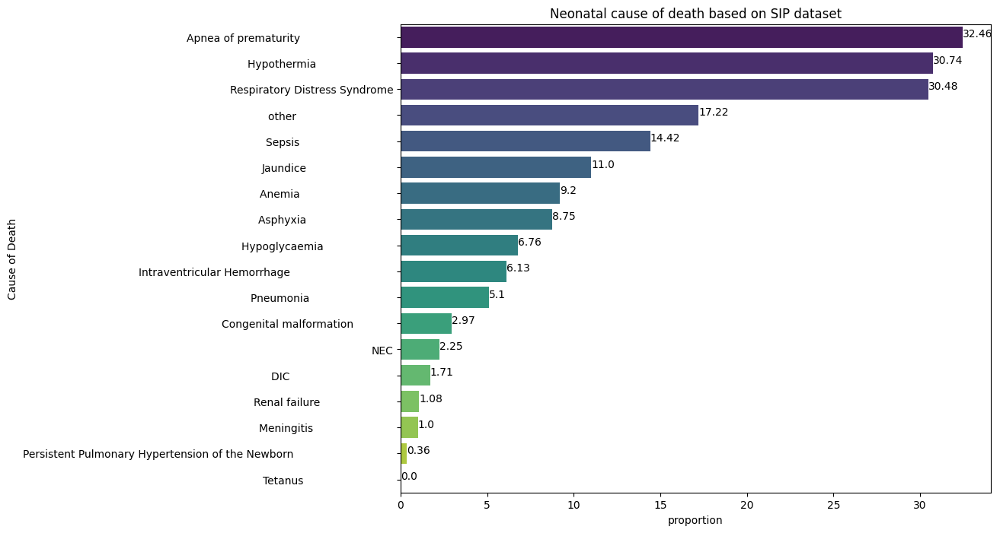

In [137]:
plt.figure(figsize=(10,8))
sns.barplot(sortedresult, x="proportion", y="Cause of Death",palette='viridis').set_title('Neonatal cause of death based on SIP dataset')
y=sortedresult['proportion']
for index, value in enumerate(y):
    plt.text(value, index,str(value))
plt.show()

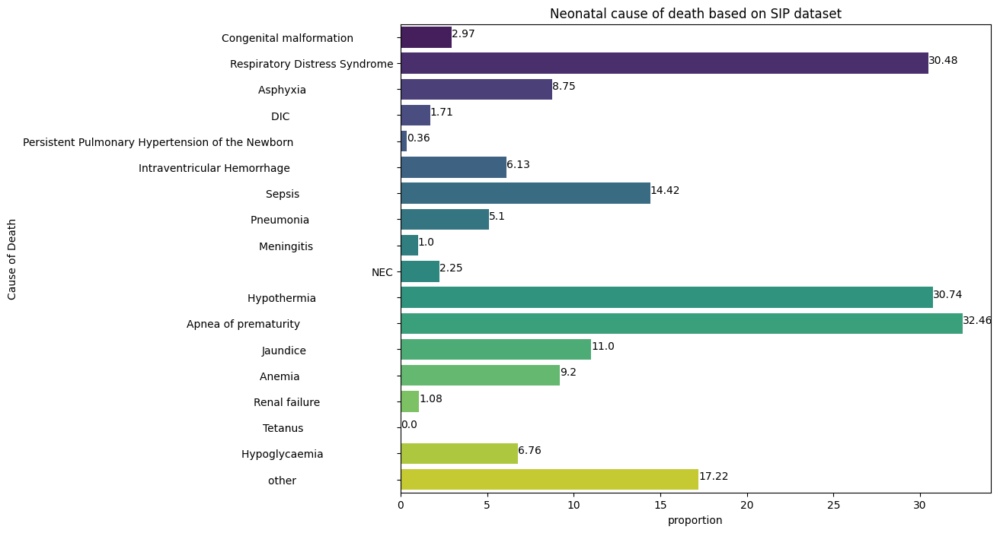

In [138]:
plt.figure(figsize=(10,8))
sns.barplot(result, x="proportion", y="Cause of Death",palette='viridis').set_title('Neonatal cause of death based on SIP dataset')
y=result['proportion']
for index, value in enumerate(y):
    plt.text(value, index,str(value))
plt.show()

In [182]:
cause=data[[
      'congenitalmalformation',
      'hyaliniemembranedisease',
      'asphyxia',
      'dic',
      'pphn',
      'ivh',
      'sepsis',
      'pneumonia',
      'meningitis',
      'nec',
      'hypothermia',
      'apnea',
      'jaundice',
      'anemia',
      'renalfailure',
      'tetanus',
      'hypoglycaemia',
      'other'
      ]]

In [194]:
for col in cause.columns:
    if not (cause[col]=='Yes').empty:
        val=cause[col].value_counts()
        sm=val/len(primarycausev1) *100
        print(sm)

congenitalmalformation
No     97.024346
Yes     2.885482
yes     0.090171
Name: count, dtype: float64
hyaliniemembranedisease
No     69.522092
Yes    29.846709
YES     0.541028
yes     0.090171
Name: count, dtype: float64
asphyxia
No     91.253381
Yes     8.476105
YES     0.270514
Name: count, dtype: float64
dic
No     98.286745
Yes     1.532913
YES     0.180343
Name: count, dtype: float64
pphn
No     99.639315
Yes     0.360685
Name: count, dtype: float64
ivh
No     93.868350
Yes     5.951307
YES     0.180343
Name: count, dtype: float64
sepsis
No     85.572588
Yes    13.886384
YES     0.541028
Name: count, dtype: float64
pneumonia
No     94.950406
Yes     4.779080
YES     0.270514
Name: count, dtype: float64
meningitis
No     99.008115
Yes     0.991885
Name: count, dtype: float64
nec
No     97.745717
Yes     2.254283
Name: count, dtype: float64
hypothermia
Yes     67.087466
No      30.748422
YES      1.172227
YES      0.991885
Name: count, dtype: float64
apnea
No     67.538323
Yes    3

In [198]:
#For maternal related causes, continue here to identify materal risk factors 
data.columns

Index(['uniquekey', 'hospitalid', 'studyid', 'medicalrecord',
       'gestationalageweeks', 'days', 'days1', 'postnatalageweeks',
       'ifinfantdiedatorpriortoday28date', 'causeaccordingtopanelconsensus',
       'specify', 'degreeofcertaintyforprimarycause', 'congenitalmalformation',
       'hyaliniemembranedisease', 'asphyxia', 'pphn', 'pph', 'ttn', 'nec',
       'meningitis', 'hypothermia', 'apnea', 'jaundice', 'anemia',
       'renalfailure', 'tetanus', 'other', 'cordprolapsecomplication',
       'signsoffetaldistress', 'antenatalhemorrhage', 'preeclampsiaeclampsia',
       'maternalsignsofinfection', 'chorioamnionitis', 'other1', 'specify2',
       'specify1', 'data', 'formcompletedby', 'dateofcompletion',
       'obstructedlabor', 'ivh', 'sepsis', 'pneumonia', 'hypoglycaemia',
       'dic'],
      dtype='object')

In [139]:
maternalfactors=data[['obstructedlabor',
                      'cordprolapsecomplication',
                      'signsoffetaldistress',
                      'antenatalhemorrhage',
                      'preeclampsiaeclampsia',
                      'maternalsignsofinfection',
                      'chorioamnionitis'
                     ]]

In [140]:
maternalfactors.head(5)

,obstructedlabor,cordprolapsecomplication,signsoffetaldistress,antenatalhemorrhage,preeclampsiaeclampsia,maternalsignsofinfection,chorioamnionitis
0,No,Yes,No,No,No,No,No
1,No,No,No,No,Yes,No,No
2,No,No,No,No,No,No,No
3,No,No,No,No,No,No,No
4,No,No,No,No,No,No,No


In [150]:
maternalfactors['chorioamnionitis'].unique()

array(['No', 'Yes'], dtype=object)

In [142]:

#Rename 'YES' nad yes to the common 'Yes' and 
maternalfactors['preeclampsiaeclampsia'].replace({'YES': 'Yes'},inplace=True)
maternalfactors['preeclampsiaeclampsia'].replace({'yes': 'Yes'},inplace=True)
maternalfactors['preeclampsiaeclampsia'].replace({'YES ': 'Yes'},inplace=True)

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_1777/384688426.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maternalfactors['preeclampsiaeclampsia'].replace({'YES': 'Yes'},inplace=True)
/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_1777/384688426.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maternalfactors['preeclampsiaeclampsia'].replace({'yes': 'Yes'},inplace=True)
/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_1777/384688426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://

In [218]:
for col in maternalfactors.columns:
    if not (maternalfactors[col]=='Yes').empty:
        val=maternalfactors[col].value_counts()
        sm=val/len(primarycausev1) *100
        print(sm)

obstructedlabor
No     99.639315
Yes     0.360685
Name: count, dtype: float64
cordprolapsecomplication
No     99.008115
Yes     0.991885
Name: count, dtype: float64
signsoffetaldistress
No     99.188458
Yes     0.811542
Name: count, dtype: float64
antenatalhemorrhage
No     92.335437
Yes     7.664563
Name: count, dtype: float64
preeclampsiaeclampsia
No     76.555455
Yes    23.444545
Name: count, dtype: float64
maternalsignsofinfection
No     96.483318
Yes     3.516682
Name: count, dtype: float64
chorioamnionitis
No     95.311091
Yes     4.688909
Name: count, dtype: float64


In [152]:
motherfactor=pd.read_csv('Motherresult.csv')

In [153]:
sortedmotherfactor=motherfactor.sort_values('proportion',ascending=False)
sortedmotherfactor

,Cause of Death,proportion
4,Preeclampsia/eclampsia,23.44
3,Antenatal hemorrhage,7.67
6,Chorioamnionitis,4.68
5,Maternal signs of infection,3.51
1,Cord prolapse/complication,1.00
2,Signs of fetal distress,0.81
0,Obstructed labor,0.36


In [154]:
motherfactor.head(10)

,Cause of Death,proportion
0,Obstructed labor,0.36
1,Cord prolapse/complication,1.00
2,Signs of fetal distress,0.81
3,Antenatal hemorrhage,7.67
4,Preeclampsia/eclampsia,23.44
5,Maternal signs of infection,3.51
6,Chorioamnionitis,4.68


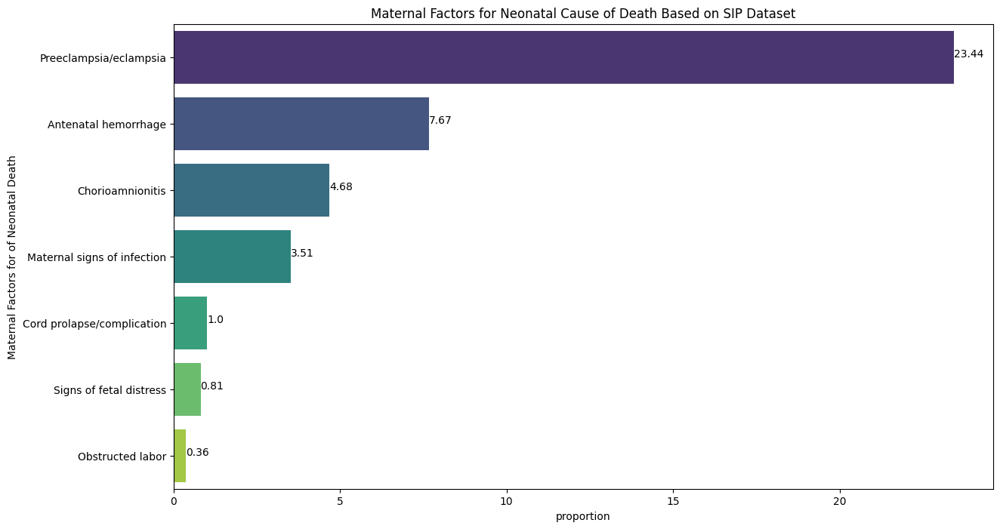

In [155]:
plt.figure(figsize=(14,8))
plt.title("Maternal Factors for Neonatal Cause of Death Based on SIP Dataset")
sns.barplot(sortedmotherfactor, x="proportion", y="Cause of Death",palette='viridis')
#sns.barplot(motherfactor, x="proportion", y="Cause of Death",palette='viridis').sort_values(ascending=False)
y=sortedmotherfactor['proportion']
for index, value in enumerate(y):
    plt.text(value, index,str(value))
plt.ylabel('Maternal Factors for of Neonatal Death')
plt.show()

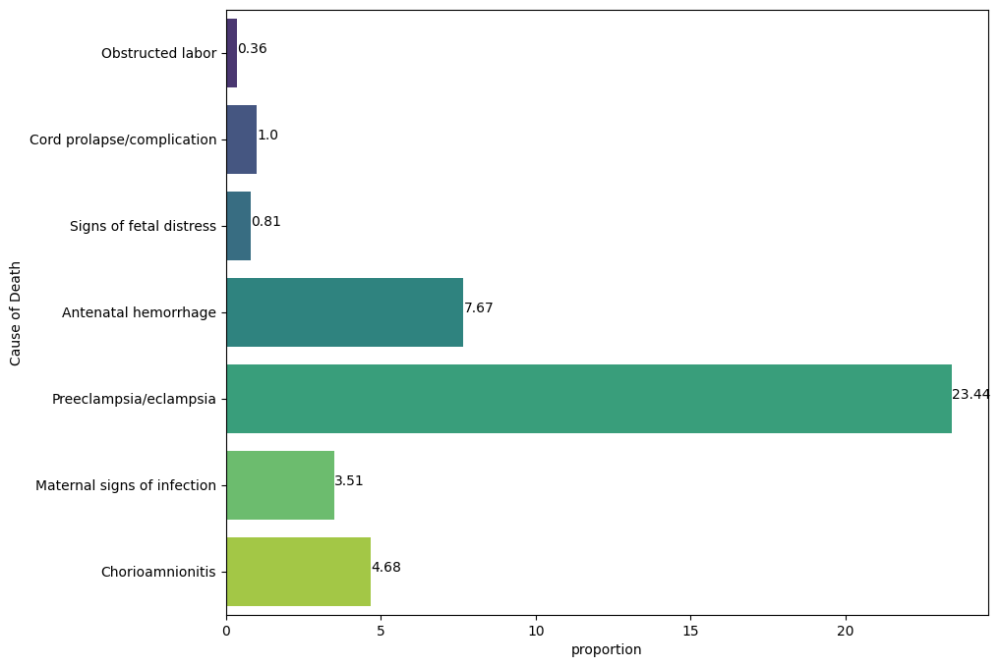

In [156]:
plt.figure(figsize=(10,8))
sns.barplot(motherfactor, x="proportion", y="Cause of Death",palette='viridis')
#sns.barplot(motherfactor, x="proportion", y="Cause of Death",palette='viridis').sort_values(ascending=False)
y=motherfactor['proportion']
for index, value in enumerate(y):
    plt.text(value, index,str(value))
plt.show()

In [ ]:
#Modeling factors will start here 

In [157]:
factors=data[[
      'congenitalmalformation',
      'hyaliniemembranedisease',
      'asphyxia',
      'dic',
      'pphn',
      'ivh',
      'sepsis',
      'pneumonia',
      'meningitis',
      'nec',
      'hypothermia',
      'apnea',
      'jaundice',
      'anemia',
      'renalfailure',
      'tetanus',
      'hypoglycaemia',
      'obstructedlabor',
      'cordprolapsecomplication',
      'signsoffetaldistress',
      'antenatalhemorrhage',
      'preeclampsiaeclampsia',
      'maternalsignsofinfection',
      'chorioamnionitis'
      
      ]]

In [512]:
Cong=factors.rename(columns={
      'congenitalmalformation':'Infant_Congenital_Malformation'})

In [212]:
#For each column check the yes,YES,yes,no,NO and replace with standard No and Yes only
FactorsVer['Maternal_Chorioamnionitis'].unique()

array(['No', 'Yes'], dtype=object)

In [ ]:
FactorsVer['Maternal_Preeclampsia/Eclampsia'].replace({'yes': 'Yes'},inplace=True)

In [215]:
#For each column convert(Map)  yes and No  1 and 0


FactorsVer['Infant_RDS'] = FactorsVer['Infant_RDS'].map({'Yes':1, 'No':0})
FactorsVer['Infant_Asphyxia'] = FactorsVer['Infant_Asphyxia'].map({'Yes':1, 'No':0})
FactorsVer['Infant_DIC'] = FactorsVer['Infant_DIC'].map({'Yes':1, 'No':0})
FactorsVer['Infant_pphn'] = FactorsVer['Infant_pphn'].map({'Yes':1, 'No':0})
FactorsVer['Infant_ivh'] = FactorsVer['Infant_ivh'].map({'Yes':1, 'No':0})
FactorsVer['Infant_Sepsis'] = FactorsVer['Infant_Sepsis'].map({'Yes':1, 'No':0})
FactorsVer['Infant_pneumonia'] = FactorsVer['Infant_pneumonia'].map({'Yes':1, 'No':0})
FactorsVer['Infant_meningitis'] = FactorsVer['Infant_meningitis'].map({'Yes':1, 'No':0})
FactorsVer['Infant_NEC'] = FactorsVer['Infant_NEC'].map({'Yes':1, 'No':0})
FactorsVer['Infant_hypothermia'] = FactorsVer['Infant_hypothermia'].map({'Yes':1, 'No':0})
FactorsVer['Infant_Apnea'] = FactorsVer['Infant_Apnea'].map({'Yes':1, 'No':0})
FactorsVer['Infant_jaundice'] = FactorsVer['Infant_jaundice'].map({'Yes':1, 'No':0})
FactorsVer['Infant_anemia'] = FactorsVer['Infant_anemia'].map({'Yes':1, 'No':0})
FactorsVer['Infant_Renalfailure'] = FactorsVer['Infant_Renalfailure'].map({'Yes':1, 'No':0})
FactorsVer['Infant_Tetanus'] = FactorsVer['Infant_Tetanus'].map({'Yes':1, 'No':0})
FactorsVer['Infant_hypoglycaemia'] = FactorsVer['Infant_hypoglycaemia'].map({'Yes':1, 'No':0})
FactorsVer['Maternal_Obstructedlabor'] = FactorsVer['Maternal_Obstructedlabor'].map({'Yes':1, 'No':0})
FactorsVer['Maternal_Cordprolapse'] = FactorsVer['Maternal_Cordprolapse'].map({'Yes':1, 'No':0})
FactorsVer['Maternal_Fetal_distress'] = FactorsVer['Maternal_Fetal_distress'].map({'Yes':1, 'No':0})
FactorsVer['Maternal_Antenatalhemorrhage'] = FactorsVer['Maternal_Antenatalhemorrhage'].map({'Yes':1, 'No':0})
FactorsVer['Maternal_Preeclampsia/Eclampsia'] = FactorsVer['Maternal_Preeclampsia/Eclampsia'].map({'Yes':1, 'No':0})
FactorsVer['Maternal_MaternalSignsOfInfection'] = FactorsVer['Maternal_MaternalSignsOfInfection'].map({'Yes':1, 'No':0})
FactorsVer['Maternal_Chorioamnionitis'] = FactorsVer['Maternal_Chorioamnionitis'].map({'Yes':1, 'No':0})

In [159]:
FactorsVer=factors.rename(columns={
      'congenitalmalformation':'Infant_Congenital_Malformation',
      'hyaliniemembranedisease':'Infant_RDS',
      'asphyxia':'Infant_Asphyxia',
      'dic':'Infant_DIC',
      'pphn':'Infant_pphn',
      'ivh':'Infant_ivh',
      'sepsis':'Infant_Sepsis',
      'pneumonia':'Infant_pneumonia',
      'meningitis':'Infant_meningitis',
      'nec':'Infant_NEC',
      'hypothermia':'Infant_hypothermia',
      'apnea':'Infant_Apnea',
      'jaundice':'Infant_jaundice',
      'anemia':'Infant_anemia',
      'renalfailure':'Infant_Renalfailure',
      'tetanus':'Infant_Tetanus',
      'hypoglycaemia':'Infant_hypoglycaemia',
      'obstructedlabor':'Maternal_Obstructedlabor',
      'cordprolapsecomplication':'Maternal_Cordprolapse',
      'signsoffetaldistress':'Maternal_Fetal_distress',
      'antenatalhemorrhage':'Maternal_Antenatalhemorrhage',
      'preeclampsiaeclampsia':'Maternal_Preeclampsia/Eclampsia',
      'maternalsignsofinfection':'Maternal_MaternalSignsOfInfection',
      'chorioamnionitis':'Maternal_Chorioamnionitis'})


In [221]:
#Final child death Cleaned Data before Merging with other Forms
Cleaneddata.to_csv("Cleaneddata.csv",index=False)
Cleaneddata=FactorsVer.copy()

In [220]:
Cleaneddata.shape

In [217]:
FactorsVer.shape

In [613]:
#Correlation of causes of death for Asphixia
RDSCause=Cleaneddata[['Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_Sepsis',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_hypothermia',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Asphyxia']]

In [614]:
RDSCause.corr()

,Infant_Congenital_Malformation,Infant_RDS,Infant_DIC,Infant_pphn,Infant_ivh,Infant_Sepsis,Infant_pneumonia,Infant_meningitis,Infant_NEC,Infant_hypothermia,...,Infant_Tetanus,Infant_hypoglycaemia,Maternal_Obstructedlabor,Maternal_Cordprolapse,Maternal_Fetal_distress,Maternal_Antenatalhemorrhage,Maternal_Preeclampsia/Eclampsia,Maternal_MaternalSignsOfInfection,Maternal_Chorioamnionitis,Infant_Asphyxia
Infant_Congenital_Malformation,1.000000,-0.046780,-0.023121,0.077987,-0.044759,-0.026598,-0.040386,-0.017529,-0.026595,-0.078812,...,NaN,-0.026031,-0.010537,-0.017529,0.043309,-0.010559,0.065930,0.024186,0.011363,-0.016650
Infant_RDS,-0.046780,1.000000,0.033350,-0.007160,0.051237,-0.099040,-0.036390,-0.026737,0.031415,0.067623,...,NaN,0.032309,0.025517,0.052333,0.071112,0.000691,-0.028865,-0.062599,-0.017129,-0.066312
Infant_DIC,-0.023121,0.033350,1.000000,-0.007944,-0.004779,-0.014658,0.033022,-0.013215,0.120386,0.027741,...,NaN,0.158151,-0.007944,-0.013215,-0.011942,0.014203,-0.023856,0.012518,0.102197,-0.016279
Infant_pphn,0.077987,-0.007160,-0.007944,1.000000,-0.015377,0.018104,-0.013875,-0.006022,-0.009137,-0.025101,...,NaN,-0.016204,-0.003620,-0.006022,-0.005442,-0.017334,0.002209,-0.011487,-0.013345,-0.018627
Infant_ivh,-0.044759,0.051237,-0.004779,-0.015377,1.000000,-0.019368,0.044050,0.012346,-0.038814,-0.000742,...,NaN,0.006006,-0.015377,0.050274,0.018774,0.011135,0.027127,-0.007985,0.014429,0.014000
Infant_Sepsis,-0.026598,-0.099040,-0.014658,0.018104,-0.019368,1.000000,0.022510,-0.041098,0.006797,-0.043393,...,NaN,-0.049266,-0.024704,0.010695,-0.037141,-0.031480,-0.051558,-0.008731,0.018182,-0.063537
Infant_pneumonia,-0.040386,-0.036390,0.033022,-0.013875,0.044050,0.022510,1.000000,0.060028,-0.007279,0.019804,...,NaN,0.019889,0.054818,-0.023082,-0.020860,-0.020002,0.066789,0.000685,0.065729,-0.056820
Infant_meningitis,-0.017529,-0.026737,-0.013215,-0.006022,0.012346,-0.041098,0.060028,1.000000,-0.015200,-0.091054,...,NaN,0.045516,-0.006022,-0.010018,-0.009054,-0.028837,0.009044,-0.019109,0.020842,-0.030988
Infant_NEC,-0.026595,0.031415,0.120386,-0.009137,-0.038814,0.006797,-0.007279,-0.015200,1.000000,-0.017283,...,NaN,0.007482,-0.009137,-0.015200,0.121676,0.047583,-0.026686,0.003985,-0.033684,0.017488
Infant_hypothermia,-0.078812,0.067623,0.027741,-0.025101,-0.000742,-0.043393,0.019804,-0.091054,-0.017283,1.000000,...,NaN,-0.046214,-0.025101,0.027258,-0.026847,0.045072,0.032038,-0.010694,0.009143,-0.015037


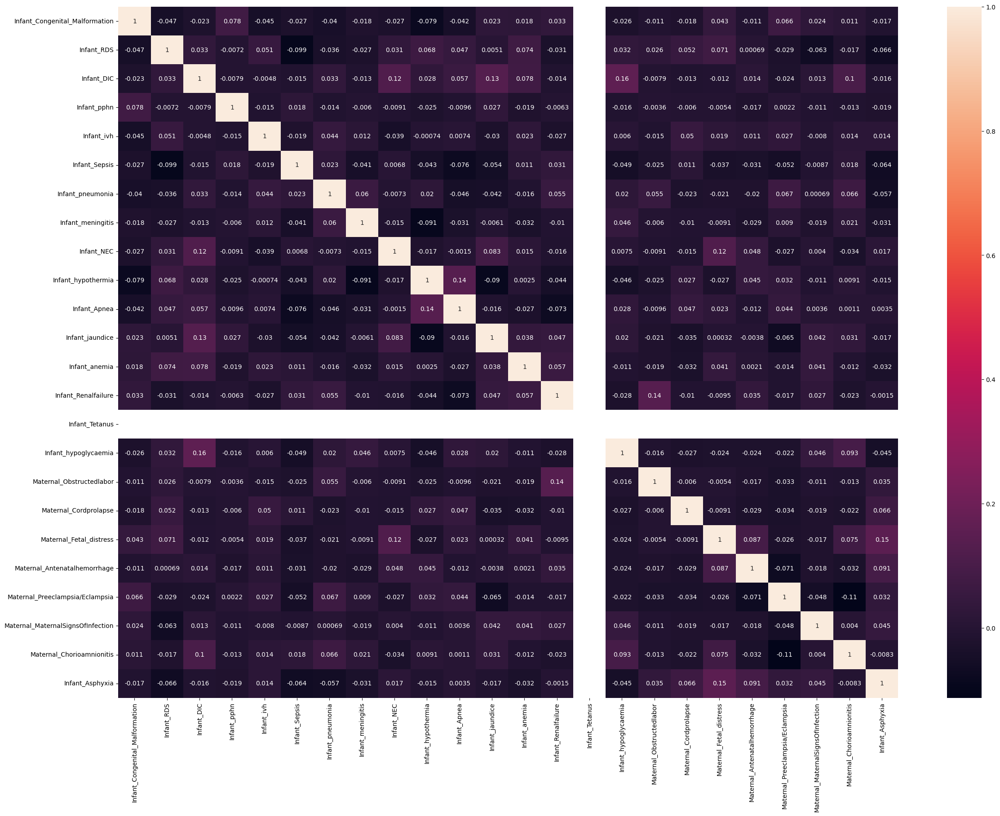

In [631]:
plt.figure(figsize=(28,20))
g= sns.heatmap(RDSCause.corr(),annot=True)

In [633]:
#Correlation of causes of death for Apnea
ApneaCause=Cleaneddata[[
      'Infant_Asphyxia',
      'Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_Sepsis',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_hypothermia',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea']]

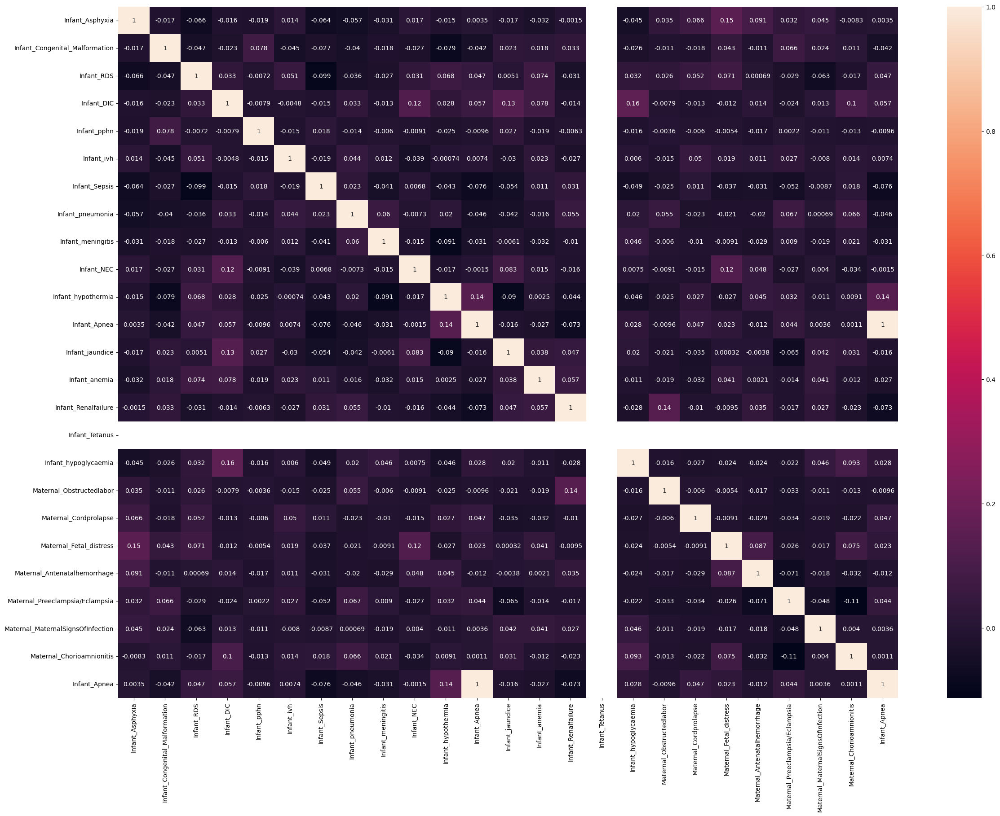

In [634]:
plt.figure(figsize=(28,20))
g= sns.heatmap(ApneaCause.corr(),annot=True)

In [644]:
#Correlation of causes of death for Apnea
HyphotemiaCause=Cleaneddata[[
      'Infant_Asphyxia',
      'Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_Sepsis',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'Infant_hypothermia']]

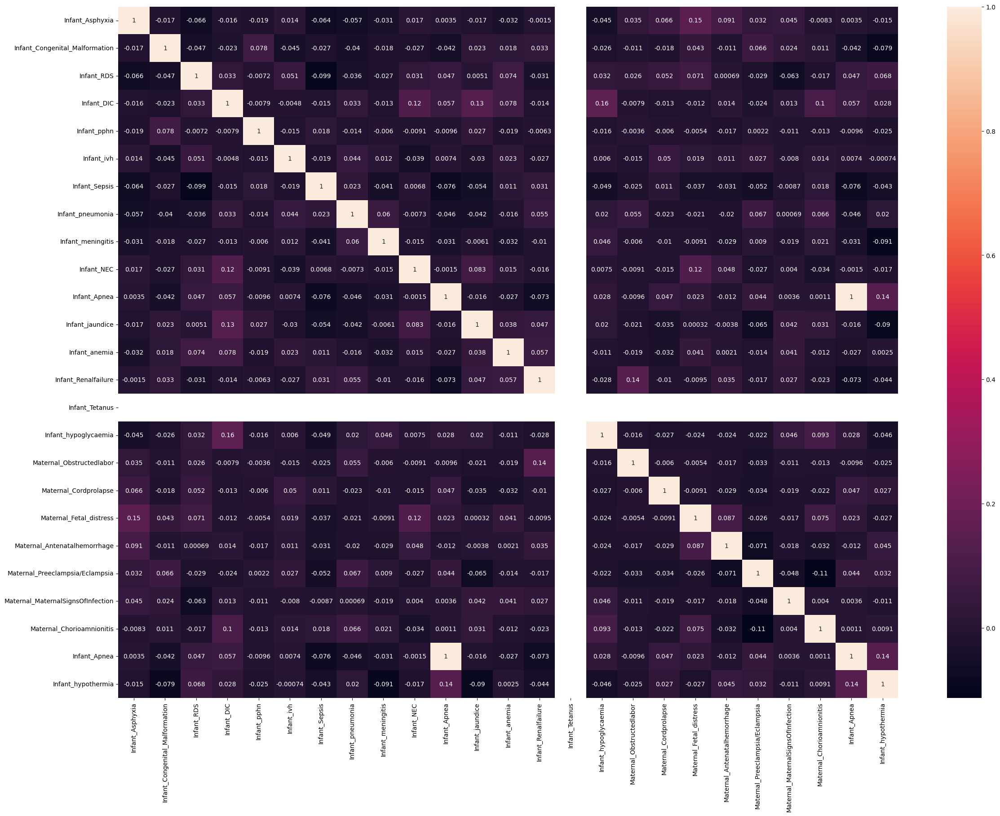

In [645]:
plt.figure(figsize=(28,20))
g= sns.heatmap(HyphotemiaCause.corr(),annot=True)

In [646]:
#Correlation of causes of death for Apnea
SepsismiaCause=Cleaneddata[[
      'Infant_Asphyxia',
      'Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'Infant_hypothermia',
      'Infant_Sepsis'

  ]]

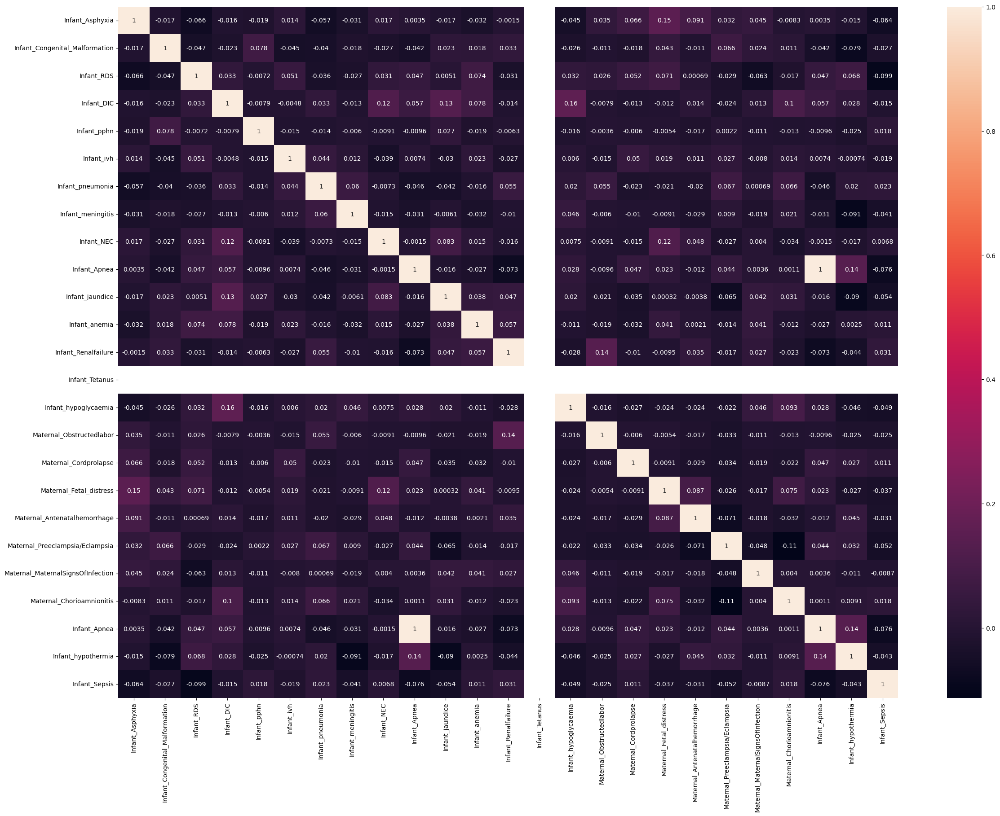

In [648]:
plt.figure(figsize=(28,20))
g= sns.heatmap(SepsismiaCause.corr(),annot=True)

In [ ]:
#Sepsis: Features with strong correlation
Infant_RDS(-0.099)
Infant_Asphyxia(-0.064)
Infant_Apnea(-0.07)
PregnancyType(-0.04)
Infant_pphn(0.018)
Infant_pneumonia(0.023)
Infant_Renalfailure(0.031)
Infant_anemia(0.011)
Maternal_Cordprolapse(0.011)
Maternal_Chorioamnionitis(0.018)
numberofpregnanciesEndedAfter20weeks(0.017)
AntenatalCareRecieved(0.066)
rhf(0.031)
Diabetes(0.029)
Malaria(0.037)
Hpertensive(0.072)
Antepartum(0.076)
PlacentaPrevia1_AbruptioPlacenta2(0.3)
Intra_partum_monitoring(0.022)



In [1460]:
 
    Sepsis_COD= CleandedataBeforeEncoded[['Infant_Asphyxia',
      'Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'Infant_hypothermia',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',
      'PlacentaPrevia1_AbruptioPlacenta2',        
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring',
      'Infant_Sepsis']]

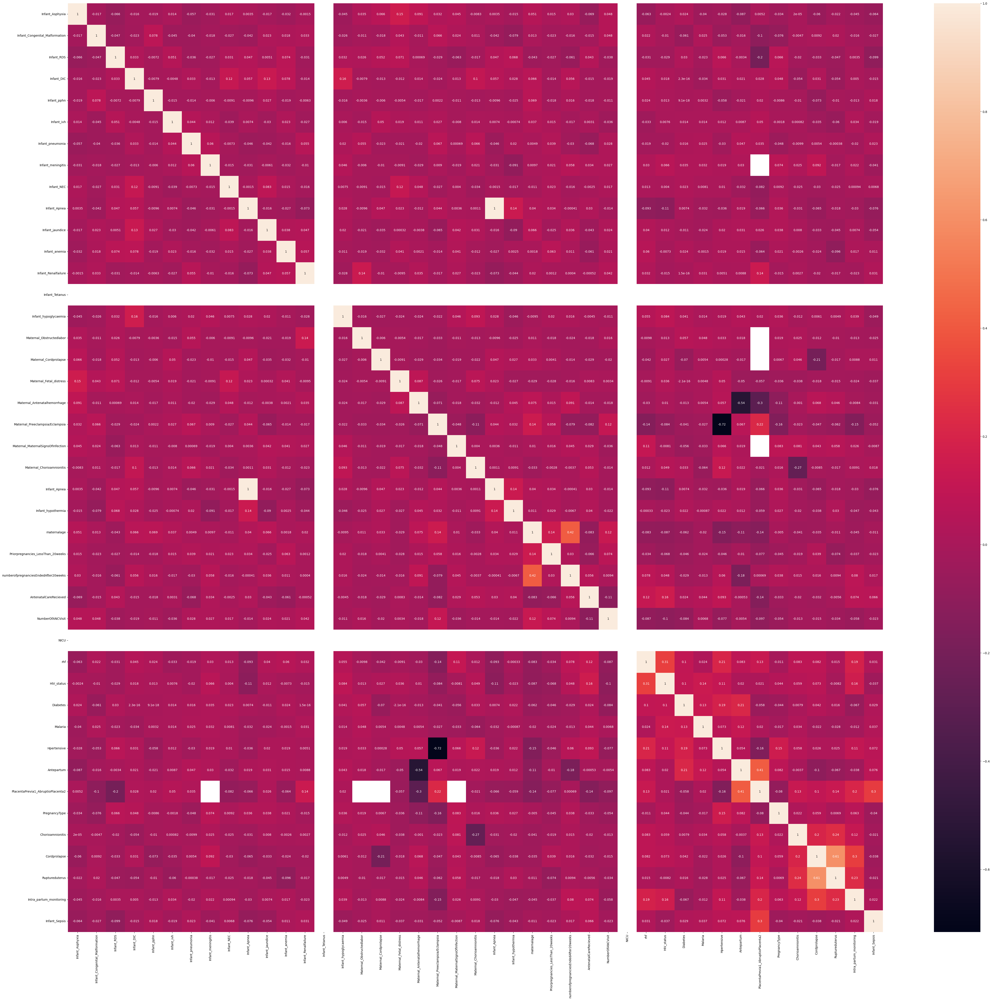

In [1461]:
plt.figure(figsize=(60,55))
g= sns.heatmap(Sepsis_COD.corr(),annot=True)

In [ ]:
Infant_anemia(0.074)
Maternal_Fetal_distress(0.071)
Infant_hypothermia(0.068)
Hpertensive(0.066)
PregnancyType(0.66)
Maternal_Cordprolapse(0.052)
Infant_ivh(0.051)
Infant_Apnea(0.047)
AntenatalCareRecieved(0.043)
Infant_hypoglycaemia(0.032)
Infant_NEC(0.031)
Maternal_Obstructedlabor(0.026)

Maternal_MaternalSignsOfInfection(-0.064)
numberofpregnanciesEndedAfter20weeks(-0.061)
maternalage(-0.043)

In [ ]:
#RDS: features with strong correlation to RDS
Infant_Asphyxia(-0.066)
Infant_Congenital_Malformation(-0.047)
Infant_Sepsis(-0.099)
Maternal_MaternalSignsOfInfection(-0.064)
numberofpregnanciesEndedAfter20weeks(-0.061)
maternalage(-0.043)
rhf(-0.031)
HIV_status(-0.029)
NumberOfANCVisit(-0.038)
Malaria(-0.023)
Ruptureduterus(-0.047)
Infant_ivh(0.051)
Infant_DIC(0.033)
Infant_Apnea(0.047)
Infant_anemia(0.074)
Infant_NEC(0.031)
Infant_hypoglycaemia(0.032)
Maternal_Obstructedlabor(0.026)
Maternal_Cordprolapse(0.052)
Maternal_Fetal_distress(0.071)
Infant_hypothermia(0.068)
AntenatalCareRecieved(0.043)
Diabetes(0.03)
Hpertensive(0.066)
PregnancyType(0.66)



In [1755]:
RDS_COD= CleandedataBeforeEncoded[['Infant_Asphyxia',
      'Infant_Congenital_Malformation',
      'Infant_Sepsis',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'Infant_hypothermia',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',
      'PlacentaPrevia1_AbruptioPlacenta2',        
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring',
      'Infant_RDS']]

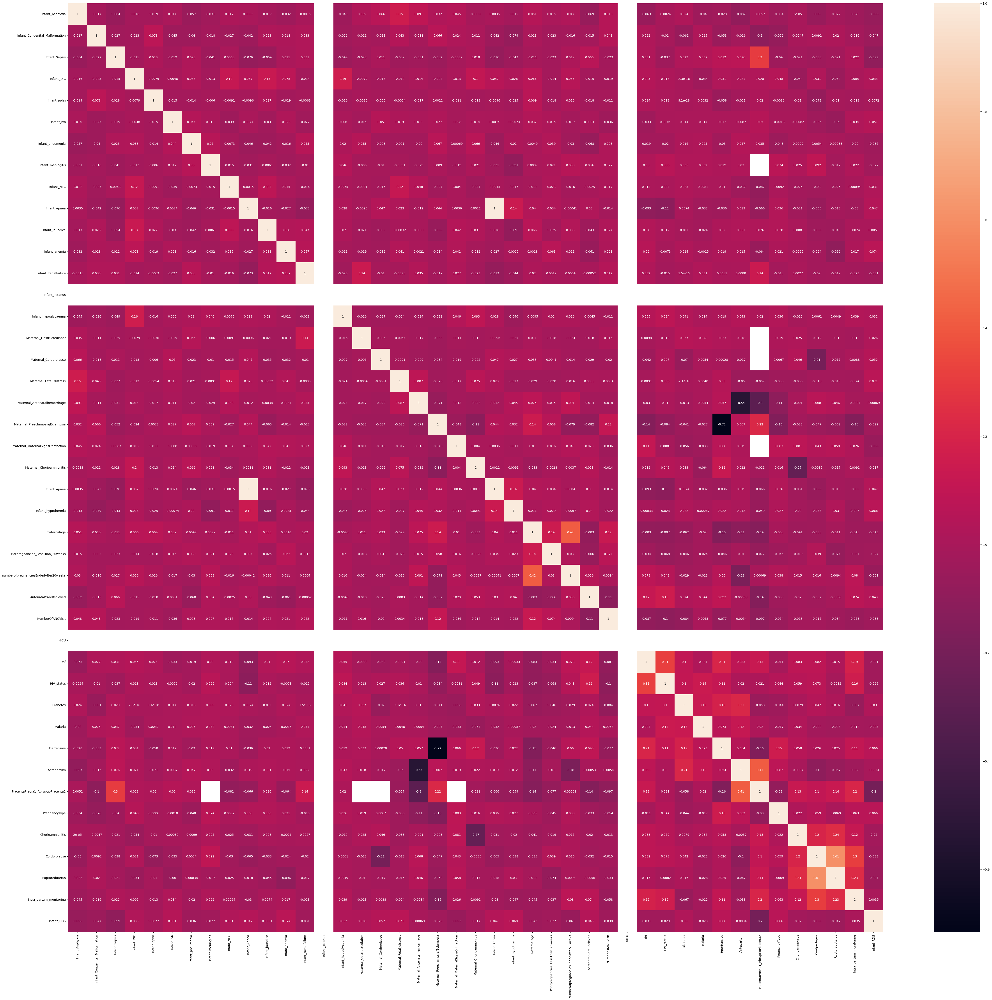

In [1757]:
plt.figure(figsize=(60,55))
g= sns.heatmap(RDS_COD.corr(),annot=True)

In [ ]:
#Aphixia: features with strong correlation to Aphixia
Infant_RDS(-0.066)
Infant_Sepsis(-0.064)
Infant_pneumonia(-0.057)
Infant_meningitis(-0.031)
Infant_hypoglycaemia(-0.045)
AntenatalCareRecieved(-0.069)
rhf(-0.063)
Hpertensive(-0.04)
Malaria(-0.028)
Antepartum(-0.087)
Intra_partum_monitoring(-0.045)
Infant_anemia(0.032)
Maternal_Obstructedlabor(0.035)
Maternal_Cordprolapse(0.066)
Maternal_Fetal_distress(0.15)
Maternal_Antenatalhemorrhage(0.091)
Maternal_Preeclampsia/Eclampsia(0.032)
Maternal_MaternalSignsOfInfection(0.045)
Maternalage(0.051)
numberofpregnanciesEndedAfter20weeks(0.03)
NumberOfANCVisit(0.048)
Diabetes(0.024)

In [1758]:
Aphixa_COD= CleandedataBeforeEncoded[['Infant_RDS',
      'Infant_Congenital_Malformation',
      'Infant_Sepsis',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'Infant_hypothermia',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',
      'PlacentaPrevia1_AbruptioPlacenta2',        
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring',
      'Infant_Asphyxia']]

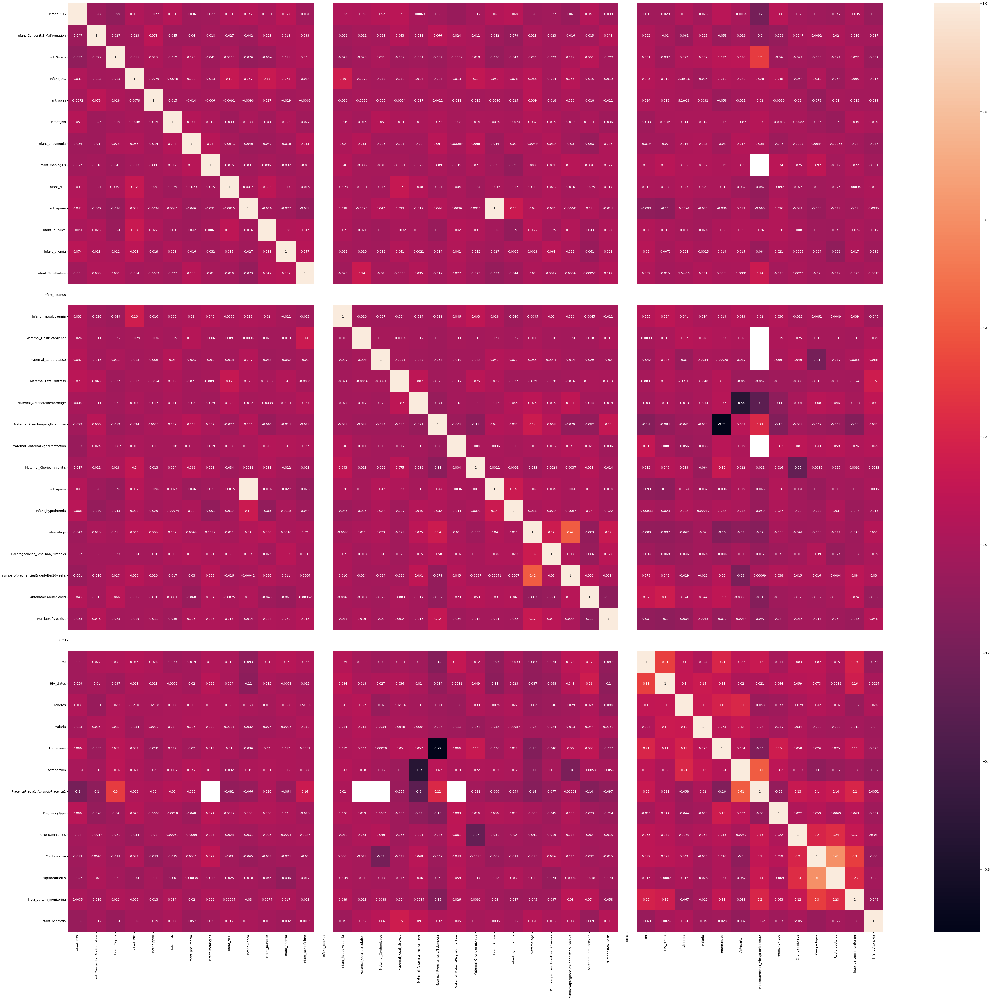

In [1759]:

plt.figure(figsize=(60,55))
g= sns.heatmap(Aphixa_COD.corr(),annot=True)

In [ ]:
#Apnea: features with strong correlation to Apnea

Infant_Congenital_Malformation(-0.042)
Infant_pneumonia(-0.056)
Infant_meningitis(-0.031)
Infant_Sepsis(-0.076)
Infant_Renalfailure(-0.073)
NumberOfANCVisit(-0.014)
rhf(-0.093)
HIV_status(-0.11)
Hpertensive(-0.036)
Malaria(-0.032)
PlacentaPrevia1_AbruptioPlacenta2 (-0.066)
Intra_partum_monitoring(-0.03)
Infant_RDS(0.047)
Infant_DIC(0.057)
Infant_hypoglycaemia(0.028)
Maternal_Cordprolapse(0.047)
Maternal_Fetal_distress(0.23)
Maternal_Preeclampsia/Eclampsia(0.044)
Infant_hypothermia(0.14)
maternalage(0.04)
Priorpregnancies_LessThan_20weeks(0.034)
AntenatalCareRecieved(0.03)
PregnancyType(0.036)




In [1760]:
      
    Apnea_COD= CleandedataBeforeEncoded[['Infant_Asphyxia',
      'Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Sepsis',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'Infant_hypothermia',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',
      'PlacentaPrevia1_AbruptioPlacenta2',        
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring',
      'Infant_Apnea']]

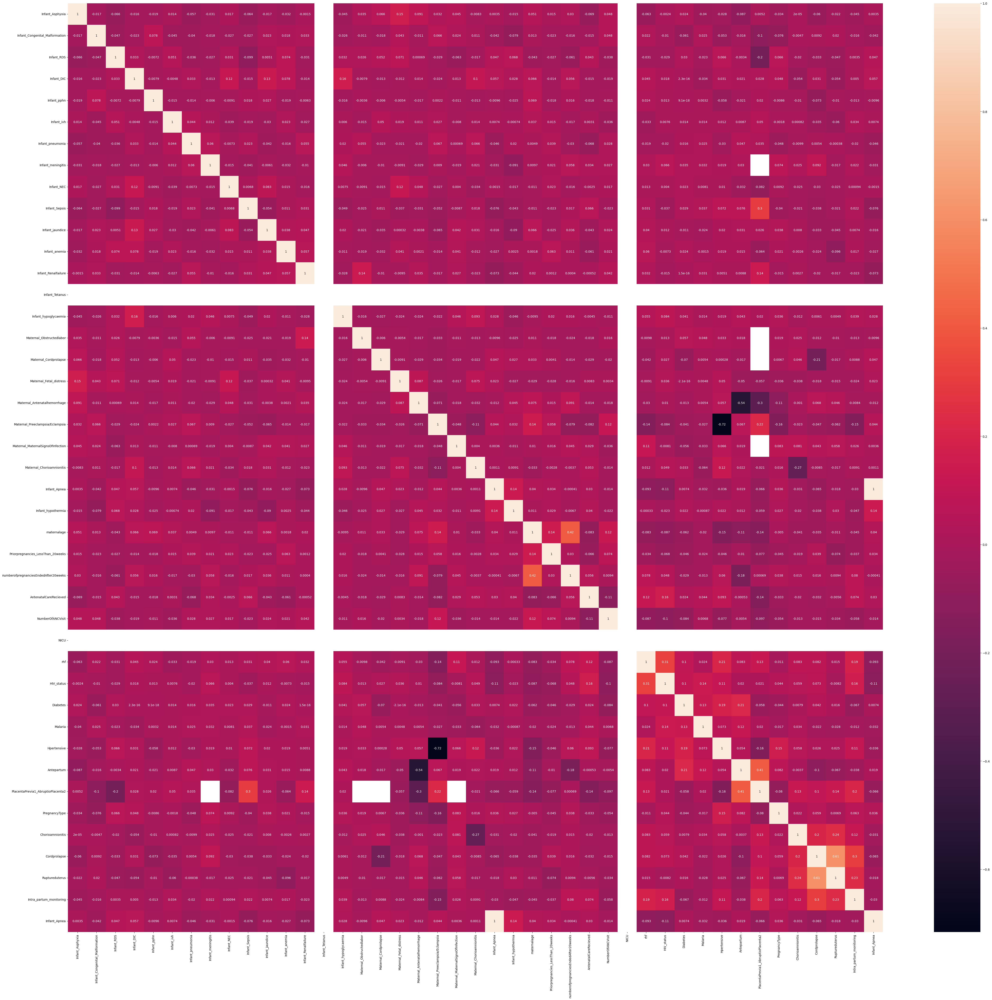

In [1761]:

plt.figure(figsize=(60,55))
g= sns.heatmap(Apnea_COD.corr(),annot=True)

In [ ]:

#Hypothemia: features with strong correlation to Hypothemia

Infant_Congenital_Malformation(-0.079)
infant_meningitis(-0.091)
Infant_Sepsis(-0.043)
Infant_jaundice(-0.09)
NumberOfANCVisit(-0.022)
HIV_status(-0.023)
Maternal_Obstructedlabor(-0.025)
Maternal_MaternalSignsOfInfection(0.011)
Intra_partum_monitoring(-0.047)
Infant_hypoglycaemia(0.046)
Infant_RDS(0.068)
Infant_DIC(0.028)
Maternal_Cordprolapse(0.027)
Maternal_Antenatalhemorrhage(0.045)
Maternal_Preeclampsia/Eclampsia(0.032)
maternalage(0.011)
Infant_Apnea(0.14)
Infant_anemia(0.0025)
AntenatalCareRecieved(0.04)
Priorpregnancies_LessThan_20weeks(0.029)
Diabetes(0.022)
Antepartum(0.012)
PregnancyType(0.027)
Ruptureduterus(0.03)
Hpertensiv(0.022)
Maternal_Chorioamnionitis(0.009)

In [1770]:
 
    Hypothermia_COD= CleandedataBeforeEncoded[['Infant_Asphyxia',
      'Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Sepsis',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',
      'PlacentaPrevia1_AbruptioPlacenta2',        
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring',
      'Infant_hypothermia']]

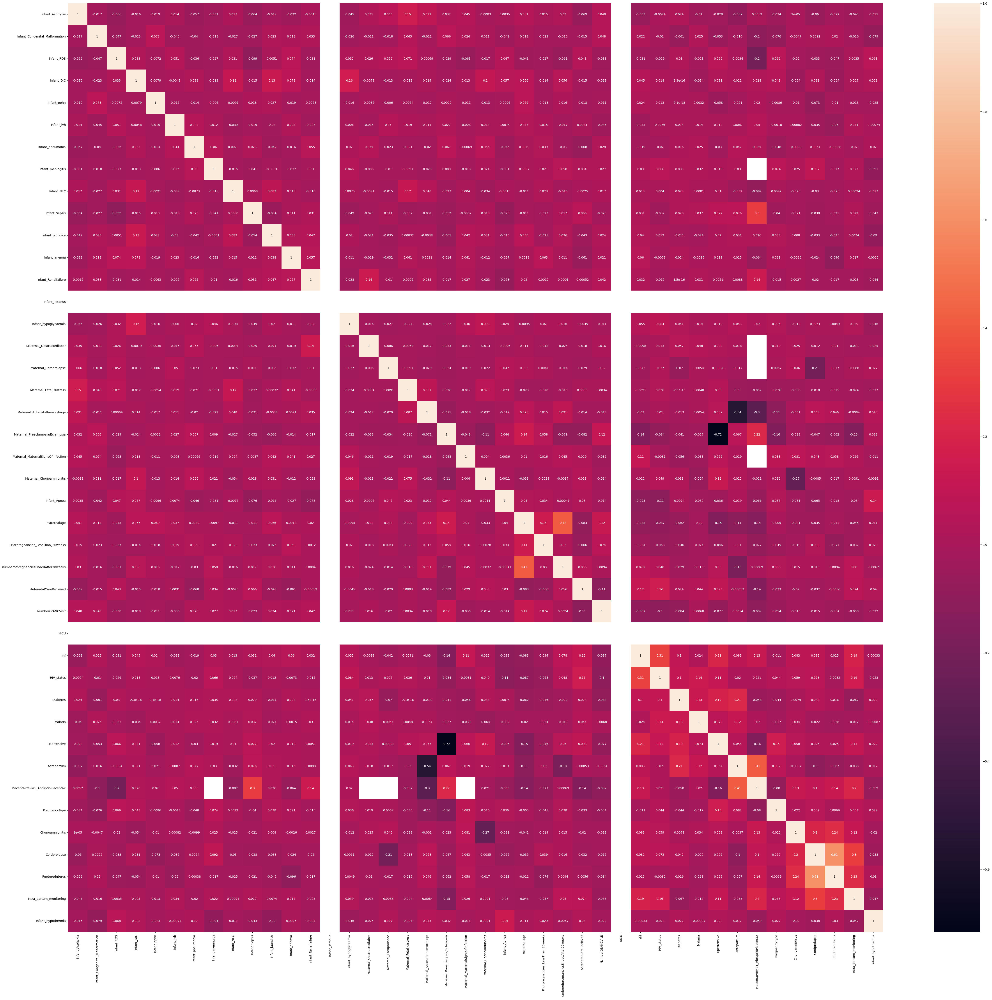

In [1771]:

plt.figure(figsize=(60,55))
g= sns.heatmap(Hypothermia_COD.corr(),annot=True)

In [ ]:
#Feature Engineering

In [650]:
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

In [654]:
AphixiaFeatures=Cleaneddata[[
      'Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_Sepsis',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'Infant_hypothermia']]
yaph=Cleaneddata[['Infant_Asphyxia']]

In [883]:
RDSFeatures=Cleaneddata[[
      'Infant_Congenital_Malformation',
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_Sepsis',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Asphyxia',
      'Infant_hypothermia'
      ]]
yRDS=Cleaneddata[['Infant_RDS']]

In [1597]:
RFC=RandomForestClassifier(bootstrap= False,
 criterion='gini',max_depth=None,max_features= 3,min_samples_leaf=3,min_samples_split=3,n_estimators=100)
AdB=AdaBoostClassifier()
GRB=GradientBoostingClassifier()
lgst=LogisticRegression()
SV=SVC()
Tree=DecisionTreeClassifier()

In [656]:
RfcAph=RFC.fit(AphixiaFeatures,yaph)
AdbAph=AdB.fit(AphixiaFeatures,yaph)
GRBAph=GRB.fit(AphixiaFeatures,yaph)
lgstAph=lgst.fit(AphixiaFeatures,yaph)
SVAph=SV.fit(AphixiaFeatures,yaph)
TreeAph=Tree.fit(AphixiaFeatures,yaph)

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_78627/2378460081.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  RfcAph=RFC.fit(AphixiaFeatures,yaph)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array w

In [661]:
RfcAph.score(AphixiaFeatures,yaph)

0.9314697926059513

In [662]:
AdbAph.score(AphixiaFeatures,yaph)

0.9143372407574392

In [663]:
GRBAph.score(AphixiaFeatures,yaph)

0.9215509467989179

In [664]:
lgstAph.score(AphixiaFeatures,yaph)

0.9134355275022543

In [665]:
SV.score(AphixiaFeatures,yaph)

0.9134355275022543

In [657]:
feature_scores = pd.Series(RfcAph.feature_importances_, index=AphixiaFeatures.columns).sort_values(ascending=False)
feature_scores

Infant_hypothermia                   0.116125
Maternal_Fetal_distress              0.075799
Maternal_Preeclampsia/Eclampsia      0.071960
Infant_jaundice                      0.070401
Infant_RDS                           0.064566
Maternal_Antenatalhemorrhage         0.058459
Infant_ivh                           0.058347
Infant_Sepsis                        0.055960
Maternal_MaternalSignsOfInfection    0.054069
Maternal_Chorioamnionitis            0.049247
Infant_anemia                        0.045425
Infant_hypoglycaemia                 0.043695
Infant_Apnea                         0.039503
Infant_Apnea                         0.037460
Maternal_Cordprolapse                0.035661
Infant_NEC                           0.031271
Infant_DIC                           0.019588
Infant_pneumonia                     0.018752
Maternal_Obstructedlabor             0.018729
Infant_Congenital_Malformation       0.015810
Infant_Renalfailure                  0.014678
Infant_meningitis                 

<AxesSubplot: >

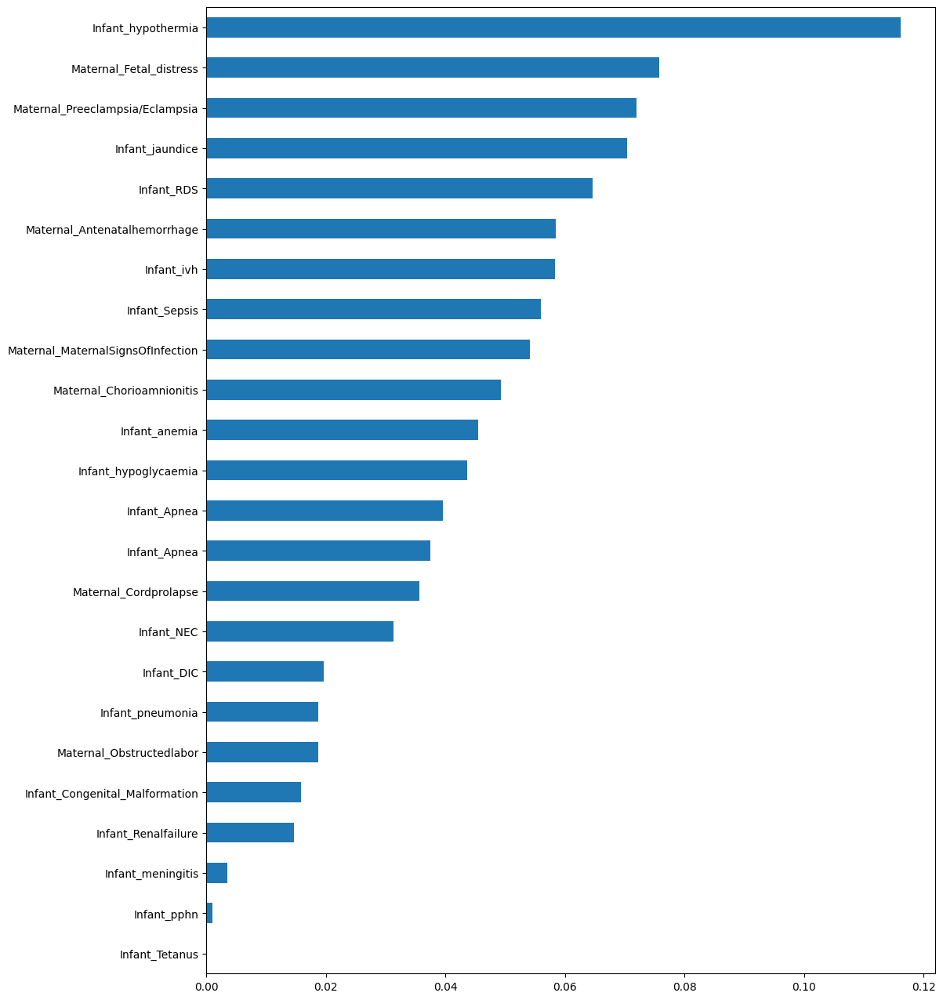

In [658]:
#Sort and and plot the features in ascending order
SortedAphixiaF=feature_scores.sort_values(ascending=True)
plt.figure(figsize=(12,16))
SortedAphixiaF.plot.barh()

In [ ]:
#Feature engineering of RDS


In [ ]:
RFC,ADB,GRB,lgst,SV,Tree

In [669]:
RfcRDS=RFC.fit(RDSFeatures,yRDS)
AdbRDS=AdB.fit(RDSFeatures,yRDS)
GRBRDS=GRB.fit(RDSFeatures,yRDS)
lgstRDS=lgst.fit(RDSFeatures,yRDS)
SVRDS=SV.fit(RDSFeatures,yRDS)
TreeRDS=Tree.fit(RDSFeatures,yRDS)

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_78627/576622336.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  RfcRDS=RFC.fit(RDSFeatures,yRDS)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was ex

In [ ]:
RfcRDS.score(RDSFeatures,yRDS)

In [671]:
AdbRDS.score(RDSFeatures,yRDS)

0.7078449053201082

In [672]:
GRBRDS.score(RDSFeatures,yRDS)

0.739404869251578

In [673]:
lgstRDS.score(RDSFeatures,yRDS)

0.7033363390441839

In [674]:
SVRDS.score(RDSFeatures,yRDS)

0.7303877366997295

In [675]:
TreeRDS.score(RDSFeatures,yRDS)

0.7763751127141569

In [898]:
RDSXGB.score(RDSFeatures,yRDS)

0.7547339945897205

In [676]:
feature_scores = pd.Series(RfcRDS.feature_importances_, index=AphixiaFeatures.columns).sort_values(ascending=False)
feature_scores

Infant_hypothermia                   0.100484
Maternal_Antenatalhemorrhage         0.076735
Infant_Apnea                         0.072441
Infant_Tetanus                       0.072309
Infant_jaundice                      0.071976
Infant_ivh                           0.067404
Infant_pphn                          0.059546
Maternal_Fetal_distress              0.054492
Infant_Apnea                         0.054399
Infant_meningitis                    0.041533
Infant_Sepsis                        0.038978
Maternal_Preeclampsia/Eclampsia      0.038675
Maternal_Chorioamnionitis            0.035274
Maternal_MaternalSignsOfInfection    0.034508
Infant_NEC                           0.032410
Infant_RDS                           0.029821
Maternal_Obstructedlabor             0.025596
Infant_Congenital_Malformation       0.021135
Maternal_Cordprolapse                0.020630
Infant_pneumonia                     0.019410
Infant_anemia                        0.013448
Infant_hypoglycaemia              

<AxesSubplot: >

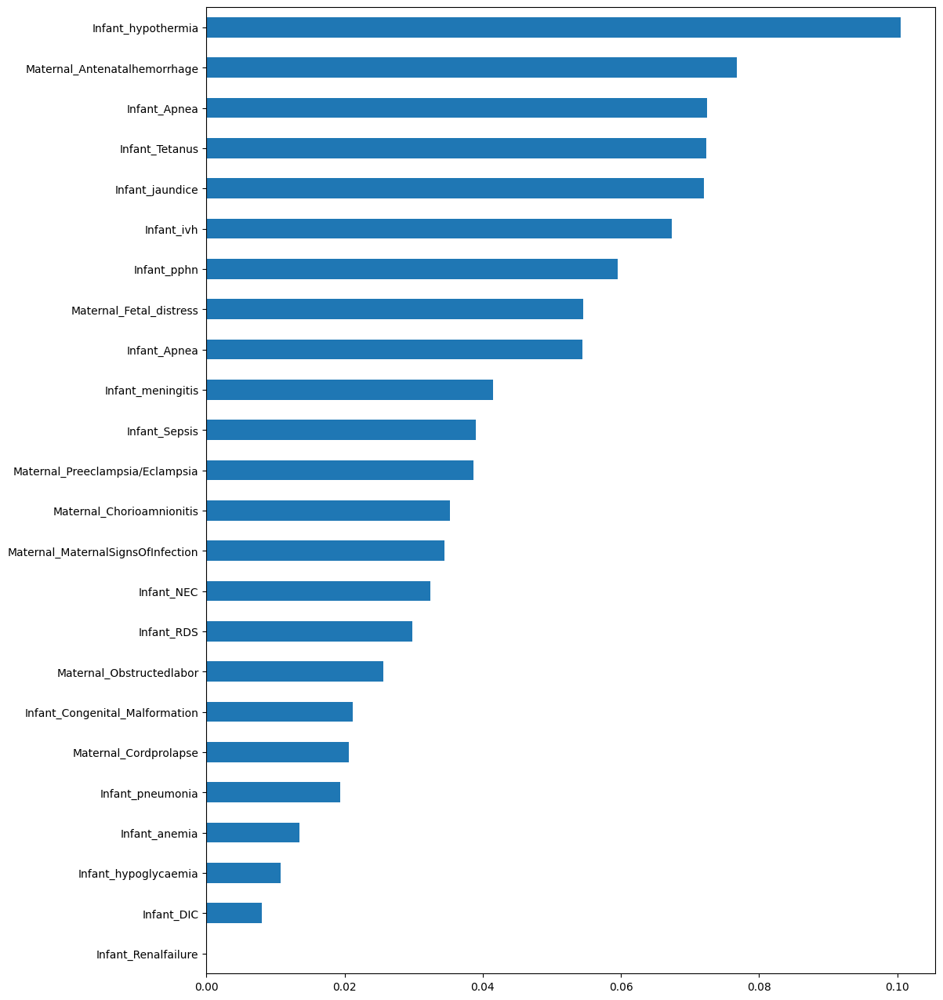

In [677]:
#Sort and and plot the features in ascending order
SortedRTDSFeatures=feature_scores.sort_values(ascending=True)
plt.figure(figsize=(12,16))
SortedRTDSFeatures.plot.barh()

In [1542]:
CleandedataBeforeEncoded['Infant_Apnea'].unique()

array([0, 1])

In [ ]:


#Feature Engineering with  XGBoost 

In [1818]:
xgbSepsis=xopgbmodel.fit(Xa_Sepsis,Ya_sepsis)

In [1819]:
feature_xglSepsis = pd.Series(xgbSepsis.feature_importances_, index=Xa_Sepsis.columns).sort_values(ascending=False)
#feature_scoresSepsis

<AxesSubplot: title={'center': 'Study of illness in Preterm:  Features/Factors causing  Sepsis for COD using  XGBoost '}>

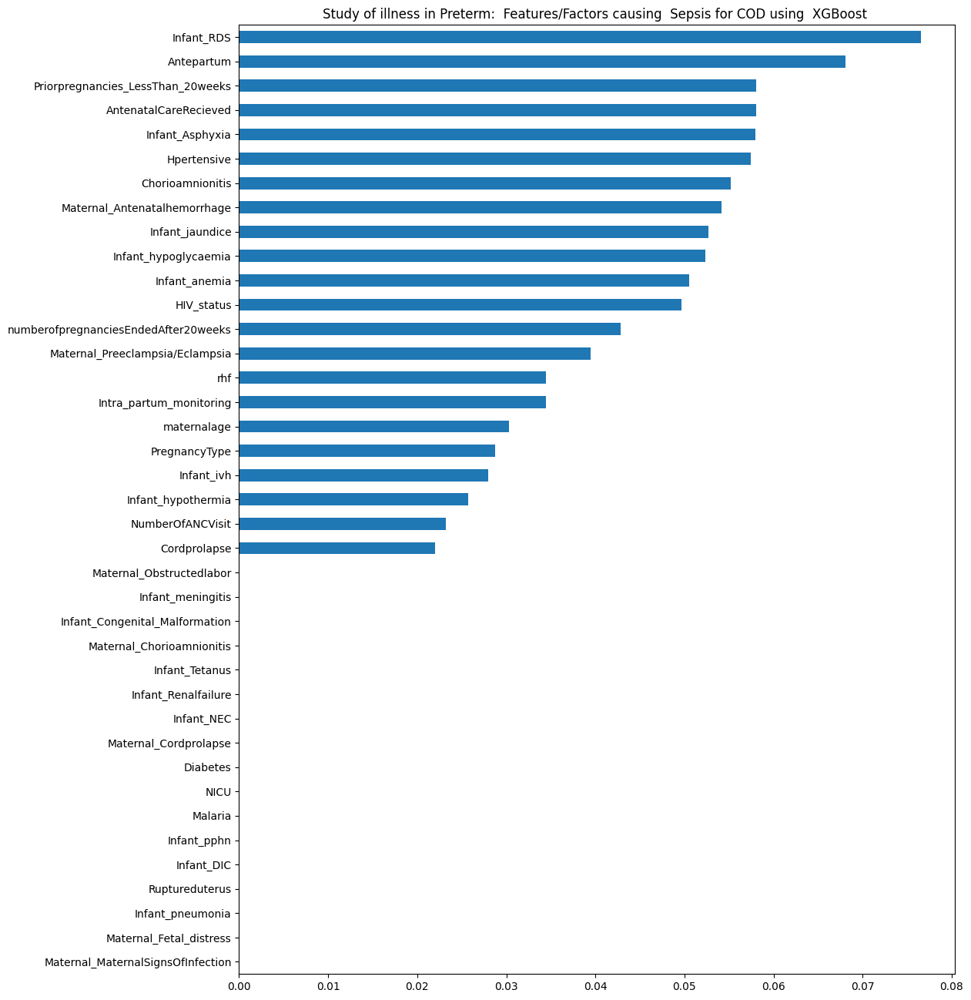

In [1820]:
#Sort and and plot the features  Sepsis  using XGBoost  in ascending order
SortedSepsisFeatures=feature_xglSepsis.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:  Features/Factors causing  Sepsis for COD using  XGBoost ")
SortedSepsisFeatures.plot.barh()

In [1815]:
xgbRDS=xopgbmodel.fit(Xa_RDS,Ya_RDS)

In [1795]:
feature_xglRDS = pd.Series(xgbRDS.feature_importances_, index=Xa_RDS.columns).sort_values(ascending=False)
#feature_scoresSepsis

<AxesSubplot: title={'center': 'Study of illness in Preterm:  Features/Factors causing  RDS for COD using  XGBoost '}>

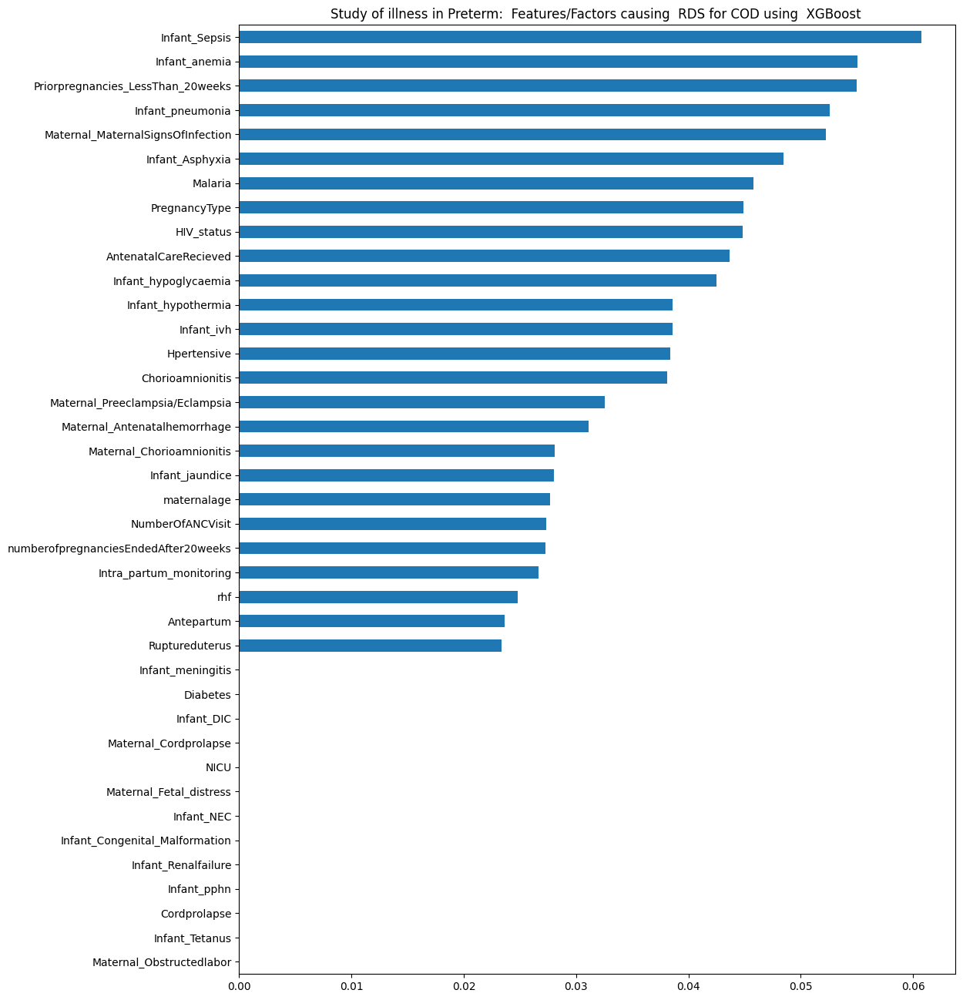

In [1821]:
#Sort and and plot the features  RDS  using XGBoost  in ascending order
SortedRDSFeatures=feature_xglRDS.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:  Features/Factors causing  RDS for COD using  XGBoost ")
SortedRDSFeatures.plot.barh()

In [1822]:
xgbAphixia=xopgbmodel.fit(Xa_Aphixia,Ya_Aphixia)

In [1823]:
feature_xglAphixia = pd.Series(xgbAphixia.feature_importances_, index=Xa_Aphixia.columns).sort_values(ascending=False)
#feature_scoresSepsis

<AxesSubplot: title={'center': 'Study of illness in Preterm:  Features/Factors causing  Aphixia for COD using  XGBoost '}>

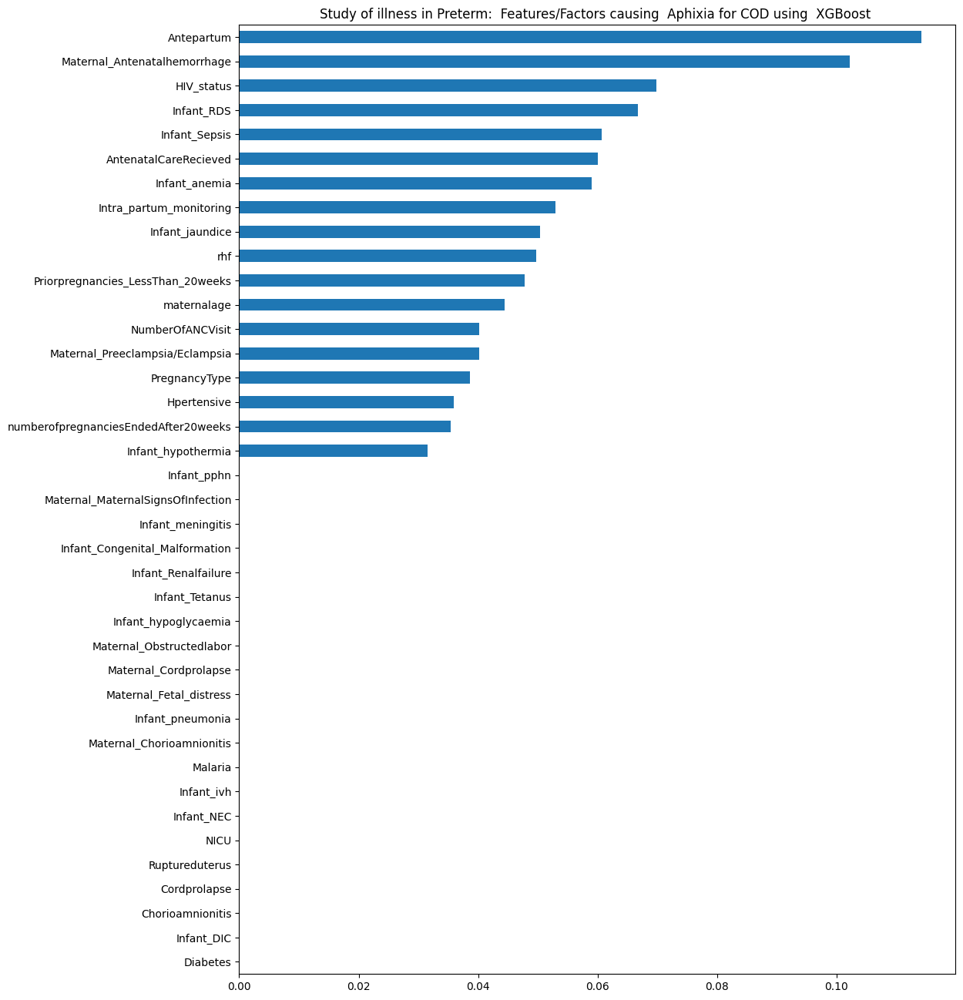

In [1824]:
#Sort and and plot the features  Aphixia  using XGBoost  in ascending order
SortedAphixiaFeatures=feature_xglAphixia.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:  Features/Factors causing  Aphixia for COD using  XGBoost ")
SortedAphixiaFeatures.plot.barh()

In [1836]:
xgbApnea=xopgbmodel.fit(Xa_Apnea,Ya_Apnea)

In [1837]:
feature_xglApnea = pd.Series(xgbApnea.feature_importances_, index=Xa_Apnea.columns).sort_values(ascending=False)
#feature_scoresSepsis

<AxesSubplot: title={'center': 'Study of illness in Preterm:  Features/Factors causing  Apnea for COD using  XGBoost '}>

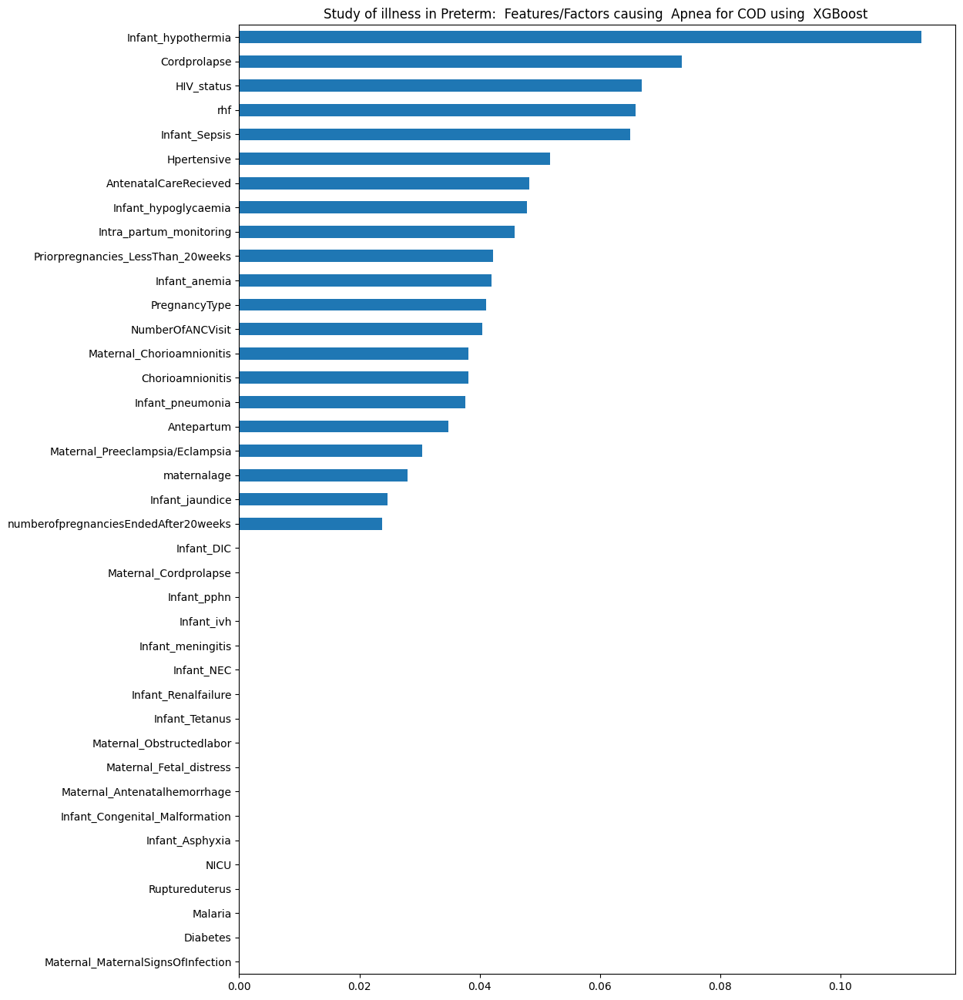

In [1838]:
#Sort and and plot the features  Apnea  using XGBoost  in ascending order
SortedApneaFeatures=feature_xglApnea.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:  Features/Factors causing  Apnea for COD using  XGBoost ")
SortedApneaFeatures.plot.barh()

In [1840]:
xgbHypothermia=xopgbmodel.fit(Xa_Hypothermia,Ya_Hypothemia)

In [1841]:
feature_xgHypothermia = pd.Series(xgbHypothermia.feature_importances_, index=Xa_Hypothermia.columns).sort_values(ascending=False)
#feature_scoresSepsis

<AxesSubplot: title={'center': 'Study of illness in Preterm:  Features/Factors causing  Hypothermia for COD using  XGBoost '}>

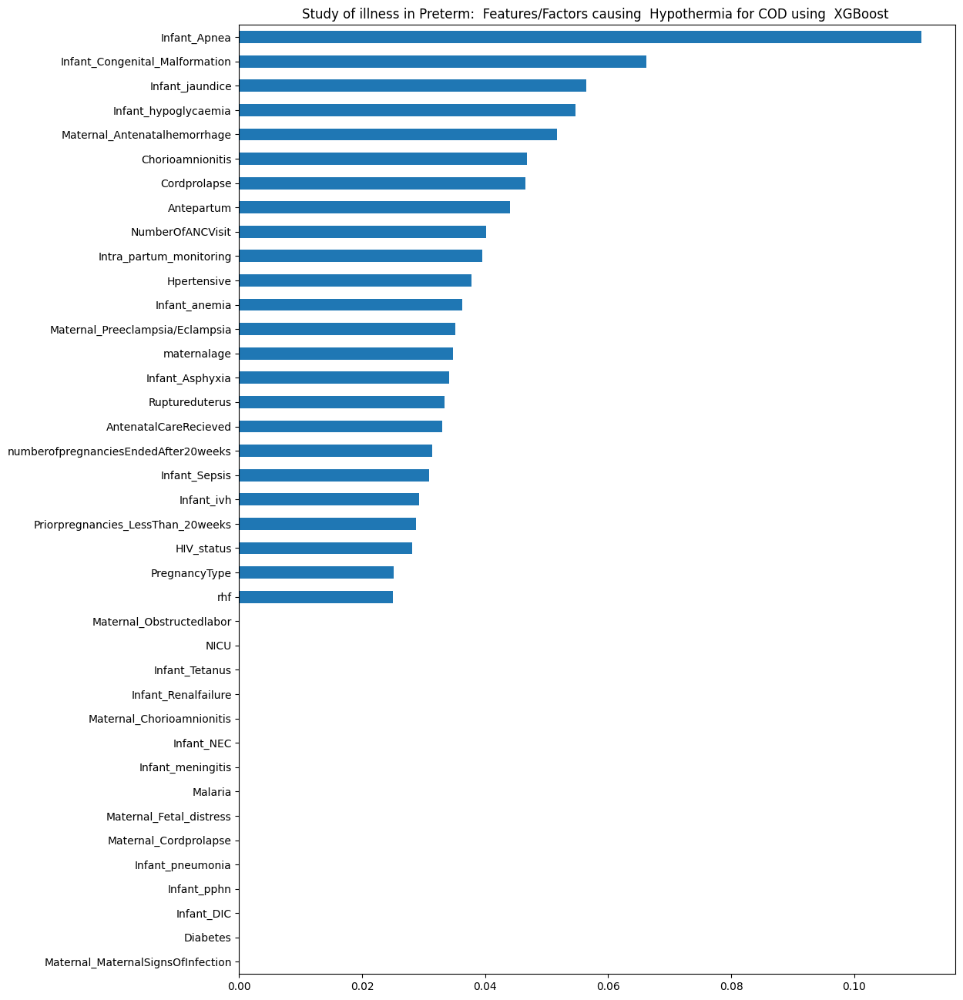

In [1842]:
#Sort and and plot the features  Apnea  using XGBoost  in ascending order
SortedHypothermia=feature_xgHypothermia.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:  Features/Factors causing  Hypothermia for COD using  XGBoost ")
SortedHypothermia.plot.barh()

In [1839]:
 Xa_Hypothermia= CleandedataBeforeEncoded[['Infant_Asphyxia',
      'Infant_Congenital_Malformation',
      'Infant_Sepsis',                          
      'Infant_DIC',
      'Infant_pphn',                              
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',       
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Infant_Apnea',
      'Intra_partum_monitoring'
      ]]
Ya_Hypothemia=CleandedataBeforeEncoded[['Infant_hypothermia']]

In [1833]:
 Xa_Apnea= CleandedataBeforeEncoded[['Infant_Asphyxia',
      'Infant_Congenital_Malformation',
      'Infant_Sepsis',                          
      'Infant_DIC',
      'Infant_pphn',                              
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',       
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Infant_hypothermia',
      'Intra_partum_monitoring'
      ]]
Ya_Apnea=CleandedataBeforeEncoded[['Infant_Apnea']]

In [1803]:
 Xa_Aphixia= CleandedataBeforeEncoded[[
      'Infant_Congenital_Malformation',
      'Infant_Sepsis',                          
      'Infant_DIC',
      'Infant_pphn',                              
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_hypothermia',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',       
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring'
      ]]
Ya_Aphixia=CleandedataBeforeEncoded[['Infant_Asphyxia']]

In [1598]:
RFCsepsis=RFC.fit(X_Sepsis,Y_sepsis)
Adbsepsis=AdB.fit(X_Sepsis,Y_sepsis)
GRBsepsis=GRB.fit(X_Sepsis,Y_sepsis)
lgstsepsis=lgst.fit(X_Sepsis,Y_sepsis)
SVMsepsis=SV.fit(X_Sepsis,Y_sepsis)
Treesepsis=Tree.fit(X_Sepsis,Y_sepsis)


/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_78627/149622790.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  RFCsepsis=RFC.fit(X_Sepsis,Y_sepsis)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array wa

In [1618]:
xopgbmodel = xgb.XGBClassifier(learning_rate=0.01, n_estimators=140, max_depth=4,
 min_child_weight=6, gamma=0, subsample=0.85, colsample_bytree=0.75,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1,seed=27,reg_alpha=0)


In [1619]:
xgbSepsis=xopgbmodel.fit(Xa_Sepsis,Ya_sepsis)

In [1599]:
print('Random forest score for Sepsis',RFCsepsis.score(X_Sepsis,Y_sepsis))
print('Gradient Boosting score for Sepsis',GRBsepsis.score(X_Sepsis,Y_sepsis))
print('Adaboost score for Sepsis',Adbsepsis.score(X_Sepsis,Y_sepsis))
print('Decission Tree score for Sepsis',Treesepsis.score(X_Sepsis,Y_sepsis))
print('Logistic Regression  score for Sepsis',lgstsepsis.score(X_Sepsis,Y_sepsis))
print('Support Vector Machine score for Sepsis',SVMsepsis.score(X_Sepsis,Y_sepsis))


Random forest score for Sepsis 0.8575293056807936
Gradient Boosting score for Sepsis 0.8755635707844905
Adaboost score for Sepsis 0.8575293056807936
Decission Tree score for Sepsis 0.9990982867448152
Logistic Regression  score for Sepsis 0.8557258791704238
Support Vector Machine score for Sepsis 0.8557258791704238


In [1622]:
print('XGBoost  score for Sepsis',xgbSepsis.score(Xa_Sepsis,Ya_sepsis))

XGBoost  score for Sepsis 0.8557258791704238


In [1601]:
feature_scoresSepsis = pd.Series(RFCsepsis.feature_importances_, index=X_Sepsis.columns).sort_values(ascending=False)
#feature_scoresSepsis

<AxesSubplot: title={'center': 'Study of illness in Preterm:  Features/Factors causing  Sepsis for COD'}>

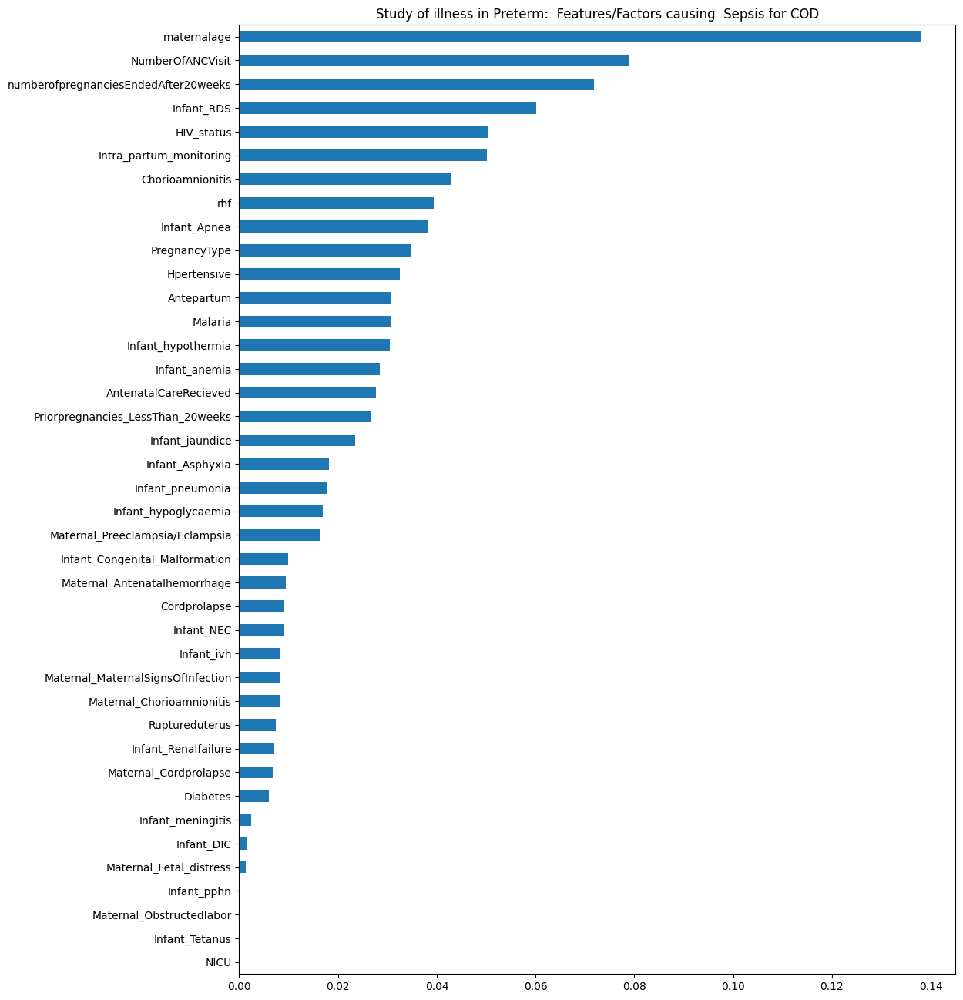

In [1602]:
#Sort and and plot the features in ascending order
SortedRTDSFeatures=feature_scoresSepsis.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:  Features/Factors causing  Sepsis for COD")
SortedRTDSFeatures.plot.barh()

<AxesSubplot: title={'center': 'Study of illness in Preterm:  Features/Factors causing  Sepsis for COD using XGboost'}>

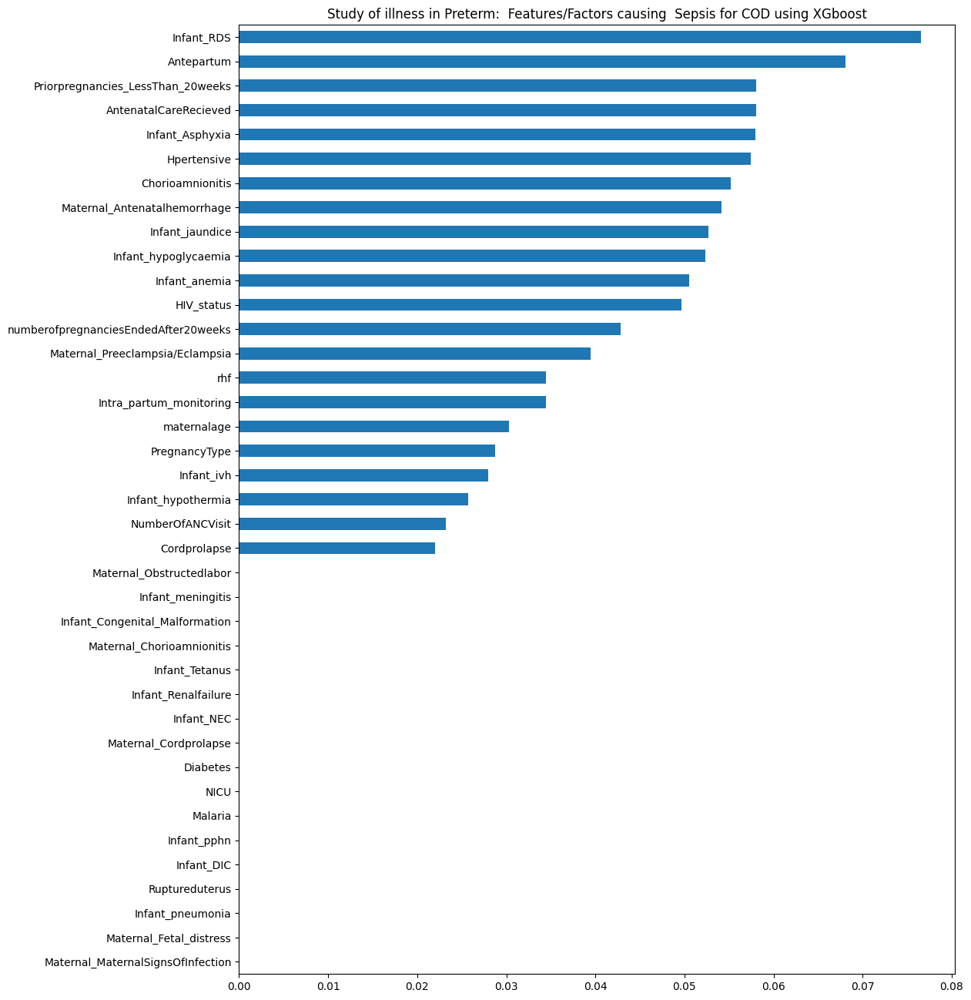

In [1624]:
#Sort and and plot the features in ascending order
SortedXglFeatures=feature_xglSepsis.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:  Features/Factors causing  Sepsis for COD using XGboost")
SortedXglFeatures.plot.barh()

In [1593]:
X_RDS= CleandedataBeforeEncoded[['Infant_Asphyxia','Infant_Apnea',
      'Infant_Congenital_Malformation',
      'Infant_Sepsis',                            
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'Infant_hypothermia',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',       
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring'
      ]]
Y_RDS=CleandedataBeforeEncoded[['Infant_RDS']]

In [1605]:
RFCRds=RFC.fit(X_RDS,Y_RDS)
AdbRds=AdB.fit(X_RDS,Y_RDS)
GRBRds=GRB.fit(X_RDS,Y_RDS)
lgstRds=lgst.fit(X_RDS,Y_RDS)
SVMRds=SV.fit(X_RDS,Y_RDS)
TreeRds=Tree.fit(X_RDS,Y_RDS)

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_78627/2901864958.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  RFCRds=RFC.fit(X_RDS,Y_RDS)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expect

In [1606]:
print('Random forest score for RDS',RFCRds.score(X_RDS,Y_RDS))
print('Gradient Boosting score for RDS',GRBRds.score(X_RDS,Y_RDS))
print('Adaboost score for RDS',AdbRds.score(X_RDS,Y_RDS))
print('Decission Tree score for RDS',TreeRds.score(X_RDS,Y_RDS))
print('Logistic Regression  score for RDS',lgstRds.score(X_RDS,Y_RDS))
print('Support Vector Machine score for RDS',SVMRds.score(X_RDS,Y_RDS))

Random forest score for RDS 0.7439134355275022
Gradient Boosting score for RDS 0.7673579801623084
Adaboost score for RDS 0.7159603246167718
Decission Tree score for RDS 0.9945897204688909
Logistic Regression  score for RDS 0.7195671776375113
Support Vector Machine score for RDS 0.6952209197475203


In [1587]:
xgbRDs=xgbmodel.fit(Xa_RDS,Ya_RDS)

In [1588]:
xgbRDs.score(Xa_RDS,Ya_RDS)

0.9440937781785392

In [1589]:
feature_scoresRDS = pd.Series(RFCRds.feature_importances_, index=X_RDS.columns).sort_values(ascending=False)
#feature_scoresRDS

<AxesSubplot: title={'center': 'Study of illness in Preterm:Features/Factors causing  Respiratory Distress Syndrome for COD'}>

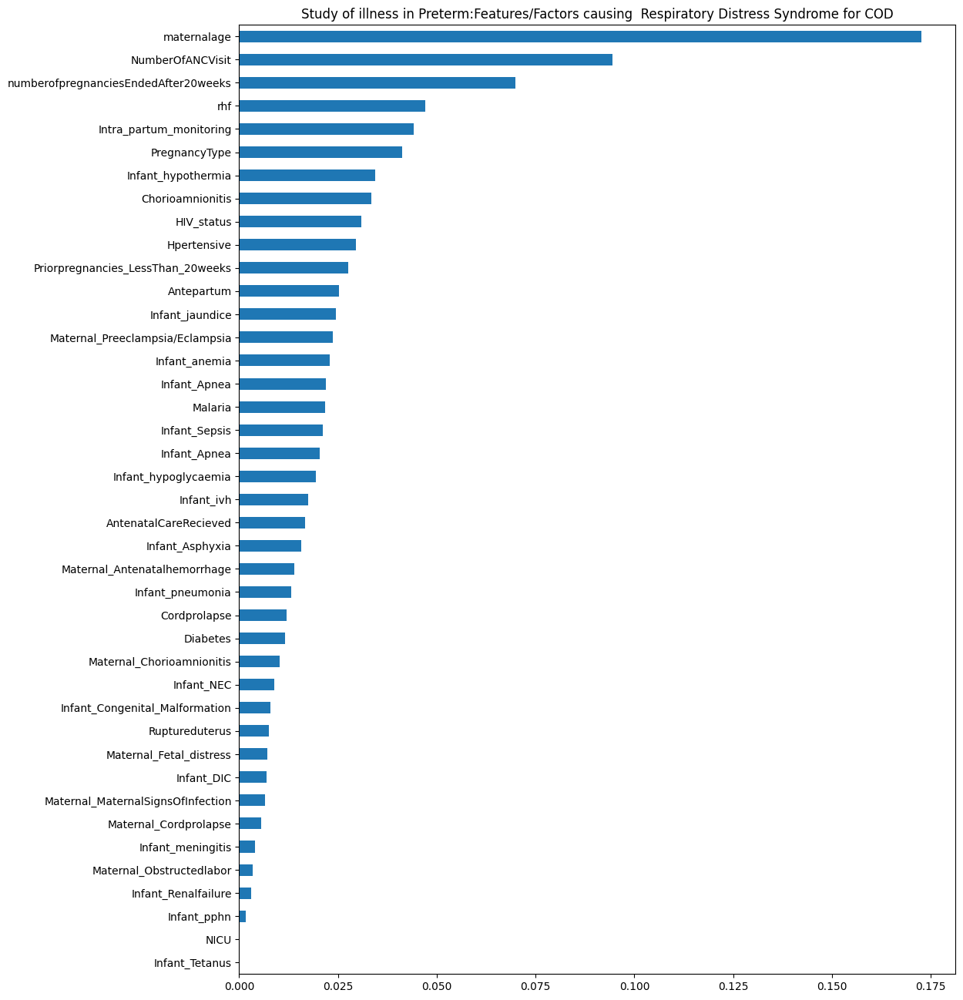

In [1607]:
#Sort and and plot the features in ascending order
SortedRTDSFactors=feature_scoresRDS.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:Features/Factors causing  Respiratory Distress Syndrome for COD")
SortedRTDSFactors.plot.barh()

In [1591]:
featurexgbRDS = pd.Series(xgbRDs.feature_importances_, index=Xa_RDS.columns).sort_values(ascending=False)
#feature_scoresRDS

<AxesSubplot: title={'center': 'Study of illness in Preterm:Features/Factors causing  Respiratory Distress Syndrome for COD using xgBoost'}>

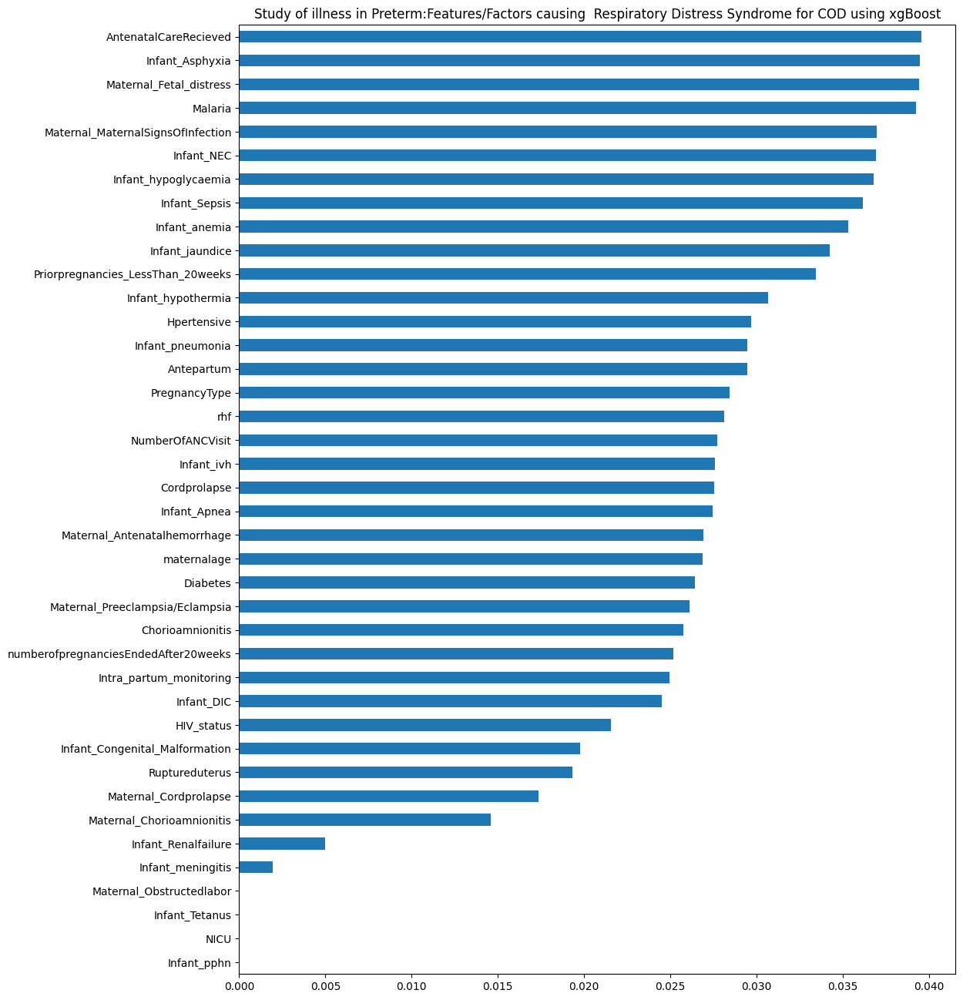

In [1592]:
#Sort and and plot the features in ascending order
SortedRTDSxgb=featurexgbRDS.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:Features/Factors causing  Respiratory Distress Syndrome for COD using xgBoost")
SortedRTDSxgb.plot.barh()

In [1483]:
X_Aphixia= CleandedataBeforeEncoded[[
      'Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_Sepsis',                            
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'Infant_hypothermia',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',       
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring'
      ]]
Y_Aphixia=CleandedataBeforeEncoded[['Infant_Asphyxia']]

In [1594]:
RFCAphixia=RFC.fit(X_Aphixia,Y_Aphixia)
AdbAphixia=AdB.fit(X_Aphixia,Y_Aphixia)
GRBAphixia=GRB.fit(X_Aphixia,Y_Aphixia)
lgstAphixia=lgst.fit(X_Aphixia,Y_Aphixia)
SVMAphixia=SV.fit(X_Aphixia,Y_Aphixia)
TreeAphixia=Tree.fit(X_Aphixia,Y_Aphixia)

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_78627/182486364.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  RFCAphixia=RFC.fit(X_Aphixia,Y_Aphixia)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array

In [1595]:
print('Random forest score for Aphixia',RFCAphixia.score(X_Aphixia,Y_Aphixia))
print('Gradient Boosting score for Aphixia ',GRBAphixia.score(X_Aphixia,Y_Aphixia))
print('Adaboost score for Aphixia',AdbAphixia.score(X_Aphixia,Y_Aphixia))
print('Decission Tree score for Aphixia',TreeAphixia.score(X_Aphixia,Y_Aphixia))
print('Logistic Regression  score for Aphixia',lgstAphixia.score(X_Aphixia,Y_Aphixia))
print('Support Vector Machine score for Aphixia',SVMAphixia.score(X_Aphixia,Y_Aphixia))

Random forest score for Aphixia 0.9981965734896303
Gradient Boosting score for Aphixia  0.933273219116321
Adaboost score for Aphixia 0.9170423805229937
Decission Tree score for Aphixia 0.9981965734896303
Logistic Regression  score for Aphixia 0.9125338142470695
Support Vector Machine score for Aphixia 0.9125338142470695


In [1492]:
#RFC,ADB,GRB,lgst,SV,Tree
GRBAphixia=GRB.fit(X_Aphixia,Y_Aphixia)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [1493]:
GRBAphixia.score(X_Aphixia,Y_Aphixia)

0.933273219116321

In [1489]:
feature_scoresAphixia = pd.Series(RFCAphixia.feature_importances_, index=X_Aphixia.columns).sort_values(ascending=False)
#feature_scoresAphixia

<AxesSubplot: title={'center': 'Study of illness in Preterm:Features/Factors causing  Aphixia for COD'}>

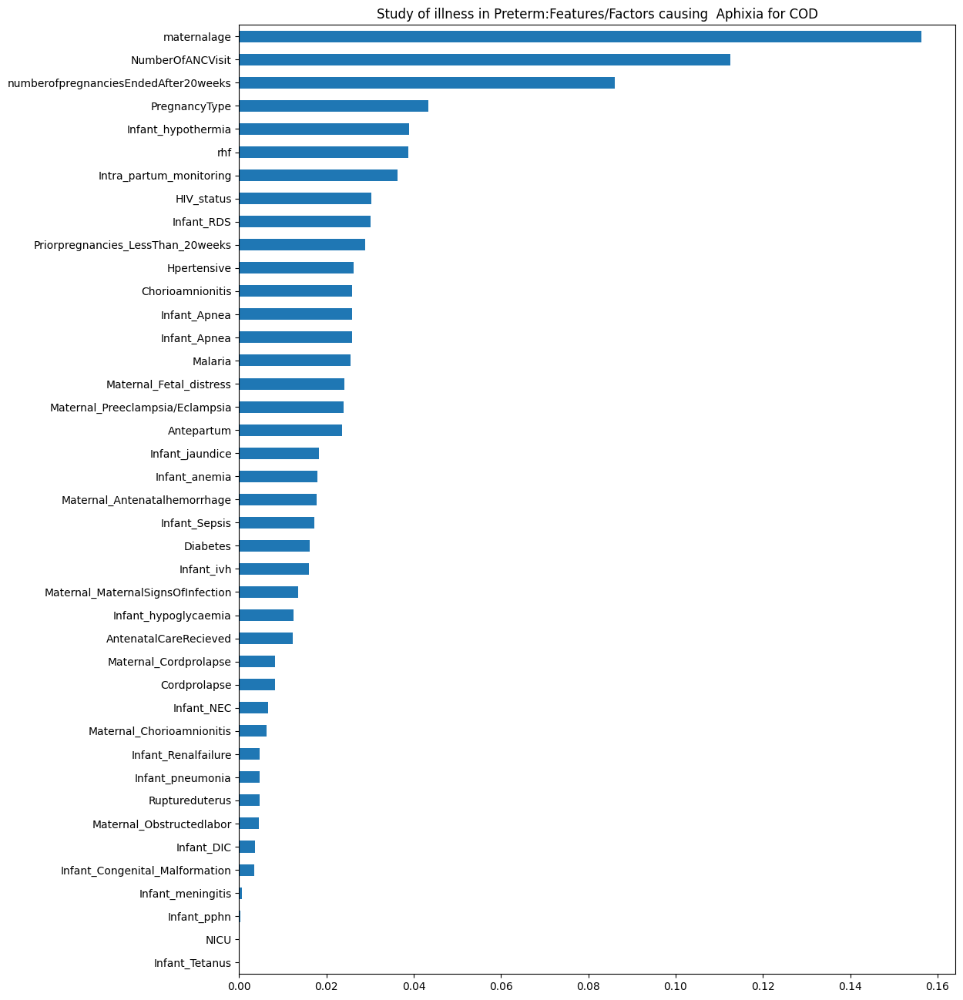

In [1490]:
#Sort and and plot the features in ascending order
SortedAphixiaFactors=feature_scoresAphixia.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:Features/Factors causing  Aphixia for COD")
SortedAphixiaFactors.plot.barh()

In [1494]:
feature_scoresGRBAphixia = pd.Series(GRBAphixia.feature_importances_, index=X_Aphixia.columns).sort_values(ascending=False)
#feature_scoresAphixia

<AxesSubplot: title={'center': 'Study of illness in Preterm:Features/Factors causing  Aphixia for COD using GRB'}>

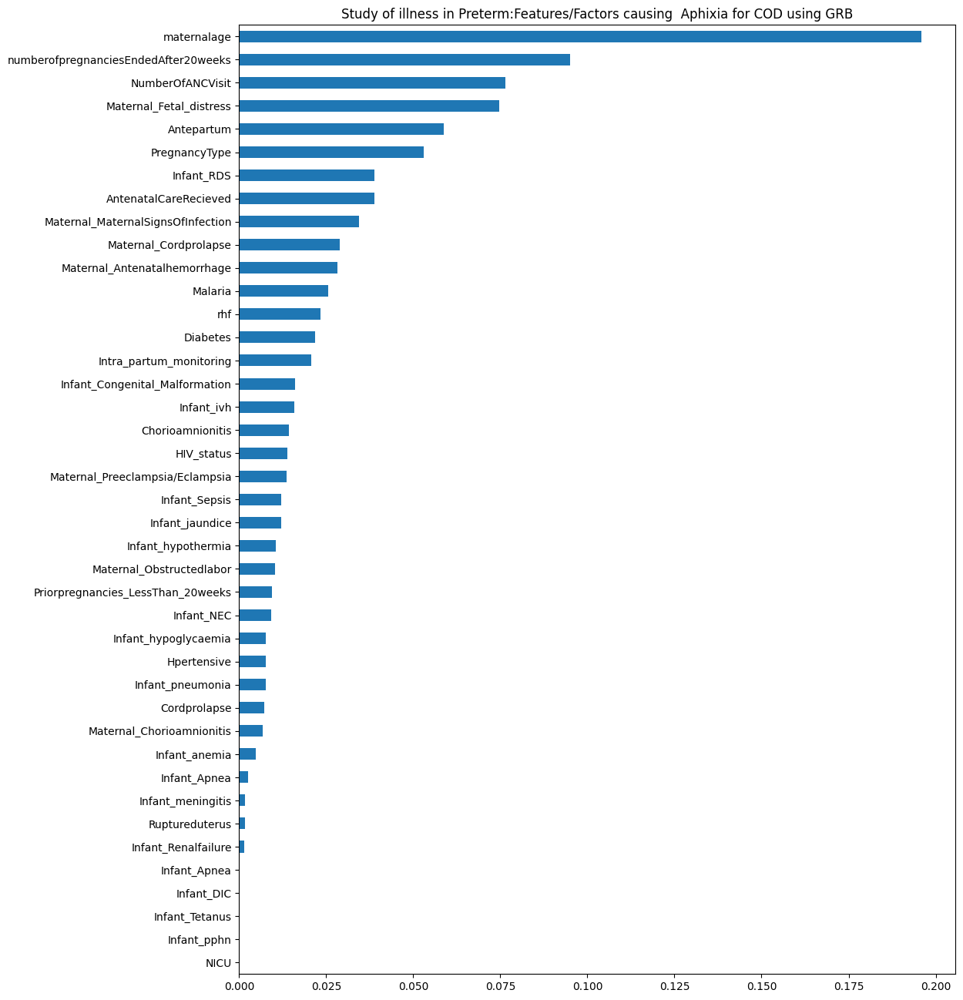

In [1495]:
#Sort and and plot the features in ascending order
SortedAphixiaFactorsGRB=feature_scoresGRBAphixia.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:Features/Factors causing  Aphixia for COD using GRB")
SortedAphixiaFactorsGRB.plot.barh()

In [1506]:
X_Apnea= CleandedataBeforeEncoded[[
      'Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_Sepsis',                            
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Asphyxia',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_hypothermia',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',       
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring'
      ]]
Y_Apnea=CleandedataBeforeEncoded[['Infant_Apnea']]

In [1507]:
RFCApnea=RFC.fit(X_Apnea,Y_Apnea)

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_78627/2575401080.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  RFCApnea=RFC.fit(X_Apnea,Y_Apnea)


In [1508]:
feature_scoresApnea = pd.Series(RFCApnea.feature_importances_, index=X_Apnea.columns).sort_values(ascending=False)
#feature_scoresAphixia

<AxesSubplot: title={'center': 'Study of illness in Preterm:Features/Factors causing  Aphixia for COD using GRB'}>

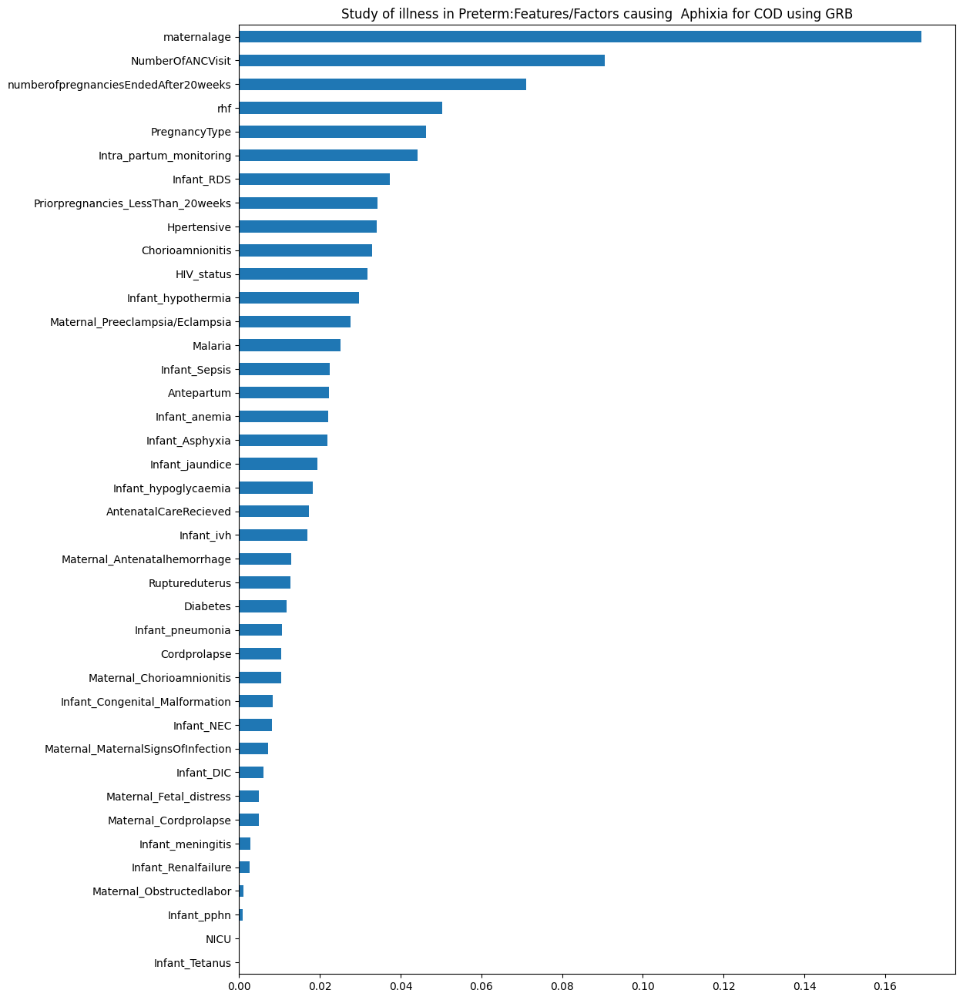

In [1509]:
#Sort and and plot the features in ascending order
SortedApnea=feature_scoresApnea.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:Features/Factors causing  Apnea for COD")
SortedApnea.plot.barh()

In [1516]:
X_Hypothemia= CleandedataBeforeEncoded[[
      'Infant_Congenital_Malformation',
      'Infant_RDS',
      'Infant_Sepsis',                            
      'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Asphyxia',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia/Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',       
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring'
      ]]
Y_hypothemia=CleandedataBeforeEncoded[['Infant_hypothermia']]

In [1517]:
RFCHypothemia=RFC.fit(X_Hypothemia,Y_hypothemia)

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_78627/3001522692.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  RFCHypothemia=RFC.fit(X_Hypothemia,Y_hypothemia)


In [1518]:
feature_scoreshypothemia = pd.Series(RFCHypothemia.feature_importances_, index=X_Hypothemia.columns).sort_values(ascending=False)
#feature_scoresAphixia

<AxesSubplot: title={'center': 'Study of illness in Preterm:Features/Factors causing  Hypothemia for COD'}>

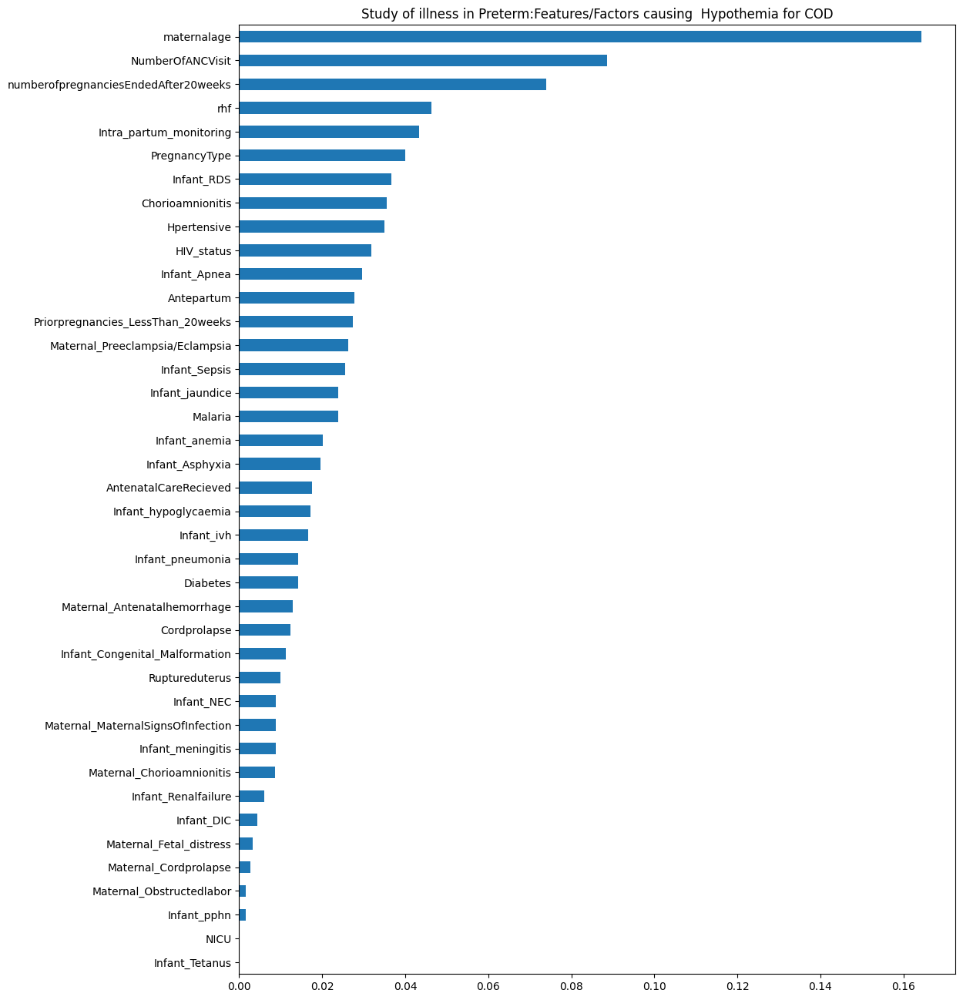

In [1519]:
#Sort and and plot the features in ascending order
SortedAhypoth=feature_scoreshypothemia.sort_values(ascending=True)
plt.figure(figsize=(12,16))
plt.title("Study of illness in Preterm:Features/Factors causing  Hypothemia for COD")
SortedAhypoth.plot.barh()

In [796]:
import xgboost as xgb

In [679]:
pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 3.2 MB/s eta 0:00:0000:0100:010m
Note: you may need to restart the kernel to use updated packages.


In [1534]:
#xgb_model = xgb.XGBRegressor(objective="reg:linear", random_state=42)
xgb_model = xgb.XGBClassifier()

In [1012]:
xgbmodel=xgb.XGBClassifier(learning_rate=0.01, n_estimators=140, max_depth=4,
 min_child_weight=6, gamma=0, subsample=0.85, colsample_bytree=0.75,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1,seed=27,reg_alpha=0)

In [908]:
from sklearn.model_selection import cross_val_score,cross_val_predict,GridSearchCV

In [994]:
param_test2b = {
 'min_child_weight':[6,8,10,12],
 'reg_alpha':[0, 0.001, 0.005, 0.01, 0.05],
 'subsample':[i/100.0 for i in range(75,90,5)],
 'colsample_bytree':[i/100.0 for i in range(75,90,5)]
}
optmizedxgbModel = GridSearchCV(estimator = xgbmodel, param_grid = param_test2b, scoring='roc_auc',n_jobs=4,cv=5)

In [995]:
optmizedxgbModel.fit(RDSFeatures,yRDS)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=0.8, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=0,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_b...
                                     max_delta_step=None, max_depth=4,
                                     max_leaves=None, min_child_weight=6,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=140,
                                     n_jobs=None, nthread=4,
                                     num_parallel_tree=None, ...),
             n_jobs=4,
             param_grid={'colsample_bytree': [0.75, 0.8, 0.85],
                         'min_child_weight': [6, 8, 10, 12],
                         'reg_alpha': [0, 0.001, 0.005, 0.01, 0.05],
                         'subsample': [0.75, 0.8, 0.85]},
             scoring='roc_auc')

In [1013]:
y=xgbmodel.fit(RDSFeatures,yRDS)

In [1014]:
y.score(RDSFeatures,yRDS)

0.7114517583408476

In [1004]:
optmizedxgbModel.best_params_

{'colsample_bytree': 0.75,
 'min_child_weight': 12,
 'reg_alpha': 0,
 'subsample': 0.85}

In [913]:
optmizedxgbModel.score(RDSFeatures,yRDS)

0.6684280002148903

In [957]:
#RDSXGB=xgb_model.fit(xz,yz)
RDSXGB=xgb_model.fit(RDSFeatures,yRDS,verbose=True)

In [958]:
RDSXGB.score(RDSFeatures,yRDS)

0.7547339945897205

In [717]:
from xgboost import XGBClassifier

In [901]:
xgb_model.get_params()

{'objective': 'binary:logistic',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': None,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [733]:
import xgboost as xgb

# Create regression matrices
dtrain_reg = xgb.DMatrix(X_train, y_train, enable_categorical=True)

In [767]:
# Create regression matrices
from sklearn.pipeline import Pipeline
from category_encoders.target_encoder import TargetEncoder
from xgboost import XGBClassifier

In [776]:
estimators=[('encoder',TargetEncoder()),
           ('clf',XGBClassifier(random_state=8))]

In [777]:
p=Pipeline(steps=estimators)

In [788]:
p.fit(xz,yz)

Pipeline(steps=[('encoder', TargetEncoder(cols=[])),
                ('clf',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=8, ...))])

In [1045]:
Cleaneddata[['Infant_Sepsis']].tail(20)

,Infant_Sepsis
1089,1
1090,0
1091,0
1092,0
1093,0
1094,0
1095,0
1096,0
1097,0
1098,0


In [1025]:
CleanedMerged.columns

Index(['StudyID', 'hospitalname_x', 'medicalrecordnumber_x', 'dateofscreening',
       'didmotherdeliveratoneofthepartic', 'wasbabytransferredfromotherfacil',
       'didbabyhaveapgar1orcriedbreathed', 'gestationalageinweeksbyballard',
       'ballardneuromuscularmaturityscor', 'ballardphysicalmaturityscore',
       ...
       'data', 'formcompletedby', 'dateofcompletion', 'obstructedlabor', 'ivh',
       'sepsis', 'pneumonia', 'hypoglycaemia', 'dic', 'Died'],
      dtype='object', length=484)

In [1106]:
CleanedMergedMod[['StudyID','sepsis','apnea']].tail(20)

,StudyID,sepsis,apnea
1089,TA1308,YES,No
1090,TA0572,No,No
1091,SP0719,No,Yes
1092,SP0711,No,Yes
1093,TA1108-2,No,Yes
1094,TA0427,No,No
1095,TA0552,No,No
1096,TA0468,No,No
1097,TA1544,No,Yes
1098,SP0474,No,No


In [1093]:
Cleaneddata[['Infant_Sepsis','Infant_Apnea']].tail(20)

,Infant_Sepsis,Infant_Apnea
1089,1,0
1090,0,0
1091,0,1
1092,0,1
1093,0,1
1094,0,0
1095,0,0
1096,0,0
1097,0,1
1098,0,0


In [1100]:
x=data[data['studyid']=='GU0552']

In [1098]:
x

,uniquekey,hospitalid,studyid,medicalrecord,gestationalageweeks,days,days1,postnatalageweeks,ifinfantdiedatorpriortoday28date,causeaccordingtopanelconsensus,...,specify1,data,formcompletedby,dateofcompletion,obstructedlabor,ivh,sepsis,pneumonia,hypoglycaemia,dic
555,456.0,GUH,GU0551-1,671342.0,31.0,0.0,1.0,0.0,21-10-2017 0:00,18,...,,2.0,Dr. Hailu,24-04-2018 0:00,No,No,No,No,No,No


In [1101]:
x[['studyid','sepsis','apnea']]

,studyid,sepsis,apnea
549,GU0552,No,Yes


(4919, 126)

In [1122]:
Obtric.to_csv("Obtric.csv",index=False)

In [245]:
CleanedMergedMod.shape

In [268]:
CleanedMergedMod1=pd.read_csv('what.csv')

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_1777/1531930816.py:1: DtypeWarning: Columns (10,112,156,180,196,207,208,272,280,285,307,320,345,369,381,384,391,392,404,414,423,452) have mixed types. Specify dtype option on import or set low_memory=False.
  CleanedMergedMod1=pd.read_csv('what.csv')


In [1419]:
CleanedMergedMod.to_csv("what.csv",index=False)

In [223]:
CleanedMergedFinal=CleanedMergedMod.copy()

In [ ]:
maternalage
isthismothersfirstpregnancy
priorpregnanciesendingat20weeks
numberofpriorpregnanciesthatappe
numberofpregnanciesthatappearedt
antenatalcareancreceived
numberofvisitswhetherinthisoroth
numberofvisitswhetherinthisoroth
rhfactor1
hivaidsserostatus1
diabetesmellitus
malariaduringhecurrentpregnancy1
hypertensivedisordersofpregnancy
antepartumhemorrhageaph
csection
ispregnancy
preeclampsia
eclampsia
chronichypertension
n32chorioamnionitis
multiplepregnancy
prolongedorobstructedlabor
deliveryattendant
durationofruptureofmembraneinhou
cordprolapse
ruptureduterus
intrapartumfhrmonitoring

In [271]:
#Rename the columns to apropraite Name
CleanedMergedMod=CleanedMergedMod.rename(columns={
      'priorpregnanciesendingat20weeks':'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesthatappearedt':'numberofpregnanciesEndedAfter20weeks',
      'antenatalcareancreceived':'AntenatalCareRecieved',
      'numberofvisitswhetherinthisoroth':'NumberOfANCVisit',
      'rhfactor1':'rhf',
      'hivaidsserostatus1':'HIV_status',
      'diabetesmellitus':'Diabetes',
      'malariaduringhecurrentpregnancy1':'Malaria',
      'hypertensivedisordersofpregnancy':'Hpertensive',
      'antepartumhemorrhageaph':'Antepartum',
      'ifyes2':'PlacentaPrevia1_AbruptioPlacenta2',        
      'ispregnancy':'PregnancyType',
      'n32chorioamnionitis':'Chorioamnionitis',
      'cordprolapse':'Cordprolapse',
      'ruptureduterus':'Ruptureduterus',
      'intrapartumfhrmonitoring':'Intra_partum_monitoring'})

In [357]:
CleanedMergedMod=CleanedMergedMod.rename(columns={'ispregnancy':'PregnancyType'})

In [380]:
CleanedMergedMod=CleanedMergedMod.rename(columns={'ICU':'NICU'})

In [383]:
CleanedMergedMod['NICU'].replace('Yes',1,inplace=True)

In [277]:
CleanedMergedMod['maternalage'].isnull().sum()

0

In [273]:
#Fill the NAs in  'NumberOfANCVisit' with mean
agemean=CleanedMergedMod['NumberOfANCVisit'].mean()
CleanedMergedMod['NumberOfANCVisit']=CleanedMergedMod['NumberOfANCVisit'].fillna(agemean)

In [276]:
agemean=CleanedMergedMod['maternalage'].mean()
CleanedMergedMod['maternalage']=CleanedMergedMod['maternalage'].fillna(agemean)

In [301]:
prior=CleanedMergedMod['Priorpregnancies_LessThan_20weeks'].mean()
CleanedMergedMod['Priorpregnancies_LessThan_20weeks']=CleanedMergedMod['Priorpregnancies_LessThan_20weeks'].fillna(prior)

In [302]:
after=CleanedMergedMod['numberofpregnanciesEndedAfter20weeks'].mean()
CleanedMergedMod['numberofpregnanciesEndedAfter20weeks']=CleanedMergedMod['numberofpregnanciesEndedAfter20weeks'].fillna(after)

In [ ]:
#----Here start filling  NAN for each column that you did not fill with out mean as above

In [ ]:
import numpy as np

In [304]:
#Before removing NAS for others, take backup
CleanedMergedModBack=CleanedMergedMod.copy()

In [384]:
#Here check the NAN in each column one by one 
CleanedMergedMod['NICU'].isna().sum()

0

In [385]:

#check what are the unique values in each column including the NAS
CleanedMergedMod['NICU'].unique()

array([1])

In [374]:
#After checking NAS, fill the using np.nan
CleanedMergedMod['Intra_partum_monitoring'].replace(np.nan,0,inplace=True)

In [388]:

#Here save the cleaned data from the forms that does not include the the child death(Form12B)
CleanedMergedMod.to_csv("CleanedMergedMod.csv",index=False)


In [392]:
len(CleanedForMerge)

In [389]:
#Before Hote Endocding
CleanedForMerge=CleanedMergedMod[['maternalage','isthismothersfirstpregnancy',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',
      'PlacentaPrevia1_AbruptioPlacenta2',        
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'NICU',                              
      'Intra_partum_monitoring']]

In [390]:
#After Hot Encoding
CleanedHotEndcoded=CleanedMergedMod1[['Preg_1.0','Preg_2.0',
                                     'AntenatalCareRecieved_1.0',
                                     'AntenatalCareRecieved_2.0',
                                     'RH_Factor_1.0',
                                     'RH_Factor_2.0',
                                     'HIV_status_1.0',
                                     'HIV_status_2.0',
                                     'Diabetes_1.0',
                                     'Diabetes_2.0',
                                     'Malaria_1.0',
                                     'Malaria_2.0',
                                     'Hpertensive_1.0',
                                     'Hpertensive_2.0',
                                     'Antepartum_1.0',
                                     'Antepartum_2.0',
                                     'Chorioamnionitis_1.0',
                                     'Chorioamnionitis_2.0',
                                     'Cordprolapse_1.0',
                                     'Cordprolapse_2.0',
                                     'Ruptureduterus_1.0',
                                     'Ruptureduterus_2.0',
                                     'Intra_partum_monitoring_1.0',
                                     'Intra_partum_monitoring_2.0'
                                    ]]

In [393]:
#Concatenate 'merged data before Hot encoding' with the  data to the main 'cleanedData 
CleandedataBeforeEncoded=pd.concat([Cleaneddata,CleanedForMerge],axis=1)

In [397]:

#Here is the final merged cleaned dataset of Cleaned 'death data' and 'cleaned form data (CleanedForMerge or Form12 B)''
CleandedataBeforeEncoded.to_csv("CleandedataBeforeEncoded.csv",index=False)

In [394]:
#Concatenate 'merged data After Hot encoding' with the  data to the main 'cleanedData 
CleandedataAfterEncoded=pd.concat([Cleaneddata,CleanedHotEndcoded],axis=1)

In [398]:
#Here is the final cleaned dataset of Cleaned death data and cleaned form data (CleanedForMerge or Form12 B) after hot encoding
CleandedataAfterEncoded.to_csv("CleandedataAfterEncoded.csv",index=False)

In [399]:
len(CleandedataBeforeEncoded)

In [400]:
casual.columns

Index(['Infant_Congenital_Malformation', 'Infant_RDS', 'Infant_Asphyxia',
       'Infant_DIC', 'Infant_pphn', 'Infant_ivh', 'Infant_Sepsis',
       'Infant_pneumonia', 'Infant_meningitis', 'Infant_NEC',
       'Infant_hypothermia', 'Infant_Apnea', 'Infant_jaundice',
       'Infant_anemia', 'Infant_Renalfailure', 'Infant_Tetanus',
       'Infant_hypoglycaemia', 'Maternal_Obstructedlabor',
       'Maternal_Cordprolapse', 'Maternal_Fetal_distress',
       'Maternal_Antenatalhemorrhage', 'Maternal_Preeclampsia/Eclampsia',
       'Maternal_MaternalSignsOfInfection', 'Maternal_Chorioamnionitis',
       'maternalage', 'isthismothersfirstpregnancy',
       'Priorpregnancies_LessThan_20weeks',
       'numberofpregnanciesEndedAfter20weeks', 'AntenatalCareRecieved',
       'NumberOfANCVisit', 'rhf', 'HIV_status', 'Diabetes', 'Malaria',
       'Hpertensive', 'Antepartum', 'PlacentaPrevia1_AbruptioPlacenta2',
       'PregnancyType', 'Chorioamnionitis', 'Cordprolapse', 'Ruptureduterus',
       'NICU

In [403]:
# Casual Modeling
casual=CleandedataBeforeEncoded.copy()

In [459]:
#AntenatalCareRecieved(0.066)
#Malaria(0.037)
#Hpertensive(0.072)
#Antepartum(0.076)
#numberofpregnanciesEndedAfter20weeks(0.017)
#PregnancyType(-0.04)

#Infant_RDS(-0.099)
#Infant_Asphyxia(-0.064)
#Infant_Apnea(-0.07)

g="""digraph{
AntenatalCareRecieved;
Malaria;
Antepartum;
Hpertensive;
numberofpregnanciesEndedAfter20weeks;
PregnancyType;
Infant_RDS;
Infant_Asphyxia;
Infant_Sepsis;
nfant_Apnea;

Antepartum ->Infant_Sepsis;
Hpertensive ->Infant_Sepsis;
AntenatalCareRecieved -> Infant_Sepsis;
AntenatalCareRecieved -> Infant_Sepsis;
numberofpregnanciesEndedAfter20weeks -> Infant_Sepsis;
Infant_RDS ->Infant_Sepsis;
PregnancyType ->Infant_Sepsis;
}"""


In [ ]:

#Here we start to compute casual effect of  Antepartum on Sepsis

In [460]:
treatment_col="Antepartum"
outcome_col="Infant_Sepsis"
model=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/dowhy/causal_model.py:582: UserWarning: 1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
  warnings.warn(


In [461]:
identified_estimand=model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                        
─────────────(E[Infant_Sepsis])
d[Antepartum]                  
Estimand assumption 1, Unconfoundedness: If U→{Antepartum} and U→Infant_Sepsis then P(Infant_Sepsis|Antepartum,,U) = P(Infant_Sepsis|Antepartum,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [462]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of Antepartum on Sepsis " + str(estimate.value))

casual estimate of Antepartum on Sepsis 0.06832779993866886


In [410]:
refute_placebo=model.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

Refute: Use a Placebo Treatment
Estimated effect:0.06832779993866886
New effect:-0.004814986419701941
p value:0.86



In [463]:
#Here we start to compute casual effect of  Hpertensive on sepsis

treatment_col="Hpertensive"
outcome_col="Infant_Sepsis"
model1=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/dowhy/causal_model.py:582: UserWarning: 1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
  warnings.warn(


In [464]:
identified_estimand=model1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                         
──────────────(E[Infant_Sepsis])
d[Hpertensive]                  
Estimand assumption 1, Unconfoundedness: If U→{Hpertensive} and U→Infant_Sepsis then P(Infant_Sepsis|Hpertensive,,U) = P(Infant_Sepsis|Hpertensive,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [465]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model1.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of hypertensive on sepsis is " + str(estimate.value))

casual estimate of hypertensive on sepsis is 0.05432383597821662


In [414]:
refute_placebo=model1.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

Refute: Use a Placebo Treatment
Estimated effect:0.05432383597821662
New effect:-0.0033859572522867477
p value:0.92



In [455]:

#Here we start to compute casual effect of  AntenatalCareRecieved on sepsis

treatment_col="AntenatalCareRecieved"
outcome_col="Infant_Sepsis"
model2=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g)

In [456]:
identified_estimand=model2.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                              
────────────────────────(E[Infant_Sepsis])
d[AntenatalCareRecieved]                  
Estimand assumption 1, Unconfoundedness: If U→{AntenatalCareRecieved} and U→Infant_Sepsis then P(Infant_Sepsis|AntenatalCareRecieved,,U) = P(Infant_Sepsis|AntenatalCareRecieved,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [457]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model2.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of AntenatalCareRecieved  on sepsis is " + str(estimate.value))

casual estimate of AntenatalCareRecieved  on sepsis is 0.0765140138091148


In [486]:
refute_placebo=model2.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


Refute: Use a Placebo Treatment
Estimated effect:0.09967003099041277
New effect:1259.876633422947
p value:0.96



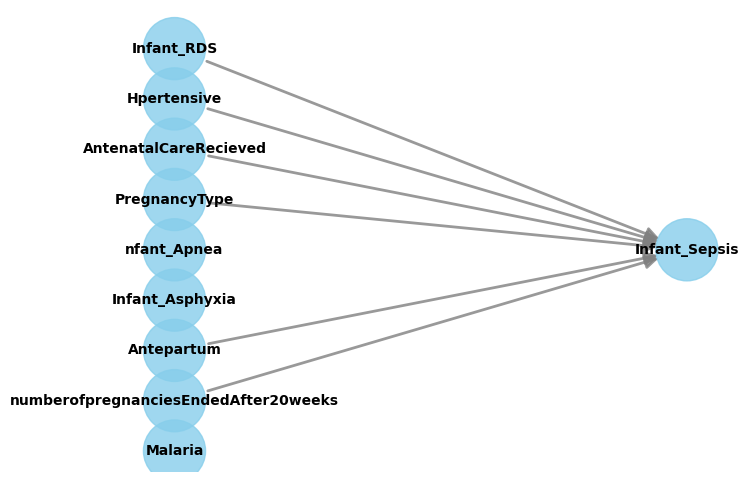

<bound method CausalModel.get_estimator of <dowhy.causal_model.CausalModel object at 0x2ae11caf0>>

In [466]:
#plt.figure(figsize=(12,12))
model.view_model()
model.get_estimator

In [479]:
casual.rename(columns={'Maternal_Preeclampsia/Eclampsia':'Maternal_Preeclampsia_Eclampsia'},inplace=True)

In [498]:
#Here We begin to assess the causes of aphixia

#Maternal_Antenatalhemorrhage(0.091)
#Maternal_Cordprolapse(0.066)
#Maternalage(0.051)
#NumberOfANCVisit(0.048)
#Maternal_MaternalSignsOfInfection(0.045)
#Maternal_Obstructedlabor(0.035)
#Maternal_Preeclampsia/Eclampsia(0.032)
#Infant_anemia(0.032)
#Diabetes(0.024)
#AntenatalCareRecieved(-0.069)
g1="""digraph{
Maternal_Antenatalhemorrhage;
Maternal_Cordprolapse;
maternalage;
Hpertensive;
NumberOfANCVisit;
AntenatalCareRecieved;
Maternal_MaternalSignsOfInfection;
Maternal_Obstructedlabor;
Maternal_Preeclampsia_Eclampsia;
Infant_anemia;
Diabetes;
Infant_Asphyxia;

Maternal_Antenatalhemorrhage ->Infant_Asphyxia;
Maternal_Cordprolapse ->Infant_Asphyxia;
maternalage ->Infant_Asphyxia;
Hpertensive ->Infant_Asphyxia;
NumberOfANCVisit ->Infant_Asphyxia;
AntenatalCareRecieved ->Infant_Asphyxia;
Maternal_MaternalSignsOfInfection ->Infant_Asphyxia;
Maternal_Obstructedlabor ->Infant_Asphyxia;
Maternal_Preeclampsia_Eclampsia ->Infant_Asphyxia;
Infant_anemia ->Infant_Asphyxia;
Diabetes ->Infant_Asphyxia;
}"""

In [482]:
#Here we start the infering the casual effect of  Antenatalhemorrhage on Aphixia
treatment_col="Maternal_Antenatalhemorrhage"
outcome_col="Infant_Asphyxia"
model=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g1)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/dowhy/causal_model.py:582: UserWarning: 1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
  warnings.warn(


In [483]:
identified_estimand=model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                   
───────────────────────────────(E[Infant_Asphyxia])
d[Maternal_Antenatalhemorrhage]                    
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Antenatalhemorrhage} and U→Infant_Asphyxia then P(Infant_Asphyxia|Maternal_Antenatalhemorrhage,,U) = P(Infant_Asphyxia|Maternal_Antenatalhemorrhage,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [484]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of Antenatalhemorrhage on Aphixia " + str(estimate.value))

casual estimate of Antenatalhemorrhage on Aphixia 0.09967003099041277


In [487]:
refute_placebo=model.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np

Refute: Use a Placebo Treatment
Estimated effect:0.09967003099041277
New effect:-0.004093052848423337
p value:0.9



In [488]:

#Here we start the infering the casual effect of  Maternal_Cordprolapse on Aphixia
treatment_col="Maternal_Cordprolapse"
outcome_col="Infant_Asphyxia"
model1=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g1)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/dowhy/causal_model.py:582: UserWarning: 1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
  warnings.warn(


In [489]:
identified_estimand=model1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                                
────────────────────────(E[Infant_Asphyxia])
d[Maternal_Cordprolapse]                    
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Cordprolapse} and U→Infant_Asphyxia then P(Infant_Asphyxia|Maternal_Cordprolapse,,U) = P(Infant_Asphyxia|Maternal_Cordprolapse,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [490]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model1.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of Cordprolapse on Aphixia " + str(estimate.value))

casual estimate of Cordprolapse on Aphixia 0.1095979884470315


/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


In [491]:
refute_placebo=model1.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np

Refute: Use a Placebo Treatment
Estimated effect:0.1095979884470315
New effect:1246294191.0941827
p value:1.0



/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


In [499]:

#Here we start the infering the casual effect of  Maternalage on Aphixia
treatment_col="maternalage"
outcome_col="Infant_Asphyxia"
model2=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g1)

In [500]:
identified_estimand=model2.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                           
──────────────(E[Infant_Asphyxia])
d[maternalage]                    
Estimand assumption 1, Unconfoundedness: If U→{maternalage} and U→Infant_Asphyxia then P(Infant_Asphyxia|maternalage,,U) = P(Infant_Asphyxia|maternalage,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [501]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model2.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of Maternal Age on Aphixia " + str(estimate.value))

casual estimate of Maternal Age on Aphixia 0.0015240542709889435


In [502]:
refute_placebo=model2.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

Refute: Use a Placebo Treatment
Estimated effect:0.0015240542709889435
New effect:-0.00012952807371096603
p value:0.92



In [521]:

#Here we start the infering the casual effect of  NumberOfANCVisit on Aphixia
treatment_col="NumberOfANCVisit"
outcome_col="Infant_Asphyxia"
model3=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g1)

In [522]:
identified_estimand=model3.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                             
───────────────────(E[Infant_Asphyxia])
d[NumberOfANCVisit]                    
Estimand assumption 1, Unconfoundedness: If U→{NumberOfANCVisit} and U→Infant_Asphyxia then P(Infant_Asphyxia|NumberOfANCVisit,,U) = P(Infant_Asphyxia|NumberOfANCVisit,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [523]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model3.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of NumberOfANCVisit on Aphixia " + str(estimate.value))

casual estimate of NumberOfANCVisit on Aphixia 0.008802828977734975


In [524]:
refute_placebo=model3.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

Refute: Use a Placebo Treatment
Estimated effect:0.008802828977734975
New effect:0.0008015643434891942
p value:0.8799999999999999



In [525]:

#Here we start the infering the casual effect of  wether AntenatalCareRecieved on Aphixia
treatment_col="AntenatalCareRecieved"
outcome_col="Infant_Asphyxia"
model4=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g1)

In [526]:
identified_estimand=model4.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                                
────────────────────────(E[Infant_Asphyxia])
d[AntenatalCareRecieved]                    
Estimand assumption 1, Unconfoundedness: If U→{AntenatalCareRecieved} and U→Infant_Asphyxia then P(Infant_Asphyxia|AntenatalCareRecieved,,U) = P(Infant_Asphyxia|AntenatalCareRecieved,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [527]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model4.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of wether mothers recieved Antenatal care on Aphixia " + str(estimate.value))

casual estimate of wether mothers recieved Antenatal care on Aphixia -0.047605985321195074


In [528]:
refute_placebo=model3.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

Refute: Use a Placebo Treatment
Estimated effect:-0.047605985321195074
New effect:-0.0030371786409636474
p value:0.98



In [529]:
#Here we start the infering the casual effect of  MaternalSignsOfInfection on Aphixia
treatment_col="Maternal_MaternalSignsOfInfection"
outcome_col="Infant_Asphyxia"
model5=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g1)

In [530]:
identified_estimand=model5.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                      
────────────────────────────────────(E[Infant_Asphyxia])
d[Maternal_MaternalSignsOfInfection]                    
Estimand assumption 1, Unconfoundedness: If U→{Maternal_MaternalSignsOfInfection} and U→Infant_Asphyxia then P(Infant_Asphyxia|Maternal_MaternalSignsOfInfection,,U) = P(Infant_Asphyxia|Maternal_MaternalSignsOfInfection,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [531]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model5.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of MaternalSignsOfInfection effect on Aphixia " + str(estimate.value))

casual estimate of MaternalSignsOfInfection effect on Aphixia 0.2008971879771742


In [532]:
refute_placebo=model5.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

Refute: Use a Placebo Treatment
Estimated effect:0.2008971879771742
New effect:-0.00033275900335105984
p value:0.98



In [537]:
#Here we start the infering the casual effect of  Obstructedlabor on Aphixia
treatment_col="Maternal_Obstructedlabor"
outcome_col="Infant_Asphyxia"
model6=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g1)

In [538]:
identified_estimand=model6.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
             d                                 
───────────────────────────(E[Infant_Asphyxia])
d[Maternal_Obstructedlabor]                    
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Obstructedlabor} and U→Infant_Asphyxia then P(Infant_Asphyxia|Maternal_Obstructedlabor,,U) = P(Infant_Asphyxia|Maternal_Obstructedlabor,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [539]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model6.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of Obstructed Labour effect on Aphixia " + str(estimate.value))

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


casual estimate of Obstructed Labour effect on Aphixia 0.07432674117021318


In [540]:
refute_placebo=model6.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np

Refute: Use a Placebo Treatment
Estimated effect:0.07432674117021318
New effect:-11719016385.44647
p value:0.3



In [545]:
#Here we start the infering the casual effect of  Maternal_Preeclampsia_Eclampsia on Aphixia
treatment_col="Maternal_Preeclampsia_Eclampsia"
outcome_col="Infant_Asphyxia"
model7=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g1)

In [546]:
identified_estimand=model7.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                     
──────────────────────────────────(E[Infant_Asphyxia])
d[Maternal_Preeclampsia_Eclampsia]                    
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preeclampsia_Eclampsia} and U→Infant_Asphyxia then P(Infant_Asphyxia|Maternal_Preeclampsia_Eclampsia,,U) = P(Infant_Asphyxia|Maternal_Preeclampsia_Eclampsia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [547]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model7.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of Maternal_Preeclampsia_Eclampsia effect on Aphixia " + str(estimate.value))

casual estimate of Maternal_Preeclampsia_Eclampsia effect on Aphixia -0.007931905020432825


In [548]:
refute_placebo=model7.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

Refute: Use a Placebo Treatment
Estimated effect:-0.007931905020432825
New effect:-0.005081577042073884
p value:0.72



In [549]:
#Here we start the infering the casual effect of  Anemia on Aphixia
treatment_col="Infant_anemia"
outcome_col="Infant_Asphyxia"
model8=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g1)

In [550]:
identified_estimand=model8.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                           
───────────────(E[Infant_Asphyxia])
d[Infantₐₙₑₘᵢₐ]                    
Estimand assumption 1, Unconfoundedness: If U→{Infant_anemia} and U→Infant_Asphyxia then P(Infant_Asphyxia|Infant_anemia,,U) = P(Infant_Asphyxia|Infant_anemia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [551]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model8.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of Anemia effect on Aphixia " + str(estimate.value))

casual estimate of Anemia effect on Aphixia -0.030914455937510653


In [552]:
refute_placebo=model8.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


Refute: Use a Placebo Treatment
Estimated effect:-0.030914455937510653
New effect:-0.0017078120225679488
p value:0.94



In [559]:

#Here we start the infering the casual effect of  Diabetes on Aphixia
treatment_col="Diabetes"
outcome_col="Infant_Asphyxia"
model9=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g1)

In [560]:
identified_estimand=model9.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                         
───────────(E[Infant_Asphyxia])
d[Diabetes]                    
Estimand assumption 1, Unconfoundedness: If U→{Diabetes} and U→Infant_Asphyxia then P(Infant_Asphyxia|Diabetes,,U) = P(Infant_Asphyxia|Diabetes,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [565]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model9.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of Diabet effect on Aphixia " + str(estimate.value))

casual estimate of Diabet effect on Aphixia 0.03127053803441552


In [566]:
refute_placebo=model9.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

Refute: Use a Placebo Treatment
Estimated effect:0.03127053803441552
New effect:-0.000670091229502292
p value:0.98



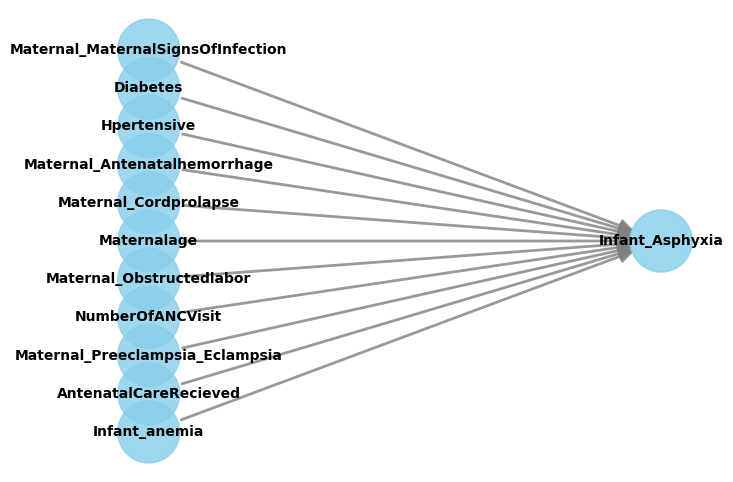

<bound method CausalModel.get_estimator of <dowhy.causal_model.CausalModel object at 0x2ae8a6350>>

In [511]:
model.view_model()
model.get_estimator

In [ ]:
Infant_anemia(0.074)
Maternal_Fetal_distress(0.071)
Infant_hypothermia(0.068)
Hpertensive(0.066)
PregnancyType(0.66)
Maternal_Cordprolapse(0.052)
Infant_ivh(0.051)
Infant_Apnea(0.047)
AntenatalCareRecieved(0.043)
Infant_hypoglycaemia(0.032)
Infant_NEC(0.031)
Maternal_Obstructedlabor(0.026)
Maternal_MaternalSignsOfInfection(-0.064)
numberofpregnanciesEndedAfter20weeks(-0.061)
maternalage(-0.043)

In [570]:
g2="""digraph{
Infant_anemia;
Maternal_Fetal_distress;
Infant_hypothermia;
Hpertensive;
PregnancyType;
Maternal_Cordprolapse;
Infant_ivh;
Infant_Apnea;
AntenatalCareRecieved;
Infant_hypoglycaemia;
Infant_NEC;
Maternal_Obstructedlabor;
Maternal_MaternalSignsOfInfection;
numberofpregnanciesEndedAfter20weeks;
maternalage;
Infant_RDS;

Infant_anemia ->Infant_RDS;
Maternal_Fetal_distress ->Infant_RDS;
Infant_hypothermia ->Infant_RDS;
PregnancyType ->Infant_RDS;
Hpertensive ->Infant_RDS;
Maternal_Cordprolapse ->Infant_RDS;
AntenatalCareRecieved ->Infant_RDS;
numberofpregnanciesEndedAfter20weeks ->Infant_RDS;
Maternal_Obstructedlabor ->Infant_RDS;
Maternal_MaternalSignsOfInfection ->Infant_RDS;
Infant_Apnea ->Infant_RDS;
Infant_NEC ->Infant_RDS;
Infant_ivh ->Infant_RDS;
Infant_hypoglycaemia ->Infant_RDS;
maternalage ->Infant_RDS;

}"""

In [571]:
#Here we start the infering the casual effect of Anemia on RDS
treatment_col="Infant_anemia"
outcome_col="Infant_RDS"
model=CausalModel(
data=casual,
treatment=treatment_col,
outcome=outcome_col,
graph=g2)

In [572]:
identified_estimand=model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                      
───────────────(E[Infant_RDS])
d[Infantₐₙₑₘᵢₐ]               
Estimand assumption 1, Unconfoundedness: If U→{Infant_anemia} and U→Infant_RDS then P(Infant_RDS|Infant_anemia,,U) = P(Infant_RDS|Infant_anemia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



In [573]:
method="backdoor.linear_regression"
desired_effect="ate"
estimate=model.estimate_effect(identified_estimand,
                              method_name=method,
                              target_units=desired_effect,
                              method_params={"weighting_scheme":"ips_weight"})
print("casual estimate of Anemia effect on RDS " + str(estimate.value))

casual estimate of Anemia effect on RDS 0.11284534630918924


In [574]:
refute_placebo=model.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1934: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


Refute: Use a Placebo Treatment
Estimated effect:0.11284534630918924
New effect:-0.0018889141107689784
p value:1.0



In [868]:


# Define Causal Model
model=CausalModel(
        data = casual,
        treatment='Infant_anemia',
        outcome='Infant_RDS',
        graph=g2)

# Identification
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

# Estimation
estimate = model.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=True,
                                test_significance=True)
print("Causal Estimate is " + str(estimate.value))



Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                      
───────────────(E[Infant_RDS])
d[Infantₐₙₑₘᵢₐ]               
Estimand assumption 1, Unconfoundedness: If U→{Infant_anemia} and U→Infant_RDS then P(Infant_RDS|Infant_anemia,,U) = P(Infant_RDS|Infant_anemia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



divide by zero encountered in scalar divide
divide by zero encountered in scalar divide
divide by zero encountered in scalar divide


Causal Estimate is 0.11284534630918924


In [897]:
#Here we start to see the underlying causes  of Apnea

#Infant_Congenital_Malformation(-0.042)
#Infant_pneumonia(-0.056)
#Infant_meningitis(-0.031)
#Infant_Sepsis(-0.076)
#Infant_Renalfailure(-0.073)
#NumberOfANCVisit(-0.014)
#rhf(-0.093)
#HIV_status(-0.11)
#Hpertensive(-0.036)
#Malaria(-0.032)
#PlacentaPrevia1_AbruptioPlacenta2 (-0.066)
#Intra_partum_monitoring(-0.03)
#Infant_RDS(0.047)
#Infant_DIC(0.057)
#Infant_hypoglycaemia(0.028)
#Maternal_Cordprolapse(0.047)
#Maternal_Fetal_distress(0.23)
#Maternal_Preeclampsia/Eclampsia(0.044)
#Infant_hypothermia(0.14)
#maternalage(0.04)
#Priorpregnancies_LessThan_20weeks(0.034)
#AntenatalCareRecieved(0.03)
#PregnancyType(0.036)

g3="""digraph{
Infant_hypothermia;
Infant_DIC;
Infant_RDS;
Maternal_Cordprolapse;
Maternal_Preeclampsia_Eclampsia;
maternalage;
PregnancyType;
Priorpregnancies_LessThan_20weeks;
AntenatalCareRecieved;
Infant_hypoglycaemia;
Infant_Congenital_Malformation;
Infant_pneumonia;
Infant_Renalfailure;
NumberOfANCVisit;
rhf;
HIV_status;
Hpertensive;
Malaria;
Intra_partum_monitoring;
Infant_anemia;
Diabetes;
Infant_Apnea;

Infant_hypothermia ->Infant_Apnea;
Infant_DIC ->Infant_Apnea;
Infant_RDS ->Infant_Apnea;
Maternal_Cordprolapse ->Infant_Apnea;
Maternal_Preeclampsia_Eclampsia ->Infant_Apnea;
maternalage ->Infant_Apnea;
PregnancyType ->Infant_Apnea;
Priorpregnancies_LessThan_20weeks ->Infant_Apnea;
AntenatalCareRecieved ->Infant_Apnea;
Infant_hypoglycaemia ->Infant_Apnea;
Infant_Congenital_Malformation ->Infant_Apnea;
Infant_pneumonia ->Infant_Apnea;
Infant_Renalfailure ->Infant_Apnea;
NumberOfANCVisit ->Infant_Apnea;
rhf ->Infant_Apnea;
HIV_status ->Infant_Apnea;
Hpertensive ->Infant_Apnea;
Malaria ->Infant_Apnea;
Intra_partum_monitoring ->Infant_Apnea;
Diabetes->Infant_Apnea;
Infant_anemia ->Infant_Apnea;
}"""

In [878]:
# We examine casual effect of  Infant hypothermia on  Infant_Apnea
model=CausalModel(
        data = casual,
        treatment='Infant_hypothermia',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of hypthermia on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
          d                           
─────────────────────(E[Infant_Apnea])
d[Infant_hypothermia]                 
Estimand assumption 1, Unconfoundedness: If U→{Infant_hypothermia} and U→Infant_Apnea then P(Infant_Apnea|Infant_hypothermia,,U) = P(Infant_Apnea|Infant_hypothermia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of hypthermia on Apnea is 0.13508130083687675


In [879]:
# We examine casual effect of  DIC on  Infant_Apnea
model1=CausalModel(
        data = casual,
        treatment='Infant_DIC',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model1.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_DIC on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                       
─────────────(E[Infant_Apnea])
d[Infant_DIC]                 
Estimand assumption 1, Unconfoundedness: If U→{Infant_DIC} and U→Infant_Apnea then P(Infant_Apnea|Infant_DIC,,U) = P(Infant_Apnea|Infant_DIC,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_DIC on Apnea is -0.015332833050186512


In [877]:
# We examine casual effect of  Infant Infant_RDS on  Infant_Apnea
model=CausalModel(
        data = casual,
        treatment='Infant_RDS',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_RDS on Apnea is " + str(estimate.value))

Causal Estimate  of hypthermia on Apnea is 0.13508130083687675


In [880]:
# We examine casual effect of  Infant Maternal_Cordprolapse on  Infant_Apnea
model2=CausalModel(
        data = casual,
        treatment='Maternal_Cordprolapse',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model2.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model2.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Cordprolapse on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                             
────────────────────────(E[Infant_Apnea])
d[Maternal_Cordprolapse]                 
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Cordprolapse} and U→Infant_Apnea then P(Infant_Apnea|Maternal_Cordprolapse,,U) = P(Infant_Apnea|Maternal_Cordprolapse,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



divide by zero encountered in scalar divide


Causal Estimate  of Maternal_Cordprolapse on Apnea is -0.029008755369430594


In [882]:
# We examine casual effect of  Infant Maternal_Preeclampsia_Eclampsia on  Infant_Apnea
model3=CausalModel(
        data = casual,
        treatment='Maternal_Preeclampsia_Eclampsia',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model3.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model3.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preeclampsia_Eclampsia on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                  
──────────────────────────────────(E[Infant_Apnea])
d[Maternal_Preeclampsia_Eclampsia]                 
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preeclampsia_Eclampsia} and U→Infant_Apnea then P(Infant_Apnea|Maternal_Preeclampsia_Eclampsia,,U) = P(Infant_Apnea|Maternal_Preeclampsia_Eclampsia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preeclampsia_Eclampsia on Apnea is 0.044334772539949496


In [883]:
# We examine casual effect of  maternalage on  Infant_Apnea
model4=CausalModel(
        data = casual,
        treatment='maternalage',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model4.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model4.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of maternalage on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                        
──────────────(E[Infant_Apnea])
d[maternalage]                 
Estimand assumption 1, Unconfoundedness: If U→{maternalage} and U→Infant_Apnea then P(Infant_Apnea|maternalage,,U) = P(Infant_Apnea|maternalage,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of maternalage on Apnea is 0.0026526241288814534


In [884]:
# We examine casual effect of   PregnancyType on  Infant_Apnea
model5=CausalModel(
        data = casual,
        treatment='PregnancyType',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model5.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model5.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of PregnancyType on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                         
────────────────(E[Infant_Apnea])
d[PregnancyType]                 
Estimand assumption 1, Unconfoundedness: If U→{PregnancyType} and U→Infant_Apnea then P(Infant_Apnea|PregnancyType,,U) = P(Infant_Apnea|PregnancyType,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of PregnancyType on Apnea is 0.03119641369788667


In [885]:
# We examine casual effect of  Priorpregnancies_LessThan_20weeks on  Infant_Apnea
model6=CausalModel(
        data = casual,
        treatment='Priorpregnancies_LessThan_20weeks',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model6.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model6.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Priorpregnancies_LessThan_20weeks on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                   
────────────────────────────────────(E[Infant_Apnea])
d[Priorpregnancies_LessThan_20weeks]                 
Estimand assumption 1, Unconfoundedness: If U→{Priorpregnancies_LessThan_20weeks} and U→Infant_Apnea then P(Infant_Apnea|Priorpregnancies_LessThan_20weeks,,U) = P(Infant_Apnea|Priorpregnancies_LessThan_20weeks,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Priorpregnancies_LessThan_20weeks on Apnea is 0.04133245495692289


In [886]:

# We examine casual effect of  Infant Maternal_Cordprolapse on  Infant_Apnea
model7=CausalModel(
        data = casual,
        treatment='AntenatalCareRecieved',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model7.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model7.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of AntenatalCareRecieved on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                             
────────────────────────(E[Infant_Apnea])
d[AntenatalCareRecieved]                 
Estimand assumption 1, Unconfoundedness: If U→{AntenatalCareRecieved} and U→Infant_Apnea then P(Infant_Apnea|AntenatalCareRecieved,,U) = P(Infant_Apnea|AntenatalCareRecieved,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of AntenatalCareRecieved on Apnea is 0.10272417921428703


In [887]:
# We examine casual effect of  Infant_hypoglycaemia on  Infant_Apnea
model8=CausalModel(
        data = casual,
        treatment='Infant_hypoglycaemia',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model8.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model8.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_hypoglycaemia on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                            
───────────────────────(E[Infant_Apnea])
d[Infant_hypoglycaemia]                 
Estimand assumption 1, Unconfoundedness: If U→{Infant_hypoglycaemia} and U→Infant_Apnea then P(Infant_Apnea|Infant_hypoglycaemia,,U) = P(Infant_Apnea|Infant_hypoglycaemia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_hypoglycaemia on Apnea is 0.08281386790343104


In [888]:
# We examine casual effect of  Infant_hypoglycaemia on  Infant_Apnea
model9=CausalModel(
        data = casual,
        treatment='Infant_Congenital_Malformation',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model9.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model9.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Congenital_Malformation on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                 
─────────────────────────────────(E[Infant_Apnea])
d[Infant_Congenital_Malformation]                 
Estimand assumption 1, Unconfoundedness: If U→{Infant_Congenital_Malformation} and U→Infant_Apnea then P(Infant_Apnea|Infant_Congenital_Malformation,,U) = P(Infant_Apnea|Infant_Congenital_Malformation,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



divide by zero encountered in scalar divide


Causal Estimate  of Infant_Congenital_Malformation on Apnea is -0.02112675790170615


In [889]:
# We examine casual effect of  Infant_Congenital_Malformation on  Infant_Apnea
model10=CausalModel(
        data = casual,
        treatment='Infant_pneumonia',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model10.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model10.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_pneumonia on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
        d                          
──────────────────(E[Infant_Apnea])
d[Infantₚₙₑᵤₘₒₙᵢₐ]                 
Estimand assumption 1, Unconfoundedness: If U→{Infant_pneumonia} and U→Infant_Apnea then P(Infant_Apnea|Infant_pneumonia,,U) = P(Infant_Apnea|Infant_pneumonia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_pneumonia on Apnea is -0.09665735937229708


In [890]:
# We examine casual effect of  Infant_Congenital_Malformation on  Infant_Apnea
model11=CausalModel(
        data = casual,
        treatment='Infant_Renalfailure',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model11.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model11.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Renalfailure on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
          d                            
──────────────────────(E[Infant_Apnea])
d[Infant_Renalfailure]                 
Estimand assumption 1, Unconfoundedness: If U→{Infant_Renalfailure} and U→Infant_Apnea then P(Infant_Apnea|Infant_Renalfailure,,U) = P(Infant_Apnea|Infant_Renalfailure,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Renalfailure on Apnea is -0.34116947841711176


In [ ]:
# We examine casual effect of  Infant_Congenital_Malformation on  Infant_Apnea
model11=CausalModel(
        data = casual,
        treatment='Infant_Renalfailure',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model11.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model11.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Renalfailure on Apnea is " + str(estimate.value))

In [891]:
# We examine casual effect of  NumberOfANCVisit on  Infant_Apnea
model12=CausalModel(
        data = casual,
        treatment='NumberOfANCVisit',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model12.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model12.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of NumberOfANCVisit on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                          
───────────────────(E[Infant_Apnea])
d[NumberOfANCVisit]                 
Estimand assumption 1, Unconfoundedness: If U→{NumberOfANCVisit} and U→Infant_Apnea then P(Infant_Apnea|NumberOfANCVisit,,U) = P(Infant_Apnea|NumberOfANCVisit,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of NumberOfANCVisit on Apnea is -0.012031155201368049


In [892]:
# We examine casual effect of  rhf on  Infant_Apnea
model13=CausalModel(
        data = casual,
        treatment='rhf',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model13.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model13.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of rhf on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
  d                    
──────(E[Infant_Apnea])
d[rhf]                 
Estimand assumption 1, Unconfoundedness: If U→{rhf} and U→Infant_Apnea then P(Infant_Apnea|rhf,,U) = P(Infant_Apnea|rhf,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of rhf on Apnea is -0.03232682479305732


In [893]:
# We examine casual effect of  HIV_status on  Infant_Apnea
model14=CausalModel(
        data = casual,
        treatment='HIV_status',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model14.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model14.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of HIV_status on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                       
────────────(E[Infant_Apnea])
d[HIVₛₜₐₜᵤₛ]                 
Estimand assumption 1, Unconfoundedness: If U→{HIV_status} and U→Infant_Apnea then P(Infant_Apnea|HIV_status,,U) = P(Infant_Apnea|HIV_status,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of HIV_status on Apnea is -0.09590372414513804


In [894]:
# We examine casual effect of  HIV_status on  Infant_Apnea
model15=CausalModel(
        data = casual,
        treatment='Hpertensive',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model15.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model15.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Hpertensive on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                        
──────────────(E[Infant_Apnea])
d[Hpertensive]                 
Estimand assumption 1, Unconfoundedness: If U→{Hpertensive} and U→Infant_Apnea then P(Infant_Apnea|Hpertensive,,U) = P(Infant_Apnea|Hpertensive,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Hpertensive on Apnea is -0.009850755803047284


In [895]:
# We examine casual effect of  HIV_status on  Infant_Apnea
model17=CausalModel(
        data = casual,
        treatment='Malaria',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model17.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model16.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Malaria on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
    d                      
──────────(E[Infant_Apnea])
d[Malaria]                 
Estimand assumption 1, Unconfoundedness: If U→{Malaria} and U→Infant_Apnea then P(Infant_Apnea|Malaria,,U) = P(Infant_Apnea|Malaria,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Malaria on Apnea is -0.014940774698273485


In [896]:
# We examine casual effect of  HIV_status on  Infant_Apnea
model17=CausalModel(
        data = casual,
        treatment='Intra_partum_monitoring',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model17.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model17.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Intra_partum_monitoring on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
            d                              
──────────────────────────(E[Infant_Apnea])
d[Intra_partum_monitoring]                 
Estimand assumption 1, Unconfoundedness: If U→{Intra_partum_monitoring} and U→Infant_Apnea then P(Infant_Apnea|Intra_partum_monitoring,,U) = P(Infant_Apnea|Intra_partum_monitoring,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Intra_partum_monitoring on Apnea is 0.01718030793509029


In [898]:

# We examine casual effect of  Diabetes on  Infant_Apnea
model18=CausalModel(
        data = casual,
        treatment='Diabetes',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model18.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model18.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Diabetes on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                      
───────────(E[Infant_Apnea])
d[Diabetes]                 
Estimand assumption 1, Unconfoundedness: If U→{Diabetes} and U→Infant_Apnea then P(Infant_Apnea|Diabetes,,U) = P(Infant_Apnea|Diabetes,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Diabetes on Apnea is 0.042638005882909585


In [899]:


# We examine casual effect of  Infant_anemia on  Infant_Apnea
model19=CausalModel(
        data = casual,
        treatment='Infant_anemia',
        outcome='Infant_Apnea',
        graph=g3)


# Identification
identified_estimand = model19.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model19.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_anemia on Apnea is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                        
───────────────(E[Infant_Apnea])
d[Infantₐₙₑₘᵢₐ]                 
Estimand assumption 1, Unconfoundedness: If U→{Infant_anemia} and U→Infant_Apnea then P(Infant_Apnea|Infant_anemia,,U) = P(Infant_Apnea|Infant_anemia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_anemia on Apnea is -0.04565823132602609


In [935]:
#Hypothemia: features with strong correlation to Hypothemia
g4="""digraph{
Infant_hypoglycaemia;
Infant_RDS;
Infant_DIC;
Maternal_Cordprolapse;
Maternal_Antenatalhemorrhage;
Maternal_Preeclampsia_Eclampsia;
maternalage;
Infant_Apnea;
Infant_anemia;
AntenatalCareRecieved;
Priorpregnancies_LessThan_20weeks;
Diabetes;
Antepartum;
PregnancyType;
Ruptureduterus;
Hpertensive;
Maternal_Chorioamnionitis;
Infant_Congenital_Malformation;
Infant_meningitis;
Infant_Sepsis;
Infant_jaundice;
NumberOfANCVisit;
HIV_status;
Maternal_Obstructedlabor;
Maternal_MaternalSignsOfInfection;
Intra_partum_monitoring;
Infant_hypothermia;
Infant_hypoglycaemia ->Infant_hypothermia;
Infant_RDS ->Infant_hypothermia;
Infant_DIC ->Infant_hypothermia;
Maternal_Cordprolapse ->Infant_hypothermia;
Maternal_Antenatalhemorrhage ->Infant_hypothermia;
Maternal_Preeclampsia_Eclampsia ->Infant_hypothermia;
maternalage ->Infant_hypothermia;
Infant_Apnea ->Infant_hypothermia;
Infant_anemia ->Infant_hypothermia;
AntenatalCareRecieved ->Infant_hypothermia;
Priorpregnancies_LessThan_20weeks ->Infant_hypothermia;
Diabetes ->Infant_hypothermia;
Antepartum ->Infant_hypothermia;
PregnancyType ->Infant_hypothermia;
Ruptureduterus ->Infant_hypothermia;
Hpertensive ->Infant_hypothermia;
Maternal_Chorioamnionitis ->Infant_hypothermia;
Infant_Congenital_Malformation ->Infant_hypothermia;
Infant_meningitis ->Infant_hypothermia;
Infant_Sepsis ->Infant_hypothermia;
NumberOfANCVisit ->Infant_hypothermia;
Infant_jaundice ->Infant_hypothermia;
Maternal_Obstructedlabor ->Infant_hypothermia;
Maternal_MaternalSignsOfInfection ->Infant_hypothermia;
Intra_partum_monitoring ->Infant_hypothermia;
}"""

In [ ]:
Infant_Congenital_Malformation(-0.079)
infant_meningitis(-0.091)
Infant_Sepsis(-0.043)
Infant_jaundice(-0.09)
NumberOfANCVisit(-0.022)
HIV_status(-0.023)
Maternal_Obstructedlabor(-0.025)
Maternal_MaternalSignsOfInfection(0.011)
Intra_partum_monitoring(-0.047)
Infant_hypoglycaemia(0.046)
Infant_RDS(0.068)
Infant_DIC(0.028)
Maternal_Cordprolapse(0.027)
Maternal_Antenatalhemorrhage(0.045)
Maternal_Preeclampsia/Eclampsia(0.032)
maternalage(0.011)
Infant_Apnea(0.14)
Infant_anemia(0.0025)
AntenatalCareRecieved(0.04)
Priorpregnancies_LessThan_20weeks(0.029)
Diabetes(0.022)
Antepartum(0.012)
PregnancyType(0.027)
Ruptureduterus(0.03)
Hpertensiv(0.022)
Maternal_Chorioamnionitis(0.009)

In [906]:
# We examine casual effect of  Infant_Apnea on  Infant_hypothermia
model=CausalModel(
        data = casual,
        treatment='Infant_Apnea',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Apnea on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                              
───────────────(E[Infant_hypothermia])
d[Infant_Apnea]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Apnea} and U→Infant_hypothermia then P(Infant_hypothermia|Infant_Apnea,,U) = P(Infant_hypothermia|Infant_Apnea,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Apnea on hypothermia is 0.12516817324110596


In [907]:
# We examine casual effect of  Infant_hypoglycaemia on  Infant_hypothermia
model1=CausalModel(
        data = casual,
        treatment='Infant_hypoglycaemia',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model1.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_hypoglycaemia on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                                  
───────────────────────(E[Infant_hypothermia])
d[Infant_hypoglycaemia]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_hypoglycaemia} and U→Infant_hypothermia then P(Infant_hypothermia|Infant_hypoglycaemia,,U) = P(Infant_hypothermia|Infant_hypoglycaemia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_hypoglycaemia on hypothermia is -0.12346693561424193


In [908]:
# We examine casual effect of  Infant_RDS on  Infant_hypothermia
model2=CausalModel(
        data = casual,
        treatment='Infant_RDS',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model2.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model2.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_RDS on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                             
─────────────(E[Infant_hypothermia])
d[Infant_RDS]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_RDS} and U→Infant_hypothermia then P(Infant_hypothermia|Infant_RDS,,U) = P(Infant_hypothermia|Infant_RDS,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_RDS on hypothermia is 0.05695088634655565


In [909]:

# We examine casual effect of  Maternal_Antenatalhemorrhage on  Infant_hypothermia
model3=CausalModel(
        data = casual,
        treatment='Maternal_Antenatalhemorrhage',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model3.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model3.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Antenatalhemorrhage on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                      
───────────────────────────────(E[Infant_hypothermia])
d[Maternal_Antenatalhemorrhage]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Antenatalhemorrhage} and U→Infant_hypothermia then P(Infant_hypothermia|Maternal_Antenatalhemorrhage,,U) = P(Infant_hypothermia|Maternal_Antenatalhemorrhage,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Antenatalhemorrhage on hypothermia is 0.13348609223273555


In [910]:

# We examine casual effect of  AntenatalCareRecieved on  Infant_hypothermia
model4=CausalModel(
        data = casual,
        treatment='AntenatalCareRecieved',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model4.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model4.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of AntenatalCareRecieved on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                                   
────────────────────────(E[Infant_hypothermia])
d[AntenatalCareRecieved]                       
Estimand assumption 1, Unconfoundedness: If U→{AntenatalCareRecieved} and U→Infant_hypothermia then P(Infant_hypothermia|AntenatalCareRecieved,,U) = P(Infant_hypothermia|AntenatalCareRecieved,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of AntenatalCareRecieved on hypothermia is 0.06956511024497258


In [911]:

# We examine casual effect of  Maternal_Preeclampsia_Eclampsia on  Infant_hypothermia
model5=CausalModel(
        data = casual,
        treatment='Maternal_Preeclampsia_Eclampsia',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model5.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model5.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preeclampsia_Eclampsia on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                        
──────────────────────────────────(E[Infant_hypothermia])
d[Maternal_Preeclampsia_Eclampsia]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preeclampsia_Eclampsia} and U→Infant_hypothermia then P(Infant_hypothermia|Maternal_Preeclampsia_Eclampsia,,U) = P(Infant_hypothermia|Maternal_Preeclampsia_Eclampsia,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preeclampsia_Eclampsia on hypothermia is -0.0781774681636137


In [912]:

# We examine casual effect of  Maternal_Cordprolapse on  Infant_hypothermia
model6=CausalModel(
        data = casual,
        treatment='Maternal_Cordprolapse',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model6.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model6.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Cordprolapse on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                                   
────────────────────────(E[Infant_hypothermia])
d[Maternal_Cordprolapse]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Cordprolapse} and U→Infant_hypothermia then P(Infant_hypothermia|Maternal_Cordprolapse,,U) = P(Infant_hypothermia|Maternal_Cordprolapse,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Cordprolapse on hypothermia is 0.2563464845501856


In [913]:

# We examine casual effect of  Ruptureduterus on  Infant_hypothermia
model7=CausalModel(
        data = casual,
        treatment='Ruptureduterus',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model7.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model7.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Ruptureduterus on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
        d                               
─────────────────(E[Infant_hypothermia])
d[Ruptureduterus]                       
Estimand assumption 1, Unconfoundedness: If U→{Ruptureduterus} and U→Infant_hypothermia then P(Infant_hypothermia|Ruptureduterus,,U) = P(Infant_hypothermia|Ruptureduterus,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Ruptureduterus on hypothermia is 0.13358269167555847


In [914]:
# We examine casual effect of  Priorpregnancies_LessThan_20weeks on  Infant_hypothermia
model8=CausalModel(
        data = casual,
        treatment='Priorpregnancies_LessThan_20weeks',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model8.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model8.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Priorpregnancies_LessThan_20weeks on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                         
────────────────────────────────────(E[Infant_hypothermia])
d[Priorpregnancies_LessThan_20weeks]                       
Estimand assumption 1, Unconfoundedness: If U→{Priorpregnancies_LessThan_20weeks} and U→Infant_hypothermia then P(Infant_hypothermia|Priorpregnancies_LessThan_20weeks,,U) = P(Infant_hypothermia|Priorpregnancies_LessThan_20weeks,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Priorpregnancies_LessThan_20weeks on hypothermia is -0.03103704911203753


In [915]:
# We examine casual effect of  PregnancyType on  Infant_hypothermia
model9=CausalModel(
        data = casual,
        treatment='PregnancyType',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model9.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model9.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of PregnancyType on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                               
────────────────(E[Infant_hypothermia])
d[PregnancyType]                       
Estimand assumption 1, Unconfoundedness: If U→{PregnancyType} and U→Infant_hypothermia then P(Infant_hypothermia|PregnancyType,,U) = P(Infant_hypothermia|PregnancyType,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of PregnancyType on hypothermia is 0.027281512118416895


In [917]:
# We examine casual effect of  Diabetes on  Infant_hypothermia
model10=CausalModel(
        data = casual,
        treatment='Diabetes',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model10.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model10.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Diabetes on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                            
───────────(E[Infant_hypothermia])
d[Diabetes]                       
Estimand assumption 1, Unconfoundedness: If U→{Diabetes} and U→Infant_hypothermia then P(Infant_hypothermia|Diabetes,,U) = P(Infant_hypothermia|Diabetes,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Diabetes on hypothermia is 0.020388173431712064


In [919]:
# We examine casual effect of  Hpertensive on  Infant_hypothermia
model11=CausalModel(
        data = casual,
        treatment='Hpertensive',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model11.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model11.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Hpertensive on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                              
──────────────(E[Infant_hypothermia])
d[Hpertensive]                       
Estimand assumption 1, Unconfoundedness: If U→{Hpertensive} and U→Infant_hypothermia then P(Infant_hypothermia|Hpertensive,,U) = P(Infant_hypothermia|Hpertensive,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Hpertensive on hypothermia is 0.03654986068412369


In [920]:
# We examine casual effect of  Antepartum on  Infant_hypothermia
model12=CausalModel(
        data = casual,
        treatment='Antepartum',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model12.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model12.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Antepartum on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                             
─────────────(E[Infant_hypothermia])
d[Antepartum]                       
Estimand assumption 1, Unconfoundedness: If U→{Antepartum} and U→Infant_hypothermia then P(Infant_hypothermia|Antepartum,,U) = P(Infant_hypothermia|Antepartum,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Antepartum on hypothermia is 0.041646822210516854


In [921]:

# We examine casual effect of  maternalage on  Infant_hypothermia
model13=CausalModel(
        data = casual,
        treatment='maternalage',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model13.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model13.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of maternalage on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                              
──────────────(E[Infant_hypothermia])
d[maternalage]                       
Estimand assumption 1, Unconfoundedness: If U→{maternalage} and U→Infant_hypothermia then P(Infant_hypothermia|maternalage,,U) = P(Infant_hypothermia|maternalage,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of maternalage on hypothermia is 0.0008917112836330787


In [922]:


# We examine casual effect of  NumberOfANCVisit on  Infant_hypothermia
model14=CausalModel(
        data = casual,
        treatment='NumberOfANCVisit',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model14.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model14.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of NumberOfANCVisit on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                
───────────────────(E[Infant_hypothermia])
d[NumberOfANCVisit]                       
Estimand assumption 1, Unconfoundedness: If U→{NumberOfANCVisit} and U→Infant_hypothermia then P(Infant_hypothermia|NumberOfANCVisit,,U) = P(Infant_hypothermia|NumberOfANCVisit,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of NumberOfANCVisit on hypothermia is -0.01251050278425625


In [923]:


# We examine casual effect of  Infant_jaundice on  Infant_hypothermia
model15=CausalModel(
        data = casual,
        treatment='Infant_jaundice',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model15.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model15.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_jaundice on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
        d                                
──────────────────(E[Infant_hypothermia])
d[Infant_jaundice]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_jaundice} and U→Infant_hypothermia then P(Infant_hypothermia|Infant_jaundice,,U) = P(Infant_hypothermia|Infant_jaundice,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_jaundice on hypothermia is -0.12688342437876943


In [924]:



# We examine casual effect of  Maternal_Obstructedlabor on  Infant_hypothermia
model16=CausalModel(
        data = casual,
        treatment='Maternal_Obstructedlabor',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model16.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model16.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Obstructedlabor on hypothermia is " + str(estimate.value))

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
divide by zero encountered in scalar divide


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
             d                                    
───────────────────────────(E[Infant_hypothermia])
d[Maternal_Obstructedlabor]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Obstructedlabor} and U→Infant_hypothermia then P(Infant_hypothermia|Maternal_Obstructedlabor,,U) = P(Infant_hypothermia|Maternal_Obstructedlabor,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Obstructedlabor on hypothermia is -0.1977114046468888


In [925]:




# We examine casual effect of  Maternal_MaternalSignsOfInfection on  Infant_hypothermia
model17=CausalModel(
        data = casual,
        treatment='Maternal_MaternalSignsOfInfection',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model17.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model17.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_MaternalSignsOfInfection on hypothermia is " + str(estimate.value))


1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                         
────────────────────────────────────(E[Infant_hypothermia])
d[Maternal_MaternalSignsOfInfection]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_MaternalSignsOfInfection} and U→Infant_hypothermia then P(Infant_hypothermia|Maternal_MaternalSignsOfInfection,,U) = P(Infant_hypothermia|Maternal_MaternalSignsOfInfection,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_MaternalSignsOfInfection on hypothermia is -0.07094676144844758


In [926]:

# We examine casual effect of  Infant_RDS on  Infant_hypothermia
model18=CausalModel(
        data = casual,
        treatment='Infant_RDS',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model18.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model18.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_RDS on hypothermia is " + str(estimate.value))


1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                             
─────────────(E[Infant_hypothermia])
d[Infant_RDS]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_RDS} and U→Infant_hypothermia then P(Infant_hypothermia|Infant_RDS,,U) = P(Infant_hypothermia|Infant_RDS,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_RDS on hypothermia is 0.05695088634655565


In [927]:


# We examine casual effect of  Infant_DIC on  Infant_hypothermia
model19=CausalModel(
        data = casual,
        treatment='Infant_DIC',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model19.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model19.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_DIC on hypothermia is " + str(estimate.value))


1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
      d                             
─────────────(E[Infant_hypothermia])
d[Infant_DIC]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_DIC} and U→Infant_hypothermia then P(Infant_hypothermia|Infant_DIC,,U) = P(Infant_hypothermia|Infant_DIC,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_DIC on hypothermia is -0.028543560703860105


In [936]:

# We examine casual effect of  infant_meningitis on  Infant_hypothermia
model21=CausalModel(
        data = casual,
        treatment='Infant_meningitis',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model21.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model21.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of infant_meningitis on hypothermia is " + str(estimate.value))


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                 
────────────────────(E[Infant_hypothermia])
d[Infant_meningitis]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_meningitis} and U→Infant_hypothermia then P(Infant_hypothermia|Infant_meningitis,,U) = P(Infant_hypothermia|Infant_meningitis,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of infant_meningitis on hypothermia is 143132147392.52768


In [930]:

# We examine casual effect of  NumberOfANCVisit on  Infant_hypothermia
model20=CausalModel(
        data = casual,
        treatment='NumberOfANCVisit',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model20.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of infant_meningitis on hypothermia is " + str(estimate.value))


1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                
───────────────────(E[Infant_hypothermia])
d[NumberOfANCVisit]                       
Estimand assumption 1, Unconfoundedness: If U→{NumberOfANCVisit} and U→Infant_hypothermia then P(Infant_hypothermia|NumberOfANCVisit,,U) = P(Infant_hypothermia|NumberOfANCVisit,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of infant_meningitis on hypothermia is -0.01251050278425625


In [937]:

# We examine casual effect of  Infant_anemia on  Infant_hypothermia
model23=CausalModel(
        data = casual,
        treatment='Infant_anemia',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model23.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model23.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_anemia on hypothermia is " + str(estimate.value))


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                               
────────────────(E[Infant_hypothermia])
d[Infant_Sepsis]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Sepsis} and U→Infant_hypothermia then P(Infant_hypothermia|Infant_Sepsis,,U) = P(Infant_hypothermia|Infant_Sepsis,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Sepsis on hypothermia is -0.07282216356545468


In [938]:

# We examine casual effect of  Infant_Sepsis on  Infant_hypothermia
model23=CausalModel(
        data = casual,
        treatment='Infant_Sepsis',
        outcome='Infant_hypothermia',
        graph=g4)


# Identification
identified_estimand = model23.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model23.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_anemia on hypothermia is " + str(estimate.value))


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                               
────────────────(E[Infant_hypothermia])
d[Infant_Sepsis]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Sepsis} and U→Infant_hypothermia then P(Infant_hypothermia|Infant_Sepsis,,U) = P(Infant_hypothermia|Infant_Sepsis,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_anemia on hypothermia is -0.07282216356545468


In [940]:
CleandedataBeforeEncoded.shape

In [939]:
casual.shape

In [862]:
Priorpregnancies_LessThan_20weeks(0.029)
Diabetes(0.022)
Antepartum(0.012)
PregnancyType(0.027)
Ruptureduterus(0.03)
Hpertensive(0.022)
print(model)

Infant_Congenital_Malformation(-0.079)
infant_meningitis(-0.091)
Infant_Sepsis(-0.043)
Infant_jaundice(-0.09)
NumberOfANCVisit(-0.022)
HIV_status(-0.023)
Maternal_Obstructedlabor(-0.025)
Maternal_MaternalSignsOfInfection(0.011)
Intra_partum_monitoring(-0.047)
Infant_hypoglycaemia(0.046)
Infant_RDS(0.068)
Infant_DIC(0.028)
Maternal_Cordprolapse(0.027)
Maternal_Antenatalhemorrhage(0.045)
Maternal_Preeclampsia/Eclampsia(0.032)
maternalage(0.011)
Infant_Apnea(0.14)
Infant_anemia(0.0025)
AntenatalCareRecieved(0.04)
Priorpregnancies_LessThan_20weeks(0.029)
Diabetes(0.022)
Antepartum(0.012)
PregnancyType(0.027)
Ruptureduterus(0.03)
Hpertensiv(0.022)
Maternal_Chorioamnionitis(0.009)

In [931]:
casual.columns


Index(['Infant_Congenital_Malformation', 'Infant_RDS', 'Infant_Asphyxia',
       'Infant_DIC', 'Infant_pphn', 'Infant_ivh', 'Infant_Sepsis',
       'Infant_pneumonia', 'Infant_meningitis', 'Infant_NEC',
       'Infant_hypothermia', 'Infant_Apnea', 'Infant_jaundice',
       'Infant_anemia', 'Infant_Renalfailure', 'Infant_Tetanus',
       'Infant_hypoglycaemia', 'Maternal_Obstructedlabor',
       'Maternal_Cordprolapse', 'Maternal_Fetal_distress',
       'Maternal_Antenatalhemorrhage', 'Maternal_Preeclampsia_Eclampsia',
       'Maternal_MaternalSignsOfInfection', 'Maternal_Chorioamnionitis',
       'maternalage', 'isthismothersfirstpregnancy',
       'Priorpregnancies_LessThan_20weeks',
       'numberofpregnanciesEndedAfter20weeks', 'AntenatalCareRecieved',
       'NumberOfANCVisit', 'rhf', 'HIV_status', 'Diabetes', 'Malaria',
       'Hpertensive', 'Antepartum', 'PlacentaPrevia1_AbruptioPlacenta2',
       'PregnancyType', 'Chorioamnionitis', 'Cordprolapse', 'Ruptureduterus',
       'NICU

In [ ]:
#Answering casual query based on 

import networkx as nx
causal_graph = nx.DiGraph([('Infant_RDS', 'Infant_pneumonia'), ('Infant_pneumonia', 'Infant_Sepsis')])
from dowhy import gcm
causal_model = gcm.StructuralCausalModel(causal_graph)
auto_assignment_summary = gcm.auto.assign_causal_mechanisms(causal_model,casual )
print(auto_assignment_summary)

In [1733]:
mean_outcome=casual.loc[:,outcome_col].mean()
print(f' actual mean outcome :[all participant]: {mean_outcome}')

def get_cohort_outcome(df:pd.DataFrame,
                       col_selector,
                       cohort_value,
):
     cohort_rows=df[df[col_selector]==cohort_value]
     mean_outcome=cohort_rows.loc[:,outcome_col].mean()
     return mean_outcome
     
mean_outcome_control=get_cohort_outcome(casual,
                                       treatment_col,
                                       0)
print(f'actual mean outcome[control group]:{mean_outcome_control}')
        
    
mean_outcome_treated=get_cohort_outcome(casual,
                                       treatment_col,
                                        1)
print(f'actual mean outcome[treatment group]:{mean_outcome_treated}') 
   

 actual mean outcome :[all participant]: 0.1442741208295762
actual mean outcome[control group]:0.1431175934366454
actual mean outcome[treatment group]:0.25


In [ ]:
cf_estimate_Control=estimate.estimator.do(
x=1,
data_df=casual)
print(f'mean outcome if all the control[participant]:{cf_estimate_Control}')


In [421]:
import networkx as nx


In [649]:
causal_graph = nx.DiGraph([('Infant_RDS', 'Infant_pneumonia'), ('Infant_pneumonia', 'Infant_Sepsis')])
#causal_graph = nx.DiGraph([('numberofpregnanciesEndedAfter20weeks', 'Infant_Sepsis')])


In [650]:
from dowhy import gcm
causal_model = gcm.StructuralCausalModel(causal_graph)

In [651]:
auto_assignment_summary = gcm.auto.assign_causal_mechanisms(causal_model,casual )

In [447]:
print(auto_assignment_summary)

When using this auto assignment function, the given data is used to automatically assign a causal mechanism to each node. Note that causal mechanisms can also be customized and assigned manually.
The following types of causal mechanisms are considered for the automatic selection:

If root node:
An empirical distribution, i.e., the distribution is represented by randomly sampling from the provided data. This provides a flexible and non-parametric way to model the marginal distribution and is valid for all types of data modalities.

If non-root node and the data is continuous:
Additive Noise Models (ANM) of the form X_i = f(PA_i) + N_i, where PA_i are the parents of X_i and the unobserved noise N_i is assumed to be independent of PA_i.To select the best model for f, different regression models are evaluated and the model with the smallest mean squared error is selected.Note that minimizing the mean squared error here is equivalent to selecting the best choice of an ANM.

If non-root node

In [652]:
#Step 2: Fitting the SCM to the data
#With the data at hand and the graph constructed earlier, we can now train the SCM using fit:

gcm.fit(causal_model, casual)

Fitting causal mechanism of node Infant_Sepsis: 100%|█| 3/3 [00:00<00:00,  4.52i


Test permutations of given graph: 100%|███████████| 6/6 [00:01<00:00,  5.79it/s]


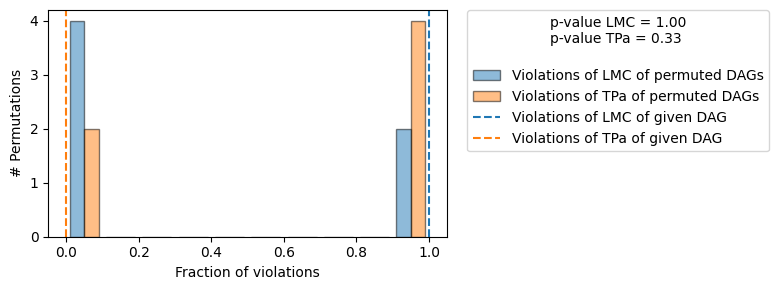

Evaluated the performance of the causal mechanisms and the invertibility assumption of the causal mechanisms and the overall average KL divergence between generated and observed distribution and the graph structure. The results are as follows:

==== Evaluation of Causal Mechanisms ====
The used evaluation metrics are:
- KL divergence (only for root-nodes): Evaluates the divergence between the generated and the observed distribution.
- Mean Squared Error (MSE): Evaluates the average squared differences between the observed values and the conditional expectation of the causal mechanisms.
- Normalized MSE (NMSE): The MSE normalized by the standard deviation for better comparison.
- R2 coefficient: Indicates how much variance is explained by the conditional expectations of the mechanisms. Note, however, that this can be misleading for nonlinear relationships.
- F1 score (only for categorical non-root nodes): The harmonic mean of the precision and recall indicating the goodness of the under

In [449]:
print(gcm.evaluate_causal_model(causal_model, casual))

In [653]:
#Step 3: Answering a causal query based on the SCM

sampless = gcm.interventional_samples(causal_model,
                                     {'Infant_pneumonia': lambda Infant_pneumonia: 0 },
                                     num_samples_to_draw=10)
sampless.head(10)

,Infant_RDS,Infant_pneumonia,Infant_Sepsis
0,0,0,0
1,1,0,0
2,0,0,-1
3,0,0,0
4,0,0,0
5,1,0,-1
6,0,0,0
7,0,0,0
8,1,0,0
9,0,0,0


In [654]:
sampless['Infant_Sepsis'].unique()

array([ 0, -1], dtype=int32)

In [657]:
causal_model = gcm.ProbabilisticCausalModel(nx.DiGraph([('Hpertensive', 'Infant_Sepsis')])) # X -> Y -> Z
gcm.auto.assign_causal_mechanisms(causal_model, casual)
 

In [658]:
gcm.fit(causal_model, casual)

Fitting causal mechanism of node Infant_Sepsis: 100%|█| 2/2 [00:00<00:00,  5.86i


In [666]:
samples = gcm.interventional_samples(causal_model,
                                     {'Hpertensive': lambda Hpertensive: 1},
                                     num_samples_to_draw=200)

In [664]:
samples.head(10)

,Hpertensive,Infant_Sepsis
0,2,0
1,2,0
2,2,0
3,2,0
4,2,0
5,2,0
6,2,0
7,2,0
8,2,0
9,2,0


In [667]:
samples.value_counts()

Hpertensive  Infant_Sepsis
1             0               179
             -1                21
Name: count, dtype: int64

In [661]:
samples['Infant_Sepsis'].unique()

array([ 0, -1], dtype=int32)

In [694]:
from cdt.causality.graph import LiNGAM

In [ ]:
causal_graph = LiNGAM().predict(dataset)

In [836]:
data=casual[['Infant_Asphyxia',
      'Infant_Congenital_Malformation', 
      'Infant_RDS', 'Infant_DIC',
      'Infant_pphn',
      'Infant_ivh',
      'Infant_pneumonia',
      'Infant_meningitis',
      'Infant_NEC',
      'Infant_Apnea',
      'Infant_jaundice',
      'Infant_anemia',
      'Infant_Renalfailure',
      'Infant_Tetanus',
      'Infant_hypoglycaemia',
      'Maternal_Obstructedlabor',
      'Maternal_Cordprolapse',
      'Maternal_Fetal_distress',
      'Maternal_Antenatalhemorrhage',
      'Maternal_Preeclampsia_Eclampsia',
      'Maternal_MaternalSignsOfInfection',
      'Maternal_Chorioamnionitis',
      'Infant_Apnea',
      'Infant_hypothermia',
      'maternalage',
      'Priorpregnancies_LessThan_20weeks',
      'numberofpregnanciesEndedAfter20weeks',
      'AntenatalCareRecieved',
      'NumberOfANCVisit',
      'NICU',
      'rhf',
      'HIV_status',
      'Diabetes',
      'Malaria',
      'Hpertensive',
      'Antepartum',        
      'PregnancyType',
      'Chorioamnionitis',
      'Cordprolapse',
      'Ruptureduterus',
      'Intra_partum_monitoring',
      'Infant_Sepsis']]

In [ ]:
from causallearn.search.ConstraintBased.PC import pc

labels = [f'{col}' for i, col in enumerate(data.columns)]
data = data.to_numpy()

cg = pc(data)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(cg.G, labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.figure(figsize=(40,14))
plt.imshow(img)
plt.show()

In [812]:
from causallearn.search.ScoreBased.GES import ges

# default parameters
Record = ges(data)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(Record['G'], labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

Starting in v1.3, whiten='unit-variance' will be used by default.
FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
divide by zero encountered in log
invalid value encountered in divide
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=3.399e+07, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 2 iterations, alpha=3.399e+07, previous alpha=4.204e-02, with an active set of 1 regressors.


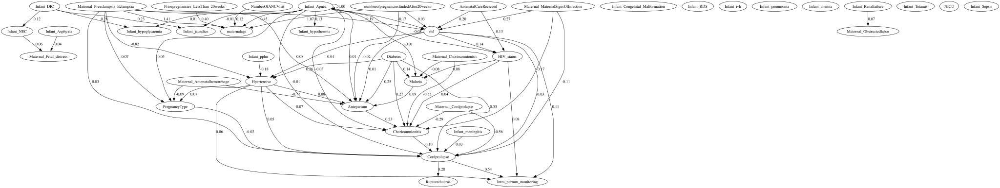

In [777]:
from causallearn.search.FCMBased import lingam
model = lingam.ICALiNGAM()
model.fit(data)

from causallearn.search.FCMBased.lingam.utils import make_dot
make_dot(model.adjacency_matrix_, labels=labels)

Starting in v1.3, whiten='unit-variance' will be used by default.
FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
divide by zero encountered in log
invalid value encountered in divide
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=4.085e+08, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.552e-04, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=5.480e-05, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor

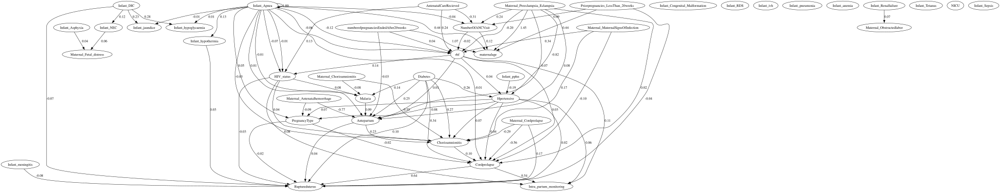

In [839]:
from causallearn.search.FCMBased import lingam
model = lingam.ICALiNGAM()
model.fit(data)

from causallearn.search.FCMBased.lingam.utils import make_dot
make_dot(model.adjacency_matrix_, labels=labels)

In [ ]:
#Casual graph only for RDS

In [846]:

RDSdata=casual[['Infant_anemia',
'Maternal_Fetal_distress',
'Infant_hypothermia',
'Hpertensive',
'PregnancyType',
'Maternal_Cordprolapse',
'Infant_ivh',
'Infant_Apnea',
'AntenatalCareRecieved',
'Infant_hypoglycaemia',
'Infant_NEC',
'Maternal_Obstructedlabor',
'Maternal_MaternalSignsOfInfection',
'numberofpregnanciesEndedAfter20weeks',
'maternalage',
'Infant_RDS']]

Depth=3, working on node 15: 100%|████████████| 16/16 [00:00<00:00, 2134.23it/s]


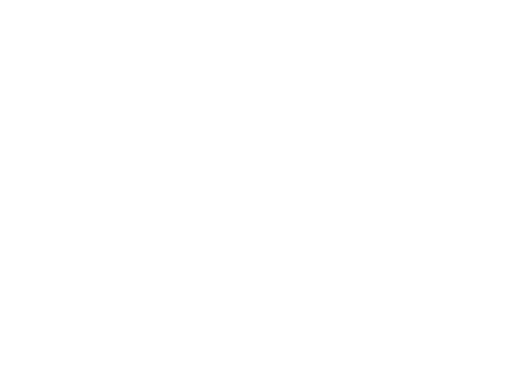

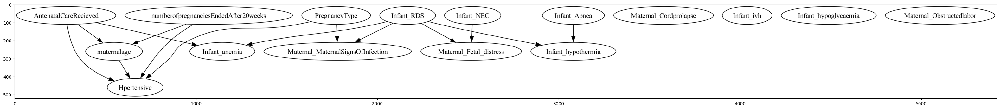

In [848]:
from causallearn.search.ConstraintBased.PC import pc

labels = [f'{col}' for i, col in enumerate(RDSdata.columns)]
RDSdata = RDSdata.to_numpy()

cg = pc(RDSdata)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(cg.G, labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.figure(figsize=(40,14))
plt.imshow(img)
plt.show()

Starting in v1.3, whiten='unit-variance' will be used by default.


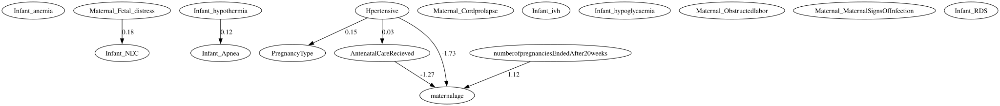

In [849]:
from causallearn.search.FCMBased import lingam
model = lingam.ICALiNGAM()
model.fit(RDSdata)

from causallearn.search.FCMBased.lingam.utils import make_dot
make_dot(model.adjacency_matrix_, labels=labels)